# decappingQuantification.ipynb
## Marcus Viscardi,    April 15, 2024

Check out `README.md` for a more overarching view of what is happening here.

Specifically, the goal is to produce comparisons of true full-length reads (spanning out to the TSS) and the reads that have cleavages near their stop codons (and the other reads).

The largest choice to make here, is if we want to manually annotate a subset of genes to look at for this, or if we should rather look into a reference-based approach. I think the reference-based approach is likely to be more robust, but it will require a big up-front investment in time to get the reference data in a usable format.

Initially, I think I will start with the manual annotation approach, as it will be quicker to get started with and will allow me to get a better feel for the data and the types of things that I will be looking for.

In [1]:
from typing import Tuple

import nanoporePipelineCommon as npCommon

import numpy as np
import pandas as pd

import re

import seaborn as sea
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go

from tqdm.auto import tqdm

from icecream import ic
from datetime import datetime

from pathlib import Path

from scipy.stats import mannwhitneyu, ks_2samp

pd.set_option('display.width', 200)
pd.set_option('display.max_columns', None)

def __time_formatter__():
    now = datetime.now().strftime("%Y-%m-%d %H:%M:%S")
    return f"ic: {now} | > "
ic.configureOutput(prefix=__time_formatter__)

_ = ic("Imports done!")

ic: 2024-04-30 14:42:53 | > 'Imports done!'


In [2]:
gtf_parquet_path = Path("/data16/marcus/genomes/plus_cerENO2_elegansRelease100/230327_allChrs_plus-cerENO2.gtf.parquet")

gtf_df = pd.read_parquet(gtf_parquet_path)

current_dir = Path.cwd()

In [3]:
obj_dict = {}
libs_to_run = [
    "oldN2",
    # "oldS6",
    "newerN2",
    "newerS6",
    "newerS5",
    "thirdN2",
    "thirdS5",
    "thirdS6",
]
for lib in libs_to_run:
    print(f"\nLoading {lib}...", end="")
    obj = npCommon.NanoporeRun(run_nickname=lib)
    obj_dict[lib] = obj
    print(" Done!")
    obj.load_mergedOnReads()
    obj.load_nmd_targets(return_sambamobj=False)


Loading oldN2... Done!
Loading 240219_mergedOnReads.parquet... Done. Loaded 701,680 rows.

Loading newerN2... Done!
Loading 230327_mergedOnReads.plusStandards.parquet... Done. Loaded 1,053,185 rows.

Loading newerS6... Done!
Loading 230403_mergedOnReads.plusStandards.parquet... Done. Loaded 1,226,144 rows.

Loading newerS5... Done!
Loading 230410_mergedOnReads.plusStandards.parquet... Done. Loaded 557,991 rows.

Loading thirdN2... Done!
Loading 230920_mergedOnReads.plusStandards.parquet... Done. Loaded 1,186,602 rows.

Loading thirdS5... Done!
Loading 230920_mergedOnReads.plusStandards.parquet... Done. Loaded 1,440,373 rows.

Loading thirdS6... Done!
Loading 230918_mergedOnReads.plusStandards.parquet... Done. Loaded 560,899 rows.


In [4]:
def histo_plot_ends(test_gene, gtf_df, obj_dict, flanking_dist=200):
    gtf_for_gene = gtf_df.query("gene_name == @test_gene")
    start, end = gtf_for_gene.query("feature == 'gene'").loc[:, ['start', 'end']].values[0]
    
    strand = gtf_for_gene.query("feature == 'gene'").loc[:, 'strand'].values[0]
    print(f"Gene target ({test_gene}) on strand: {strand}")
    
    stop_locations = gtf_for_gene.query("feature == 'stop_codon'").loc[:, 'start'].values
    start_sites = gtf_for_gene.query("feature == 'transcript'").loc[:, 'start'].values
    
    fig, axes = plt.subplots(2, 1, figsize=(10, 5), sharex=True)
    ax1, ax2 = axes
    
    sea.histplot(data=obj_dict['thirdN2'].mergedOnReads_df.query('gene_name == @test_gene and t5 == 0'),
                 x='chr_pos',
                 binwidth=10,
                 # stat='percent',
                 common_norm=False,
                 ax=ax1,
                 color='k',
                 alpha=0.5)
    ax1.set_ylabel('Unadapted Reads')
    sea.histplot(data=obj_dict['thirdN2'].mergedOnReads_df.query('gene_name == @test_gene and t5 == 1'),
                 x='chr_pos',
                 binwidth=10,
                 # stat='percent',
                 common_norm=False,
                 ax=ax2,
                 color='r',
                 alpha=0.5)
    ax2.set_ylabel('Adapted Reads')
    
    for stop_loc in stop_locations:
        ax1.axvline(stop_loc, color='r', linestyle='--')
        ax2.axvline(stop_loc, color='r', linestyle='--')
    for start_site in start_sites:
        ax1.axvline(start_site, color='g', linestyle='--')
        ax2.axvline(start_site, color='g', linestyle='--')
    
    ax1.set_xlim(start-flanking_dist, end+flanking_dist)
    ax2.set_xlim(start-flanking_dist, end+flanking_dist)
    
    plt.title(test_gene)
    plt.tight_layout()
    plt.show()

genes = [
    'rps-22',
    'ubl-1',
    'rpl-30',
    # 'eef-1A.1',  # rev  # Something weird is going on...
    'rla-1',  # rev
    'rps-25',  # rev
    'Y37E3.8',  # rev
    'rpl-10',
    'rla-0',
    'rpl-18',
    'rps-3',
    'rpl-38',
    'rpl-24.1',
    # NMD Targets:
    # 'rpl-30',
    # 'ubl-1',
    # 'rps-22',
    'hel-1',
    'rpl-7A',
    'ZK228.4',
    'R06C1.4',
    'rpl-12',
    'pqn-70',
    'rsp-5',
    'rpl-1',
    'C53H9.2',
    'rpl-3',
    'rsp-6',
    'rpl-26',
    'K08D12.3',
    'aly-3',
]
for gene_to_plot in genes:
    # histo_plot_ends(gene_to_plot, gtf_df, obj_dict, flanking_dist=100)
    print(gene_to_plot)

rps-22
ubl-1
rpl-30
rla-1
rps-25
Y37E3.8
rpl-10
rla-0
rpl-18
rps-3
rpl-38
rpl-24.1
hel-1
rpl-7A
ZK228.4
R06C1.4
rpl-12
pqn-70
rsp-5
rpl-1
C53H9.2
rpl-3
rsp-6
rpl-26
K08D12.3
aly-3


In [5]:
UNANNOTATED_TSS_DICT = {  # these are manual annotations of stops that are not in the GTF file
    'rpl-7A': [4_390_579, 4_390_464],
}

UNANNOTATED_STOPS_DICT = {  # these are manual annotations of stops that are not in the GTF file
    'rps-22': [1_950_853],
    'rpl-30': [10_436_332],
}

def get_other_read_end(row):
    cigar = row['cigar']
    read_pos = row['chr_pos']
    if cigar is None:
        raise ValueError("Cigar is None!")
    if read_pos is None:
        raise ValueError("read_pos is None!")
    pattern = r"(\d*)([MDISN])"
    matches = re.findall(pattern, cigar)
    for match in matches:
        count, key = match
        if key in ['M', 'D', 'N']:
            read_pos += int(count)
    return read_pos

def near_a_tss_or_stop(row, _strand, tss_positions, stop_positions, col_for_pos='chr_pos', full_window_size=50, window_bias_downstream=0.50) -> Tuple[bool, bool]:
    chr_pos = row[col_for_pos]
    if _strand == '-':
        window_bias_downstream = 1 - window_bias_downstream
    elif _strand != '+':
        raise ValueError(f"Strand must be '+' or '-' not {_strand}")
    
    near_tss = False
    near_stop = False
    chr_pos_upstream = chr_pos - full_window_size * (1 - window_bias_downstream)
    chr_pos_downstream = chr_pos + full_window_size * window_bias_downstream
    for tss in set(tss_positions):
        if chr_pos_upstream <= tss <= chr_pos_downstream:
            near_tss = True
            break
    for stop in set(stop_positions):
        if chr_pos_upstream <= stop <= chr_pos_downstream:
            near_stop = True
            break
    return near_tss, near_stop

def convert_near_tss_and_stop_to_hue(row, tss_color='g', stop_color='r', neither_color='k', both_color='y'):
    near_tss, near_stop = row['near_tss'], row['near_stop']
    if near_tss and near_stop:
        return both_color
    elif near_tss:
        return tss_color
    elif near_stop:
        return stop_color
    else:
        return neither_color

def plot_gene_data(gtf_df, test_gene, plot_lib_objs_dict, window_size=60,
                   up_v_down_fraction=0.25, number_of_bins=40,
                   flanking_gene_fraction=0.05, current_dir=None, print_stats=False,
                   title_override=None, save_name_override=None):
    
    extra_stops_dict = UNANNOTATED_STOPS_DICT
    
    extra_tss_dict = UNANNOTATED_TSS_DICT
    
    gtf_for_gene = gtf_df.query("gene_name == @test_gene")
    gene_start, gene_end = gtf_for_gene.query("feature == 'gene'").loc[:, ['start', 'end']].values[0]
    gene_length = gene_end - gene_start
    bin_width = gene_length / number_of_bins
    flanking_dist = int(gene_length * flanking_gene_fraction)
    
    strand = gtf_for_gene.query("feature == 'gene'").loc[:, 'strand'].values[0]
    if print_stats:
        print(f"Gene target ({test_gene}) on strand: {strand}")
    if strand == '-':
        if print_stats:
            print("Because this gene is on the reverse strand, we will have to calculate out the other end of the reads with the CIGAR strings. This will take slightly longer.")
        stop_locations = gtf_for_gene.query("feature == 'stop_codon'").loc[:, 'end'].values
        start_sites = gtf_for_gene.query("feature == 'transcript'").loc[:, 'end'].values
        up_v_down_fraction = 1 - up_v_down_fraction
        flipped = True
    else:
        stop_locations = gtf_for_gene.query("feature == 'stop_codon'").loc[:, 'start'].values
        start_sites = gtf_for_gene.query("feature == 'transcript'").loc[:, 'start'].values
        flipped = False
        
    stop_locations = list(stop_locations)
    start_sites = list(start_sites)
    
    if test_gene in extra_stops_dict:
        for stop_location in extra_stops_dict[test_gene]:
            stop_locations.append(stop_location)
    if test_gene in extra_tss_dict:
        for tss_location in extra_tss_dict[test_gene]:
            start_sites.append(tss_location)
    
    fig = plt.figure(figsize=(11, 1.5 * len(plot_lib_objs_dict)))
    
    gs = fig.add_gridspec(len(plot_lib_objs_dict), 5,
                          width_ratios=[4, 4, 1, 1, 1.5],
                          ) 
    
    for i, (lib, lib_obj) in enumerate(plot_lib_objs_dict.items()):

        if print_stats:
            print(f"\t{lib}:")
        ax1, ax2, ax3, ax4, ax5 = [fig.add_subplot(gs[i, j]) for j in range(5)]
        
        if i == 0:
            ax1.set_title("Unadapted 5' Ends")
            ax2.set_title("Adapted 5' Ends")
            ax3.set_title("Near TSS")
            ax4.set_title("Near Stop")
            ax5.set_title("Lib Stats")
        
        gene_df = lib_obj.mergedOnReads_df.query('gene_name == @test_gene').copy()
        gene_df.replace({'t5': {0: '-', 1: '+', '+': '+', '-': '-'}}, inplace=True)
        if flipped:
            gene_df.loc[:, 'chr_pos'] = gene_df.apply(get_other_read_end, axis=1)
        gene_df.loc[:, 'near_tss'], gene_df.loc[:, 'near_stop'] = zip(*gene_df.apply(near_a_tss_or_stop, args=(strand, start_sites, stop_locations),
            full_window_size=window_size, window_bias_downstream=up_v_down_fraction, axis=1))
        gene_df.loc[:, 'hue'] = gene_df.apply(convert_near_tss_and_stop_to_hue, axis=1)
        
        unadapted_df = gene_df.query('t5 == 0 or t5 == "-"')
        unadapted_value_counts = unadapted_df['near_tss'].value_counts(normalize=True)
        if print_stats:
            print(f"\t\tUnadapted Read Distribution (near a TSS):")
            print(f"\t\t\t True: {unadapted_value_counts.get(True, 0.0):%}")
            print(f"\t\t\tFalse: {unadapted_value_counts.get(False, 0.0):%}")
        if not unadapted_df.empty:
            sea.histplot(data=unadapted_df,
                         x='chr_pos',
                         hue='hue',
                         palette={'r': 'r', 'g': 'g', 'k': 'k', 'y': 'y'},
                         binwidth=bin_width,
                         ax=ax1,
                         edgecolor='k', linewidth=1.0,
                         )
            ax1.get_legend().remove()
            data_ct = pd.crosstab(index=gene_df['t5'], columns=gene_df['near_tss'])
            data_ct = data_ct.div(data_ct.sum(axis=1), axis=0) * 100
            data_ct.sort_index(ascending=False, inplace=True)
            
            color_dict = {True: 'g', False: 'k', None: 'y'}
            try:
                data_ct.plot(kind='bar',
                             stacked=True,
                             ax=ax3,
                             color=[color_dict[col] for col in data_ct.columns],
                             )
            except ValueError as e:
                print(f"Error: {e}")
                print(data_ct)
            ax3.set_ylabel ("") # ("% Near TSS")
            ax3.get_legend().remove()
        else:
            ax1.text(0.5, 0.5, "No Data", horizontalalignment='center', verticalalignment='center', transform=ax1.transAxes)
            print(lib_obj.mergedOnReads_df.query('gene_name == @test_gene').head())
        ax1.set_ylabel(f"-- {lib} --")
        
        adapted_df = gene_df.query('t5 == 1 or t5 == "+"')
        adapted_value_counts = adapted_df['near_stop'].value_counts(normalize=True)
        if print_stats:
            print(f"\t\tAdapted Read Distribution (near a STOP):")
            print(f"\t\t\t True: {adapted_value_counts.get(True, 0.0):%}")
            print(f"\t\t\tFalse: {adapted_value_counts.get(False, 0.0):%}")
        if not adapted_df.empty:
            sea.histplot(data=adapted_df,
                         x='chr_pos',
                         hue='hue',
                         palette={'r': 'r', 'g': 'g', 'k': 'k', 'y': 'y'},
                         binwidth=bin_width,
                         ax=ax2,
                         edgecolor='k', linewidth=1.0,
                         )
            ax2.get_legend().remove()
            data_ct = pd.crosstab(index=gene_df['t5'], columns=gene_df['near_stop'])
            data_ct = data_ct.div(data_ct.sum(axis=1), axis=0) * 100
            data_ct.sort_index(ascending=False, inplace=True)
            
            color_dict = {True: 'r', False: 'k', None: 'y'}
            try:
                data_ct.plot(kind='bar',
                             stacked=True,
                             ax=ax4,
                             color=[color_dict[col] for col in data_ct.columns],
                             )
            except ValueError as e:
                print(f"Error: {e}")
                print(data_ct)
            ax4.set_ylabel("")  #("% Near Stop")
            ax4.get_legend().remove()
        else:
            ax2.text(0.5, 0.5, "No Data", horizontalalignment='center', verticalalignment='center', transform=ax2.transAxes)
        ax2.set_ylabel(f"")
        
        ax1.set_xlim(gene_start-flanking_dist, gene_end+flanking_dist)
        ax2.set_xlim(gene_start-flanking_dist, gene_end+flanking_dist)
        ax1.set_xlabel(f"")
        ax2.set_xlabel(f"")
        ax1.set_xticklabels([])
        ax2.set_xticklabels([])
        
        ax3.set_xlabel(f"")
        ax4.set_xlabel(f"")
        ax3.set_xticklabels(['Unad', 'Ad'], rotation=0)
        ax4.set_xticklabels(['Unad', 'Ad'], rotation=0)
        
        precompute_transforms = {ax1: ax1.get_xaxis_transform(),
                                 ax2: ax2.get_xaxis_transform()}
        for stop_loc in set(stop_locations):
            for ax in [ax1, ax2]:
                ax.axvline(stop_loc, color='r', linestyle='--', alpha=0.5)
                ax.axvspan(stop_loc-window_size*up_v_down_fraction,
                           stop_loc+window_size*(1-up_v_down_fraction),
                           color='r', alpha=0.1)
                blend_transform = precompute_transforms[ax]
                ax.text(stop_loc, -0.1, "*", rotation=0,
                        verticalalignment='top', horizontalalignment='center',
                        transform=blend_transform,
                        fontsize=14)
        for start_site in set(start_sites):
            for ax in [ax1, ax2]:
                ax.axvline(start_site, color='g', linestyle='--', alpha=0.5)
                ax.axvspan(start_site-window_size*up_v_down_fraction,
                           start_site+window_size*(1-up_v_down_fraction),
                           color='g', alpha=0.1)
                blend_transform = precompute_transforms[ax]
                if flipped:
                    tss_icon = "<"
                else:
                    tss_icon = ">"
                ax.text(start_site, -0.05, tss_icon, rotation=0,
                        verticalalignment='top', horizontalalignment='center',
                        transform=blend_transform,
                        fontsize=12)
        
        
                # Create annotations to put in ax5
        ada_near_stop_count = adapted_df.query('near_stop').shape[0]
        ada_near_tss_count = adapted_df.query('near_tss').shape[0]
        unada_near_stop_count = unadapted_df.query('near_stop').shape[0]
        unada_near_tss_count = unadapted_df.query('near_tss').shape[0]
        ada_total_count = adapted_df.shape[0]
        unada_total_count = unadapted_df.shape[0]
        ada_stop_over_FL_string = f"{ada_near_stop_count}/{unada_near_tss_count} ({ada_near_stop_count/unada_near_tss_count:.2%})"
        ada_tss_over_FL_string = f"{ada_near_tss_count}/{unada_near_tss_count} ({ada_near_tss_count/unada_near_tss_count:.2%})"
        ax5.axis('off')
        plot_string = (
            f"Adapted Near Stop:   {ada_near_stop_count}\n"
            f"Adapted Near TSS:    {ada_near_tss_count}\n"
            f"Total Adapted:       {ada_total_count}\n"
            f"Unadapted Near Stop: {unada_near_stop_count}\n"
            f"Unadapted Near TSS:  {unada_near_tss_count}\n"
            f"Total Unadapted:     {unada_total_count}\n"
            f"Ada Stop/Unada FL: {ada_stop_over_FL_string}\n"
            f"Ada  TSS/Unada FL: {ada_tss_over_FL_string}"
        )
        ax5.text(-0.5, 0.4, plot_string,
                 fontsize=8,
                 fontfamily='monospace',
                 horizontalalignment='left',
                 verticalalignment='center',
                 # transform=ax5.transAxes,
                 )
    if isinstance(title_override, str):
        plt.suptitle(title_override)
    else:
        plt.suptitle(f"{test_gene} ({strand} strand)")
    plt.tight_layout()
    if current_dir is not None:
        if isinstance(save_name_override, str):
            plt.savefig(current_dir / 'plots' / '5PrimeEndsPerGene' / f"{save_name_override}.png", dpi=300)
            plt.savefig(current_dir / 'plots' / '5PrimeEndsPerGene' / f"{save_name_override}.svg")
        else:
            plt.savefig(current_dir / 'plots' / '5PrimeEndsPerGene' / f"{test_gene}_5PrimeEnds.png", dpi=300)
            plt.savefig(current_dir / 'plots' / '5PrimeEndsPerGene' / f"{test_gene}_5PrimeEnds.svg")
    plt.show()

plot_libs = [
    'oldN2',
    'newerN2',
    'newerS6',
    'newerS5',
    'thirdN2',
    'thirdS5',
    'thirdS6',
]
plot_lib_objs_dict = {lib: obj_dict[lib] for lib in plot_libs}

plot_genes = genes[:]

for test_gene in plot_genes[:]:
    print(f"{test_gene:#^50}")
    try:
        # plot_gene_data(gtf_df, test_gene, plot_lib_objs_dict, current_dir=current_dir, print_stats=False)
        pass
    except Exception as e:
        print(f"Error: {e}")
        continue

######################rps-22######################
######################ubl-1#######################
######################rpl-30######################
######################rla-1#######################
######################rps-25######################
#####################Y37E3.8######################
######################rpl-10######################
######################rla-0#######################
######################rpl-18######################
######################rps-3#######################
######################rpl-38######################
#####################rpl-24.1#####################
######################hel-1#######################
######################rpl-7A######################
#####################ZK228.4######################
#####################R06C1.4######################
######################rpl-12######################
######################pqn-70######################
######################rsp-5#######################
######################rpl-1####

In [6]:
gene_ids_to_names_dict = gtf_df.query('feature == "gene"').set_index('gene_id')['gene_name'].to_dict()
gene_names_to_ids_dict = gtf_df.query('feature == "gene"').set_index('gene_name')['gene_id'].to_dict()
for gene_name in plot_genes:
    gene_id = gene_names_to_ids_dict[gene_name]
    print(f"{gene_name:>10} -> {gene_id}")
gene_ids = [gene_names_to_ids_dict[gene_name] for gene_name in plot_genes]

    rps-22 -> WBGene00004491
     ubl-1 -> WBGene00006725
    rpl-30 -> WBGene00004444
     rla-1 -> WBGene00004409
    rps-25 -> WBGene00004494
   Y37E3.8 -> WBGene00021350
    rpl-10 -> WBGene00004421
     rla-0 -> WBGene00004408
    rpl-18 -> WBGene00004430
     rps-3 -> WBGene00004472
    rpl-38 -> WBGene00004452
  rpl-24.1 -> WBGene00004436
     hel-1 -> WBGene00001840
    rpl-7A -> WBGene00004419
   ZK228.4 -> WBGene00013947
   R06C1.4 -> WBGene00011059
    rpl-12 -> WBGene00004424
    pqn-70 -> WBGene00004152
     rsp-5 -> WBGene00004702
     rpl-1 -> WBGene00004412
   C53H9.2 -> WBGene00016907
     rpl-3 -> WBGene00004414
     rsp-6 -> WBGene00004703
    rpl-26 -> WBGene00004440
  K08D12.3 -> WBGene00019537
     aly-3 -> WBGene00000122


In [7]:
import pysam

def load_simple_nmd_targets(nmd_targets_path, target_gene_ids_to_names_dict) -> pd.DataFrame:
    target_gene_names_to_ids_dict = {v: k for k, v in target_gene_ids_to_names_dict.items()}
    reads_dict = {}
    with pysam.AlignmentFile(nmd_targets_path, 'rb') as test_bam:
        for read in test_bam.fetch():
            read_assigned_gene_id = read.get_tag('gA')
            # print(read.query_name, read_assigned_gene_id, target_gene_ids_to_names_dict[read_assigned_gene_id], read.get_tag('t5'), read.get_tag('nC'))
            reads_dict[read.query_name] = {
                'gene_id': read_assigned_gene_id,
                'gene_name': target_gene_ids_to_names_dict[read_assigned_gene_id],
                't5': read.get_tag('t5'),
                'nmd_assignment': read.get_tag('nC'),
                'cigar': read.cigarstring,
                'chr_pos': read.reference_start,
                'chr': read.reference_name,
                'seq': read.query_sequence,
            }
    df = pd.DataFrame(reads_dict).T
    return df

nmd_genes = []

for lib, lib_obj in obj_dict.items():
    print(f"Loading {lib} NMD Targets from {lib_obj.nmd_targets_bam_path}...", end="")
    lib_obj.load_nmd_targets(return_sambamobj=False)
    print(" Done!")
    lib_obj.nmd_targets_df = load_simple_nmd_targets(lib_obj.nmd_targets_bam_path, gene_ids_to_names_dict)
    # print(lib_obj.nmd_targets_df.gene_name.unique())
    nmd_genes.extend(lib_obj.nmd_targets_df.gene_name.unique())
nmd_genes = list(set(nmd_genes))
print(nmd_genes)

Loading oldN2 NMD Targets from /data16/marcus/working/211118_nanoporeRun_totalRNA_5108_xrn-1-KD_5TERA/output_dir/NMD_targets/240429_nmd_targets.all.merge.bam... Done!
Loading newerN2 NMD Targets from /data16/marcus/working/230327_nanoporeRun_totalRNA_wt_xrn-1-KD_5TERA_rerun/output_dir/NMD_targets/240429_nmd_targets.all.merge.bam... Done!
Loading newerS6 NMD Targets from /data16/marcus/working/230403_nanoporeRun_totalRNA_smg-6_xrn-1-KD_5TERA_rerun/output_dir/NMD_targets/240429_nmd_targets.all.merge.bam... Done!
Loading newerS5 NMD Targets from /data16/marcus/working/230410_nanoporeRun_totalRNA_smg-5_xrn-1-KD_5TERA_rerun/output_dir/NMD_targets/240429_nmd_targets.all.merge.bam... Done!
Loading thirdN2 NMD Targets from /data16/marcus/working/230918_nanoporeRun_sMV013_wt_xrn-1-KD_5TERA/output_dir/NMD_targets/240429_nmd_targets.all.merge.bam... Done!
Loading thirdS5 NMD Targets from /data16/marcus/working/230918_nanoporeRun_sMV014_smg-5_xrn-1-KD_5TERA/output_dir/NMD_targets/240429_nmd_target

######################rpl-7A######################


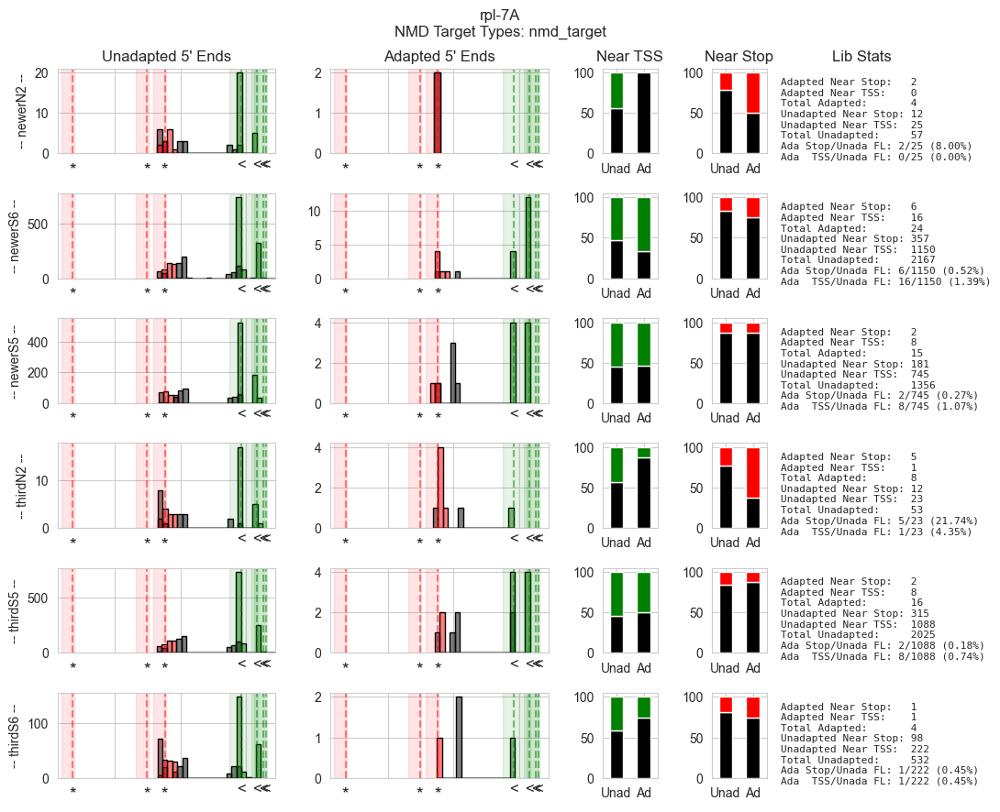

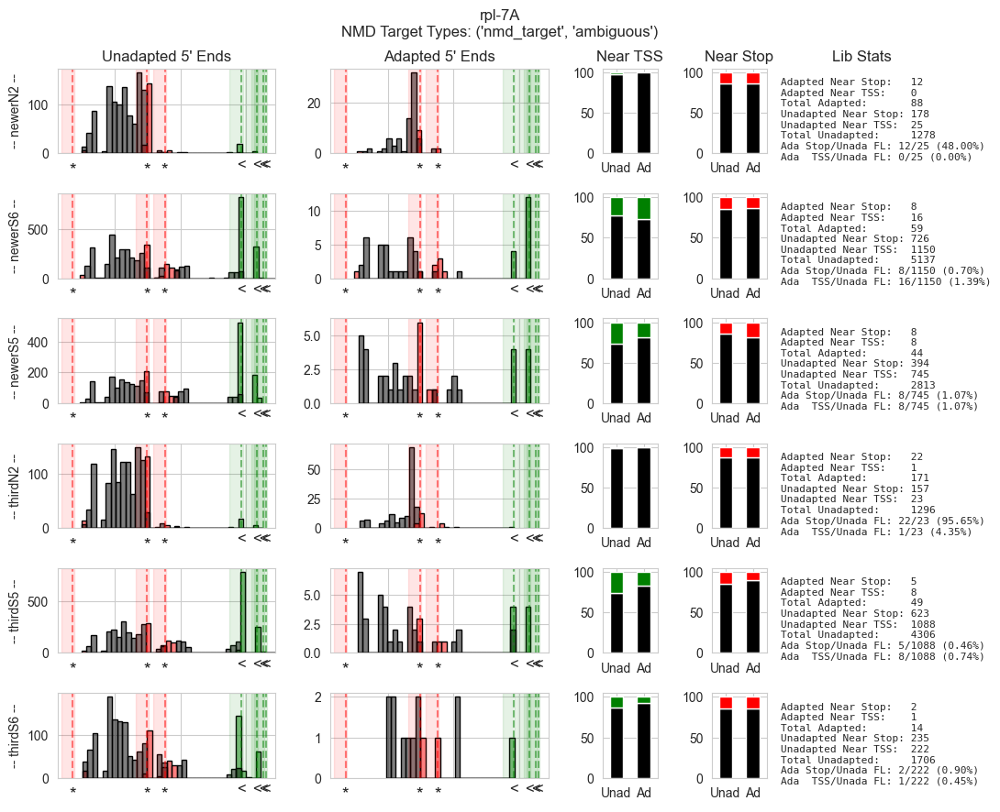

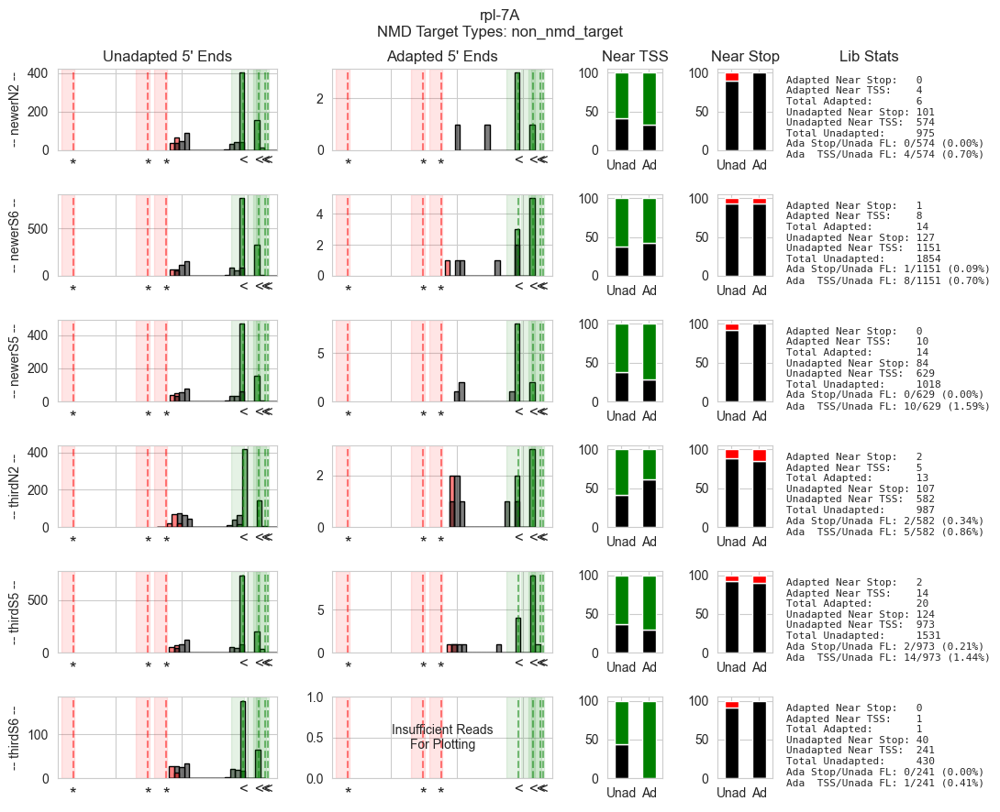

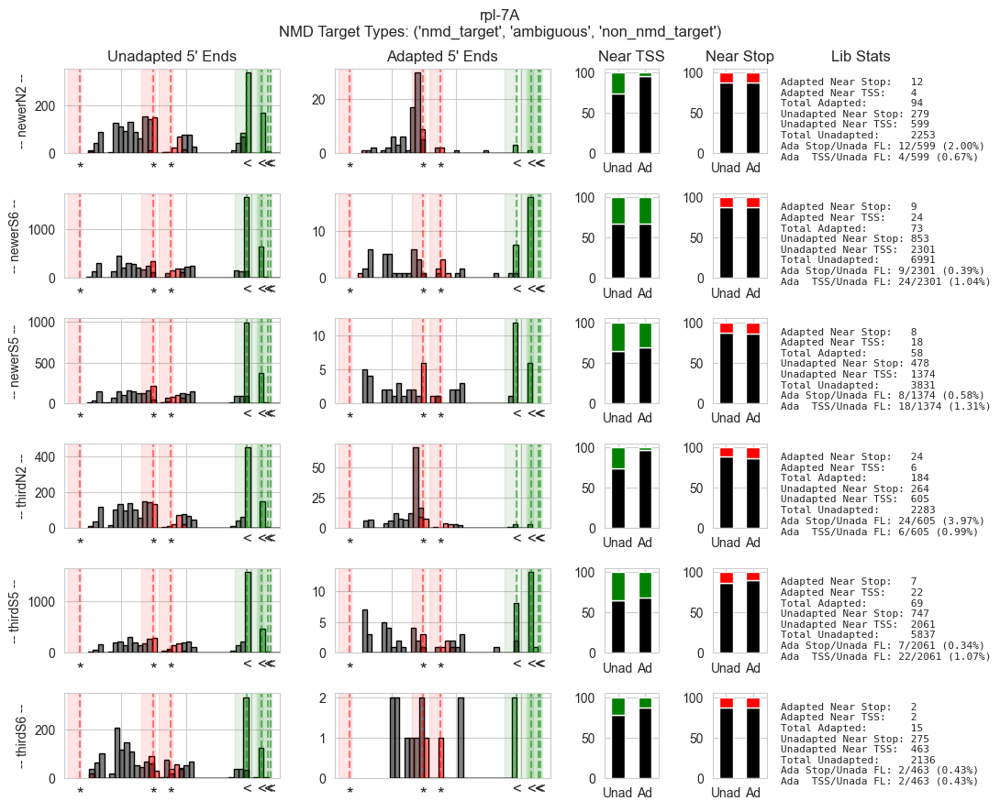

#####################R06C1.4######################


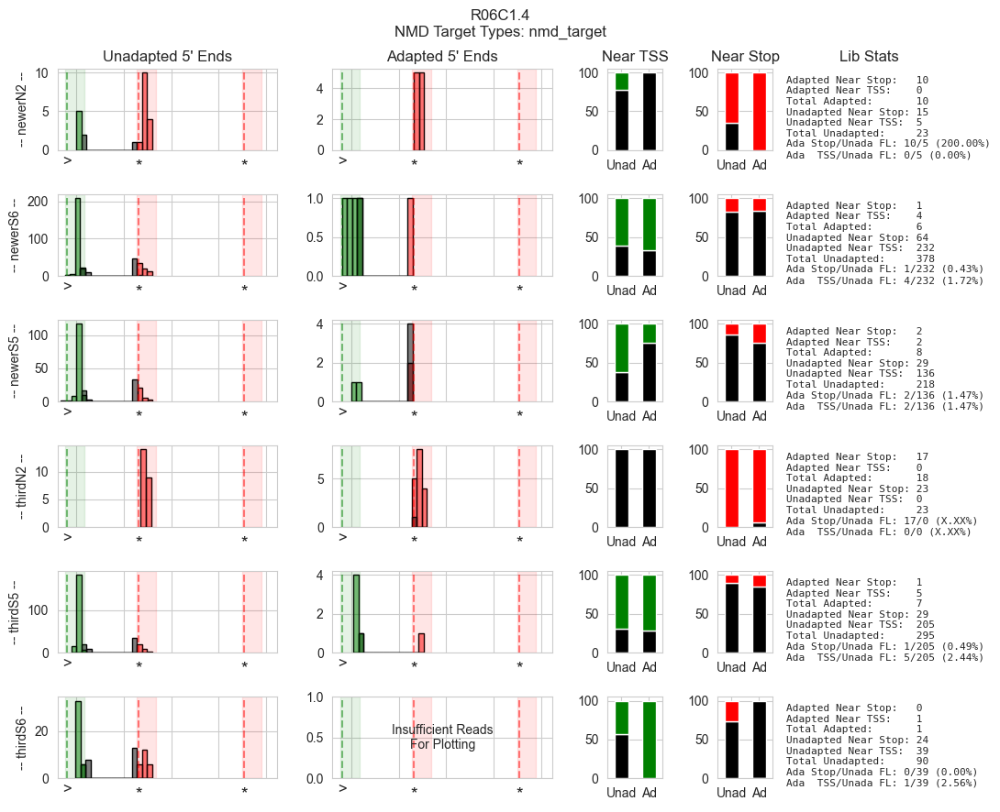

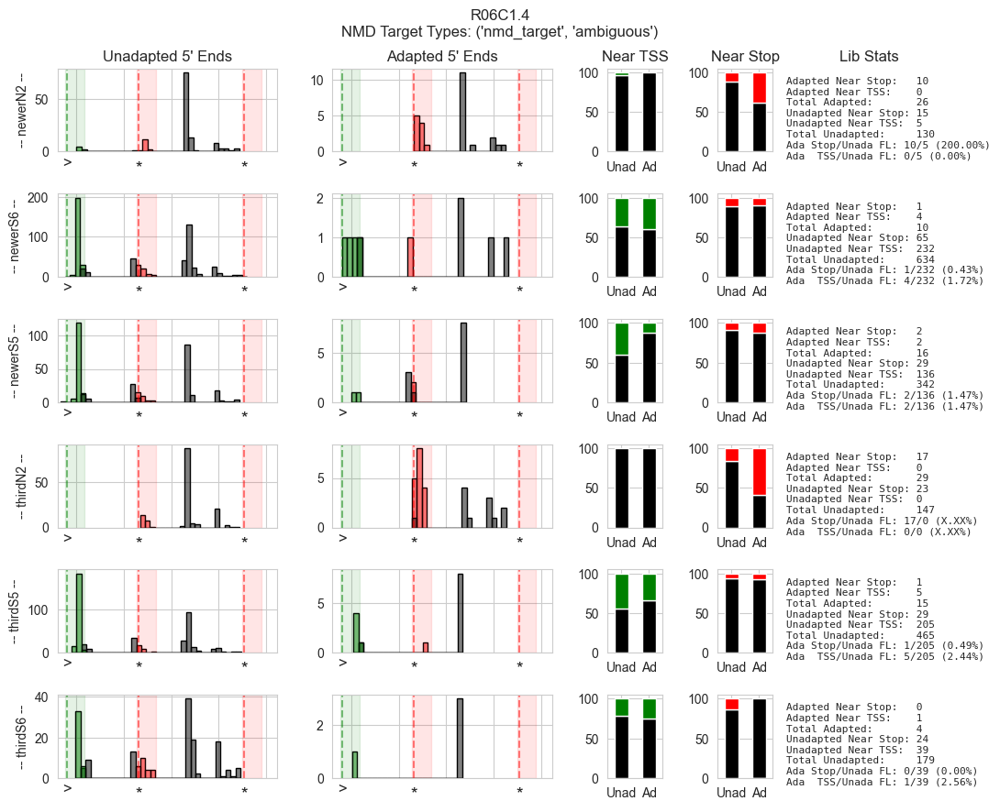

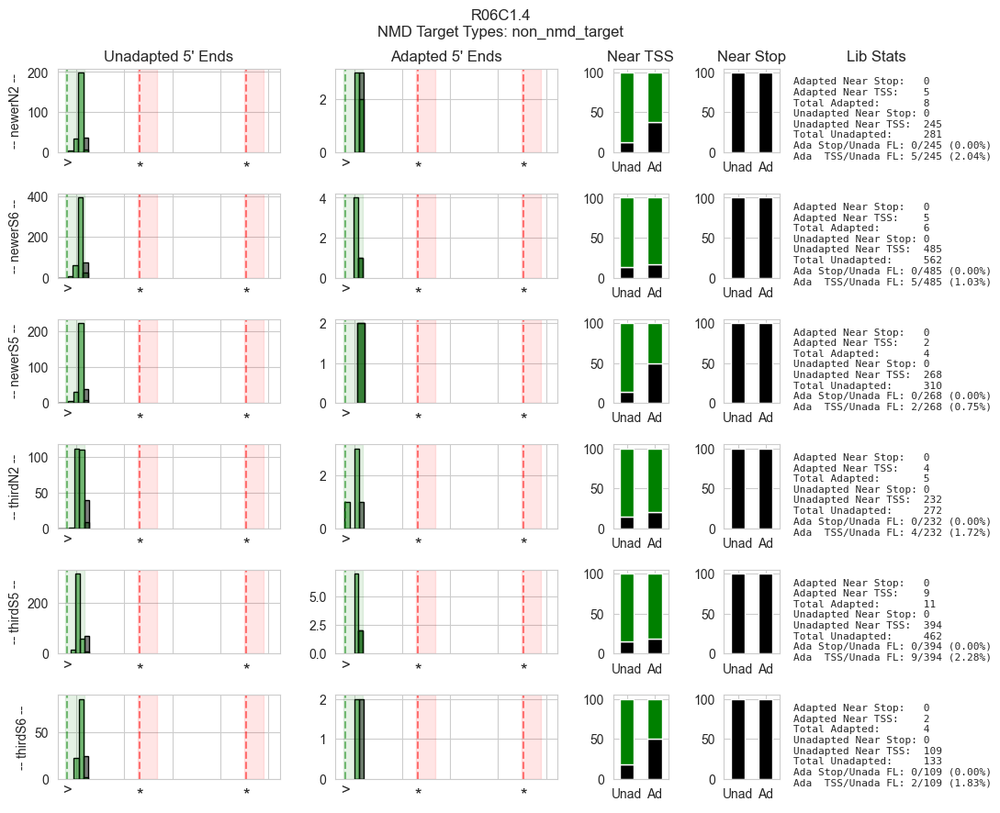

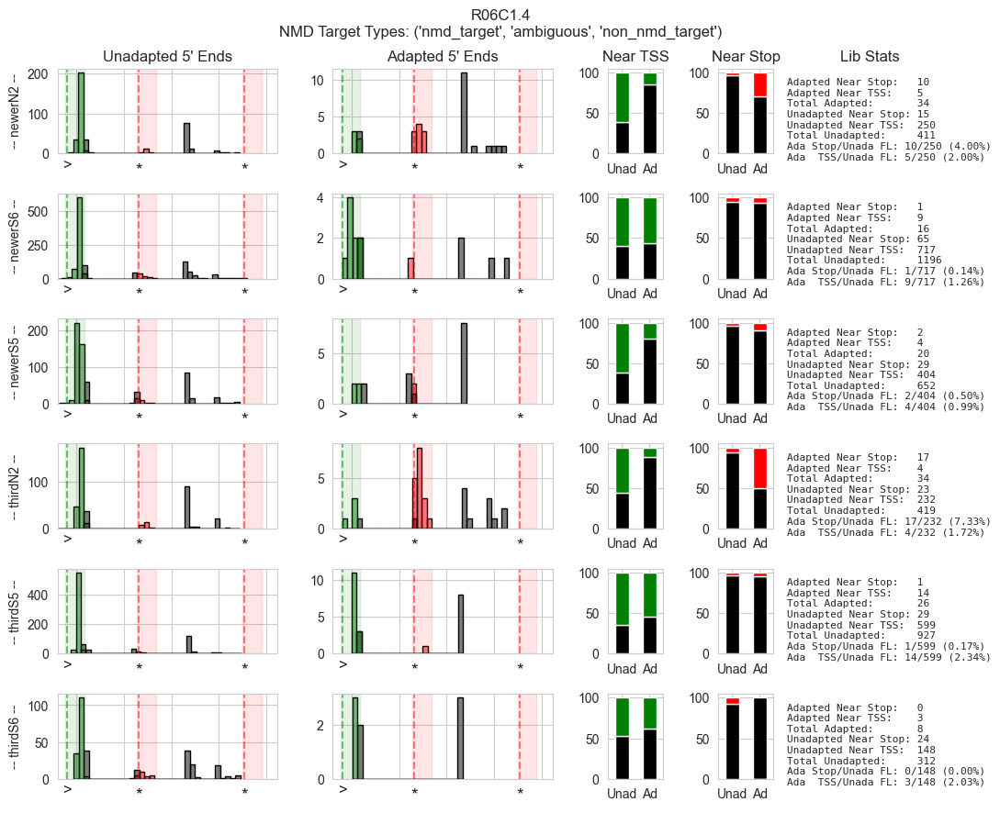

######################rpl-12######################


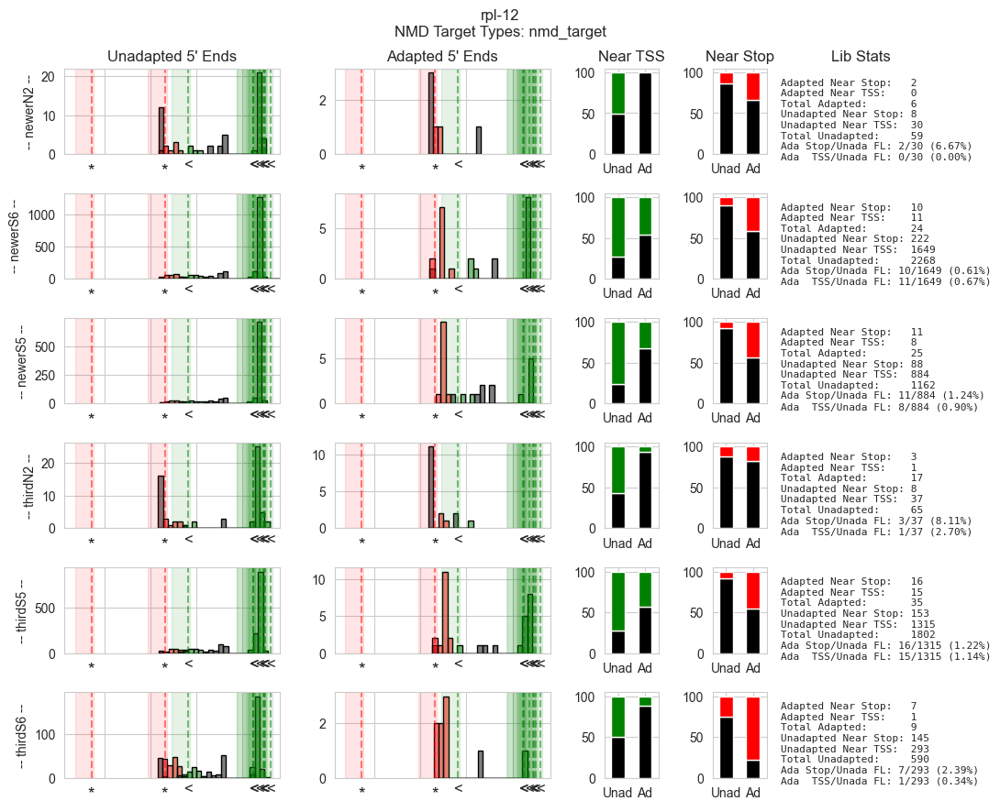

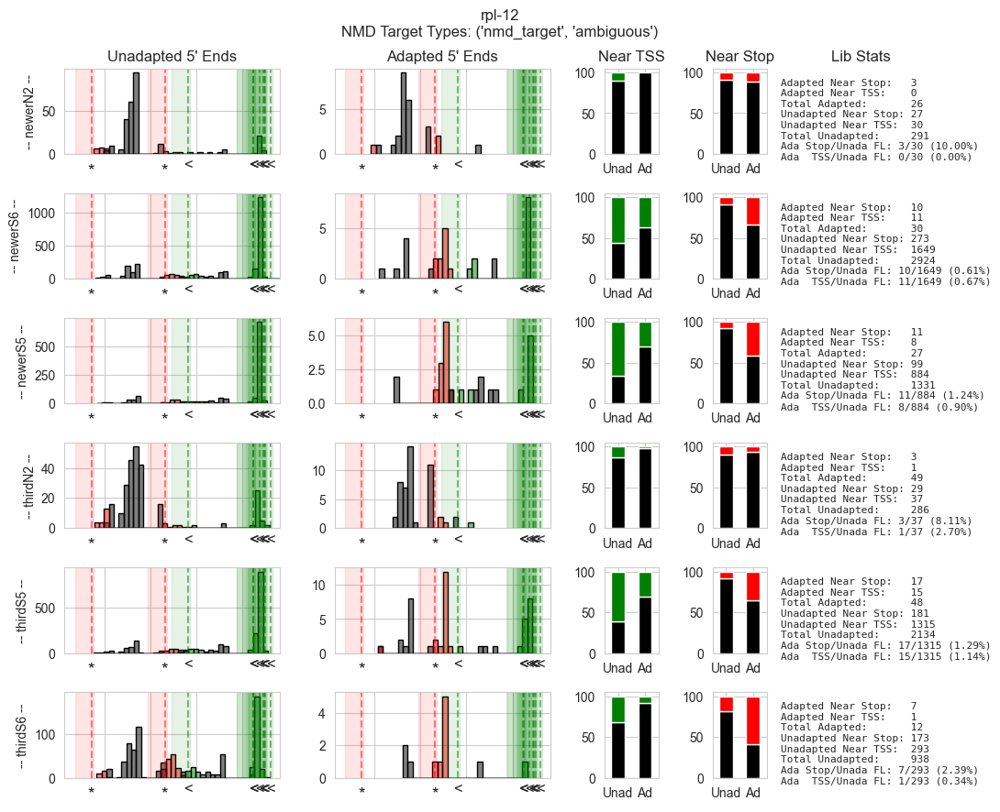

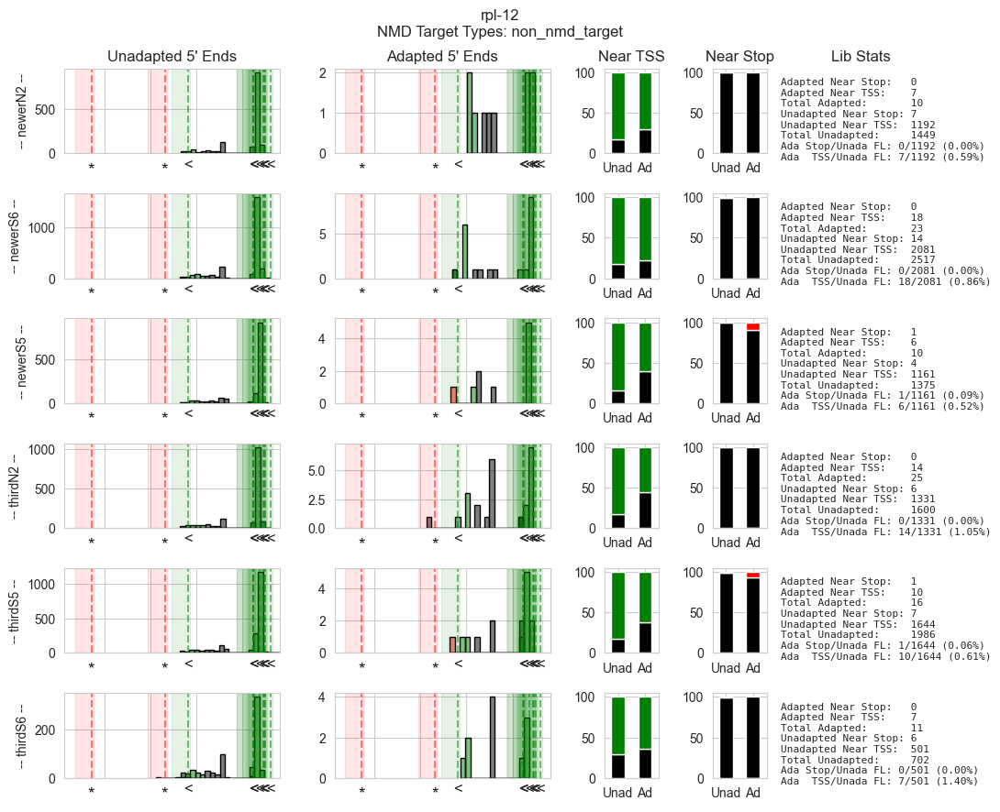

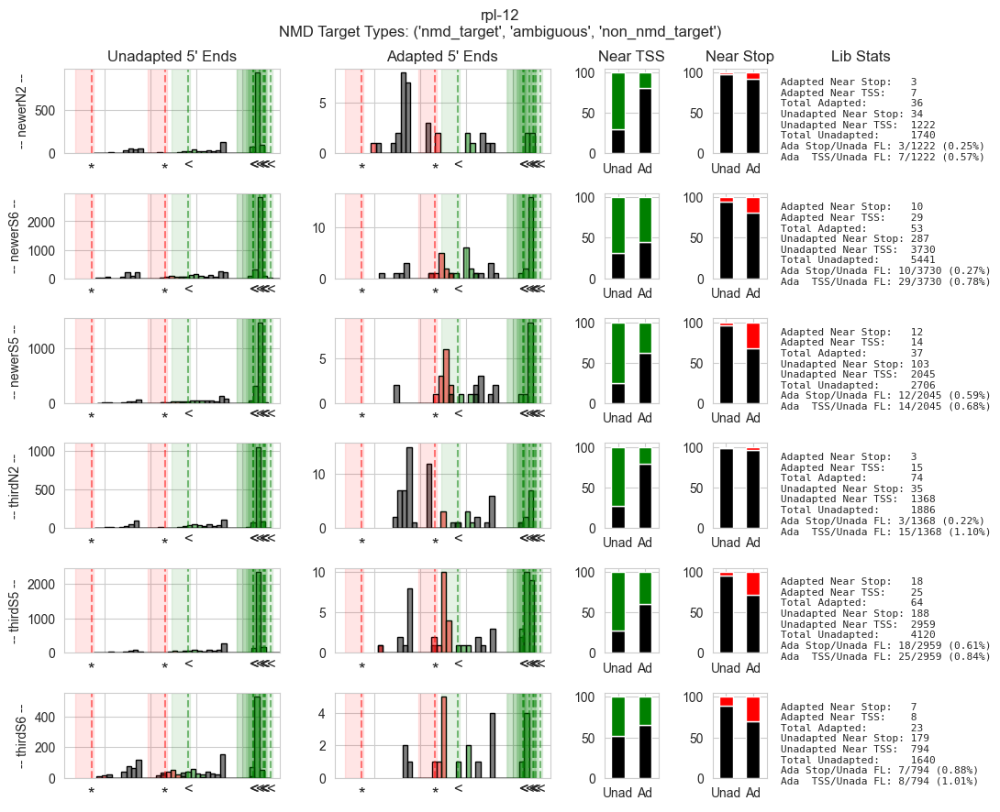

######################aly-3#######################
                                     read_id  bit_flag chr_id   chr_pos  mapq                                              cigar r_next p_next len                                           sequence  \
136956  b823a91d-84e8-4683-bab6-c1d202147c40         0     IV  12124157    60  24M1I9M2I12M1I22M1I12M2I20M1I17M1D6M1D29M2D9M1...      *      0   0  ATTGATTGGCTCGAGACTTGGTTATTTCAAGATTTCTCTCCGTTAC...   
136957  93998db9-93e5-4eb2-a9fb-e1ba037ee075         0     IV  12124170    60  1S11M1D9M1D14M1I18M1D74M2I12M1D8M1D15M2I7M1D30...      *      0   0  TAGACTTGGTTATCAAGATTTTCCGTTACCCAAATCCCTGATTTCA...   
136958  45507db7-2c4f-4dc2-8bc3-182daaa544a8         0     IV  12124246    60  11S24M1D18M1I21M2D9M1D12M2D14M1D23M50N72M2D2M1...      *      0   0  GTTCGAGACTTGATCATGAAATTCGCCGTCATTGATCGAGCAACAT...   
136959  70ce67c1-6b0c-423d-a062-a292e83208b3         0     IV  12124312    60  6M1I4M4D25M1D4M2D16M50N12M3D27M1D7M1D23M2D30M1...      *      0   

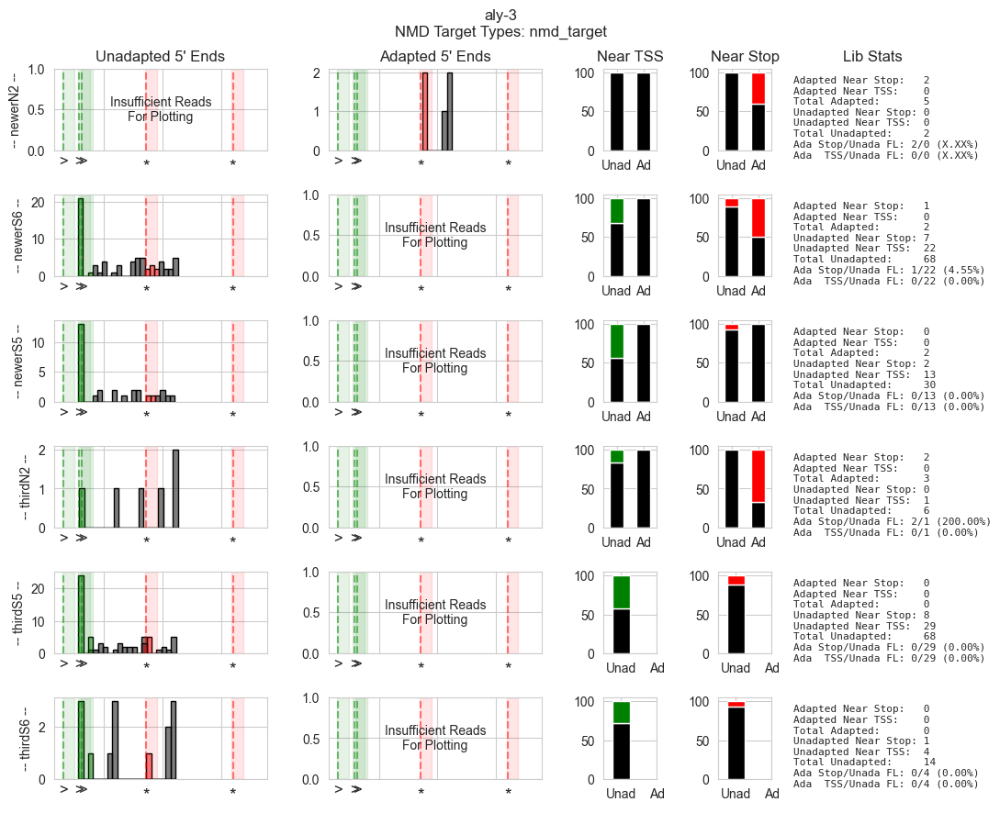

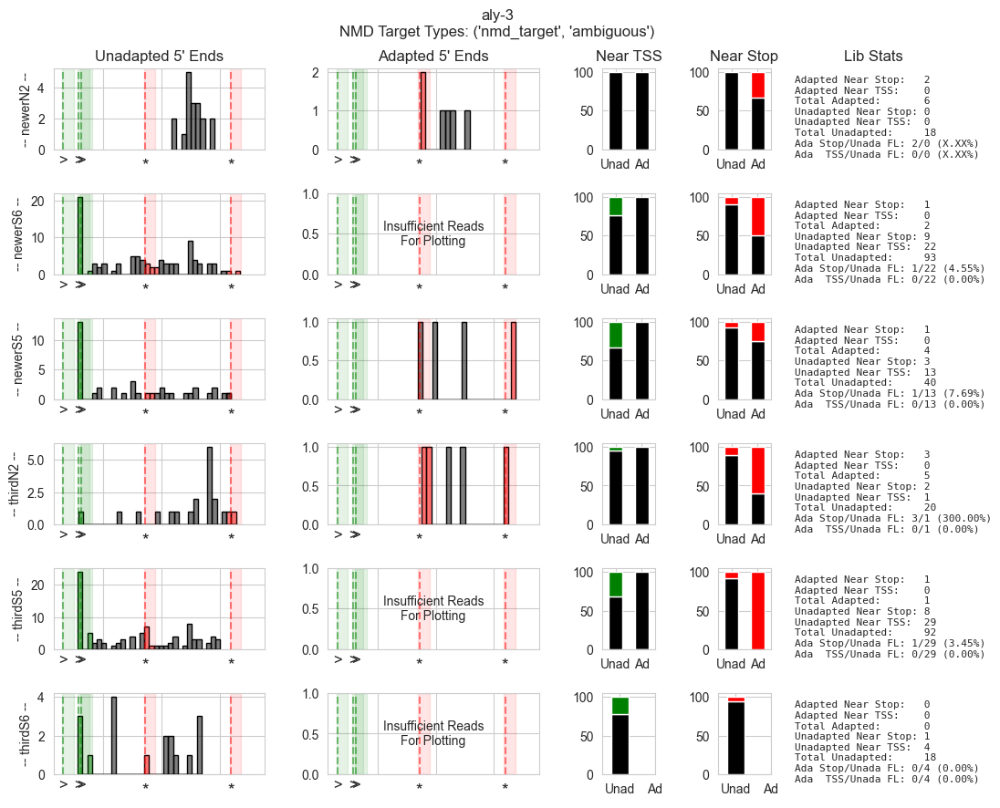

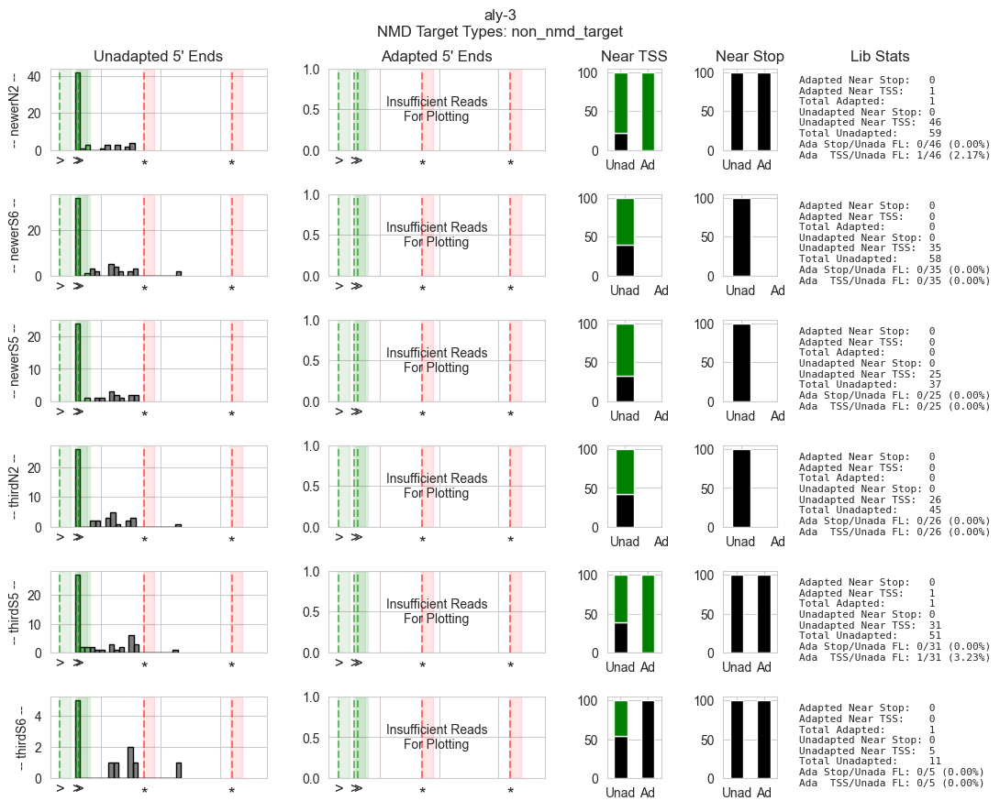

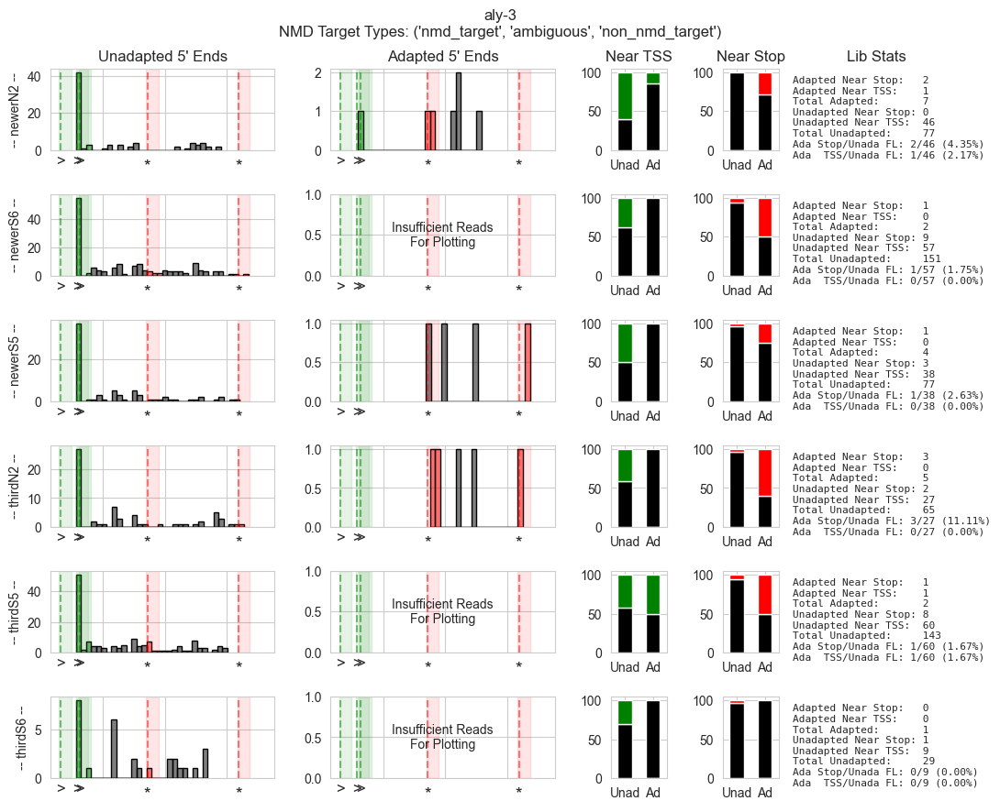

#####################C53H9.2######################


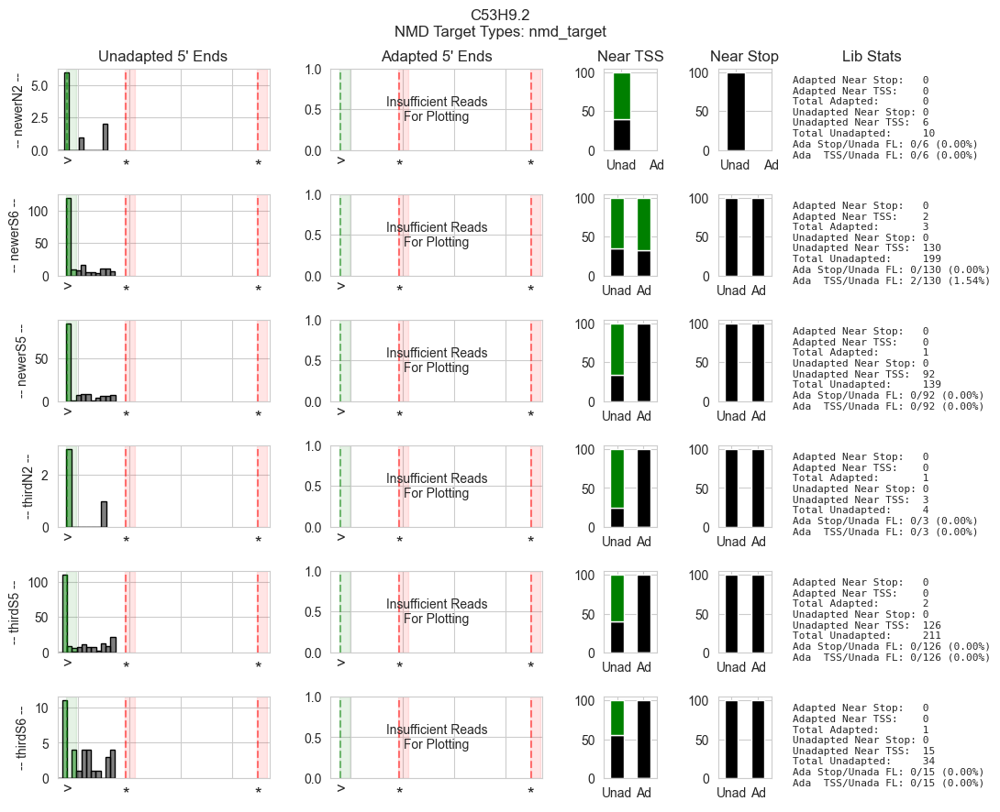

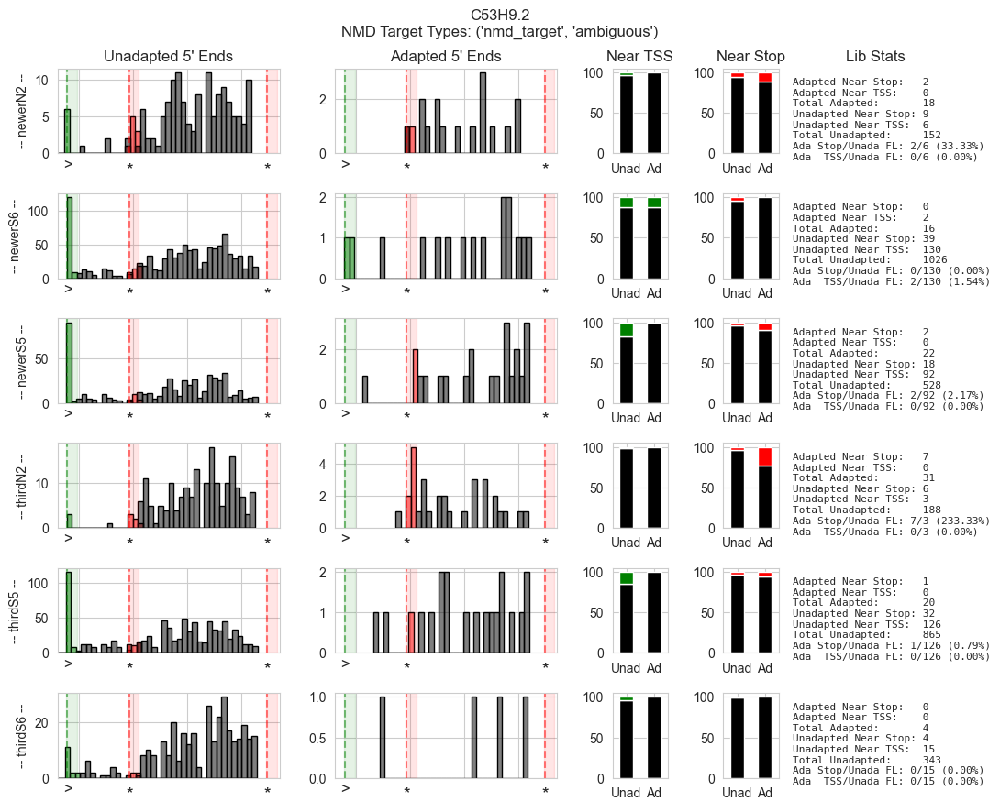

                                    read_id  bit_flag chr_id  chr_pos  mapq                                              cigar r_next p_next len                                           sequence  \
39093  fc07973e-d09e-4ee2-b385-d2228d36f9e5         0      I  1832890    60  3S12M1D18M1D49M1I52M2D76M1D10M3D27M2D1M1I6M1D6...      *      0   0  CGAGTTTGAGATGACAAACGCCGTGCGAGCAATAAAAGCCACAGGG...   
39094  2cb8432d-6a63-420b-bc9f-b6fcb9caa144         0      I  1832890    60  3S25M1I16M1D3M1D4M2D4M3D8M3I2M1D18M1D8M1D21M6D...      *      0   0  CAAGTTTTAGATGACAAAACGCCGTGCGAAGCAATAAAAAGCCATG...   
39095  237a5c69-f4e2-4993-8ddf-985f8e4317cf         0      I  1832890    60  4S5M1I7M1D18M2D8M1D127M5D20M1D13M5D10M2D21M2D3...      *      0   0  CCAAGTTTTGAGATGACAAACGCCGTGCGAGCAATAAAGCCTTAGG...   
39096  ce45471d-9801-41c0-ac02-f9fcc6774898         0      I  1832890    60  4S12M1D18M1D7M1D37M2I37M1D8M1I2M3D33M1D13M1D25...      *      0   0  CCAAGTTTGAGATGACAAACGCCGTGCGAGCAATAAAAGCCTCGGG...   
39097

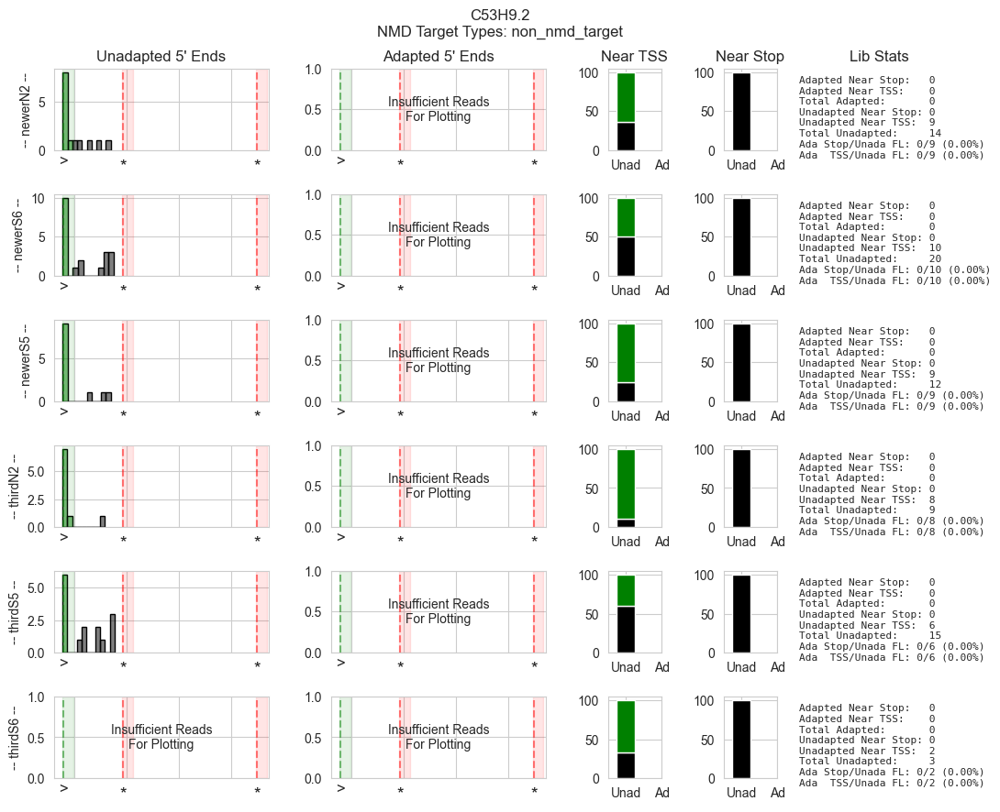

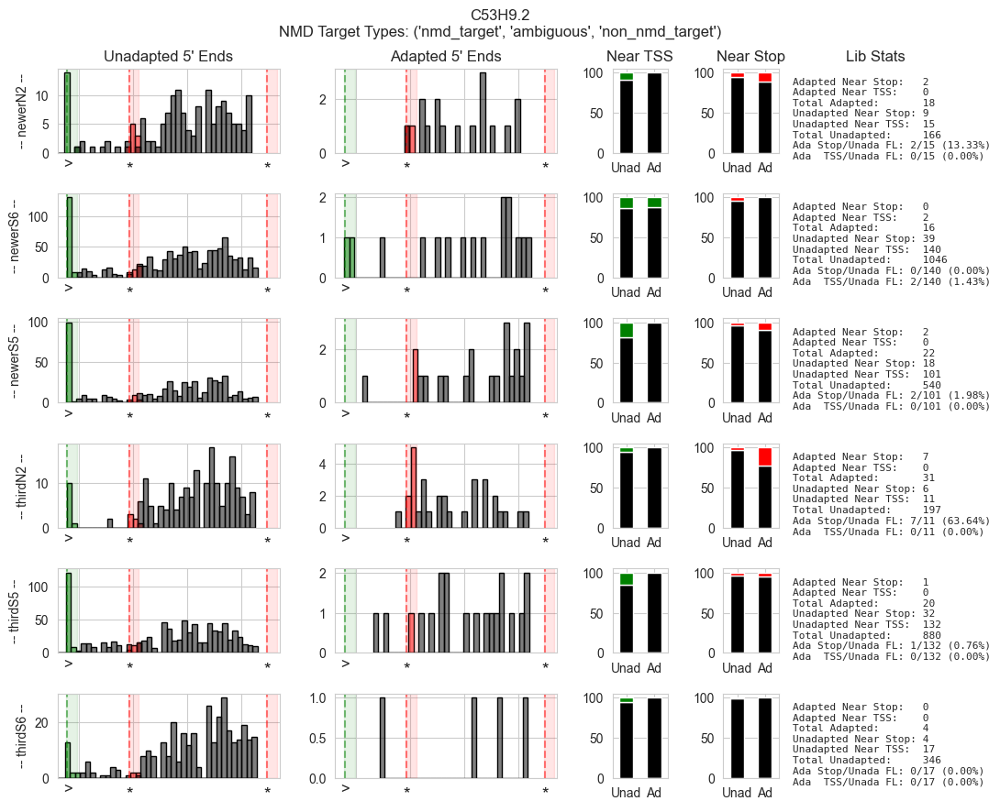

######################rps-22######################


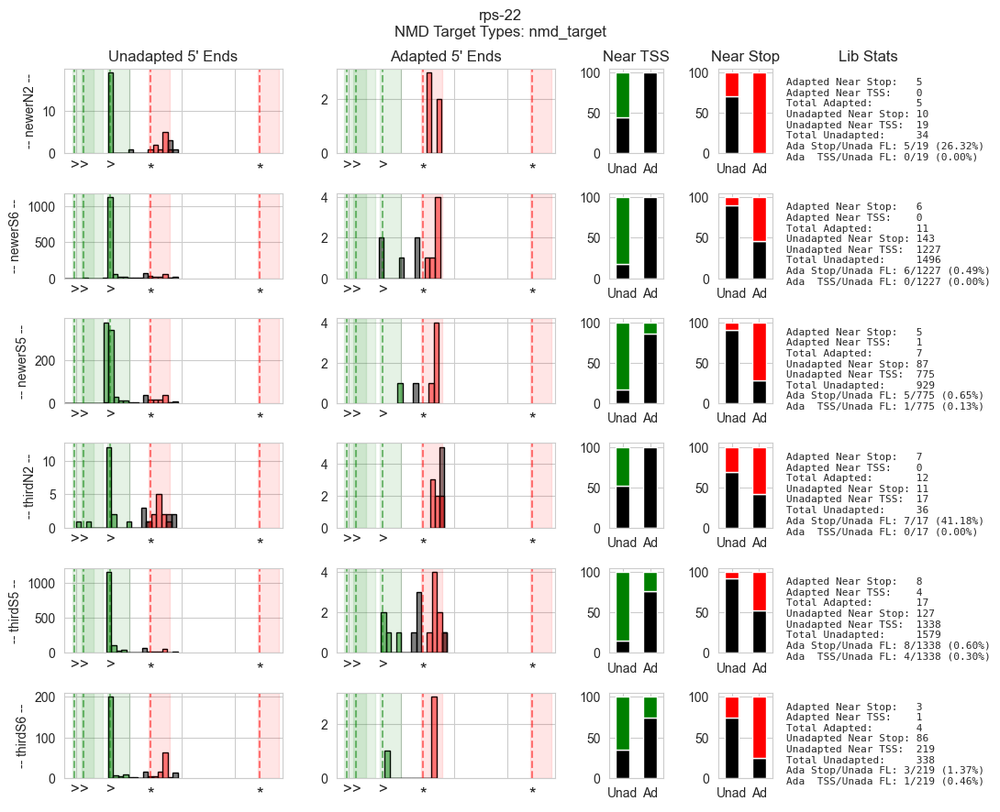

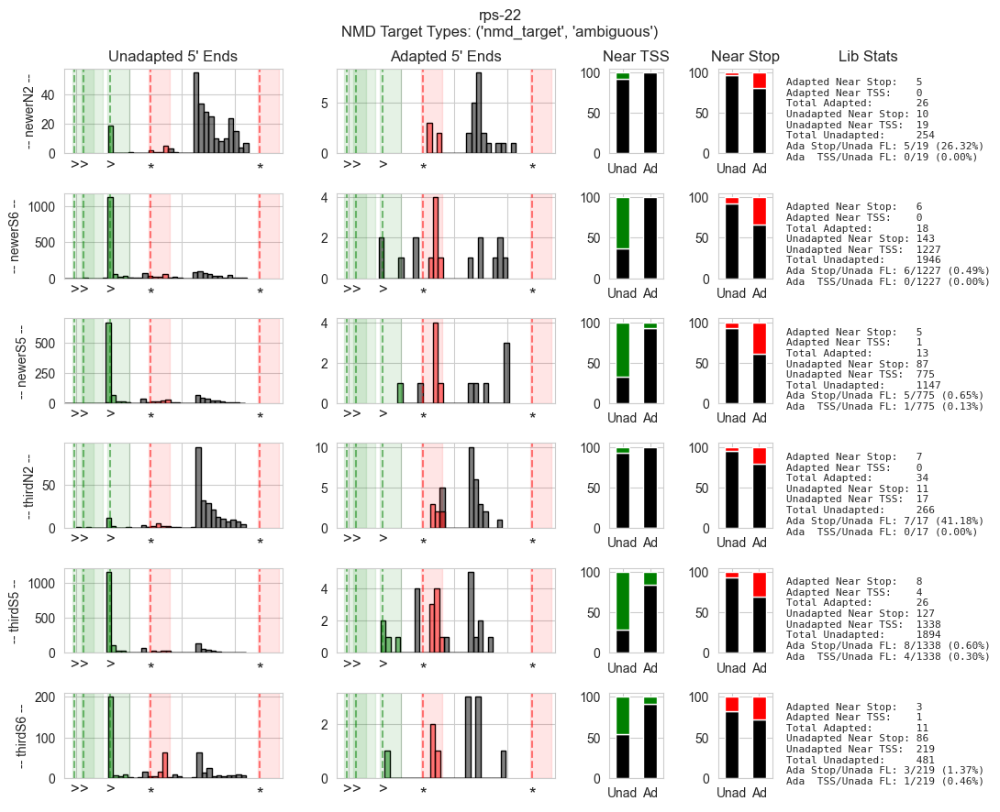

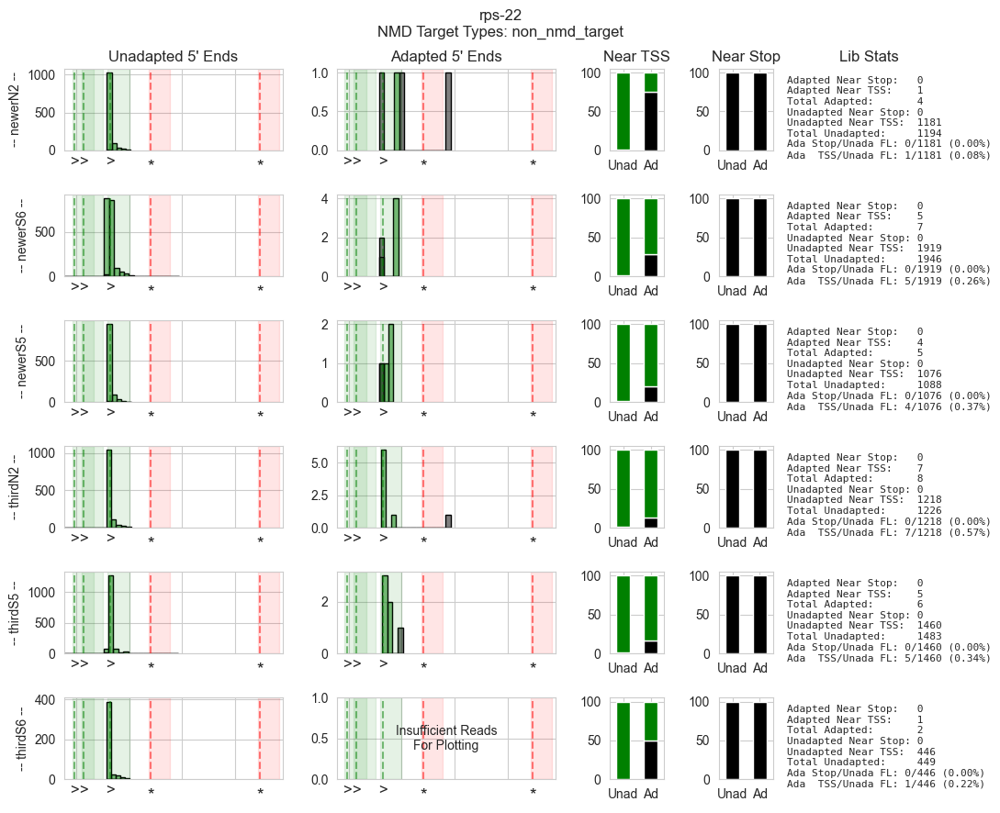

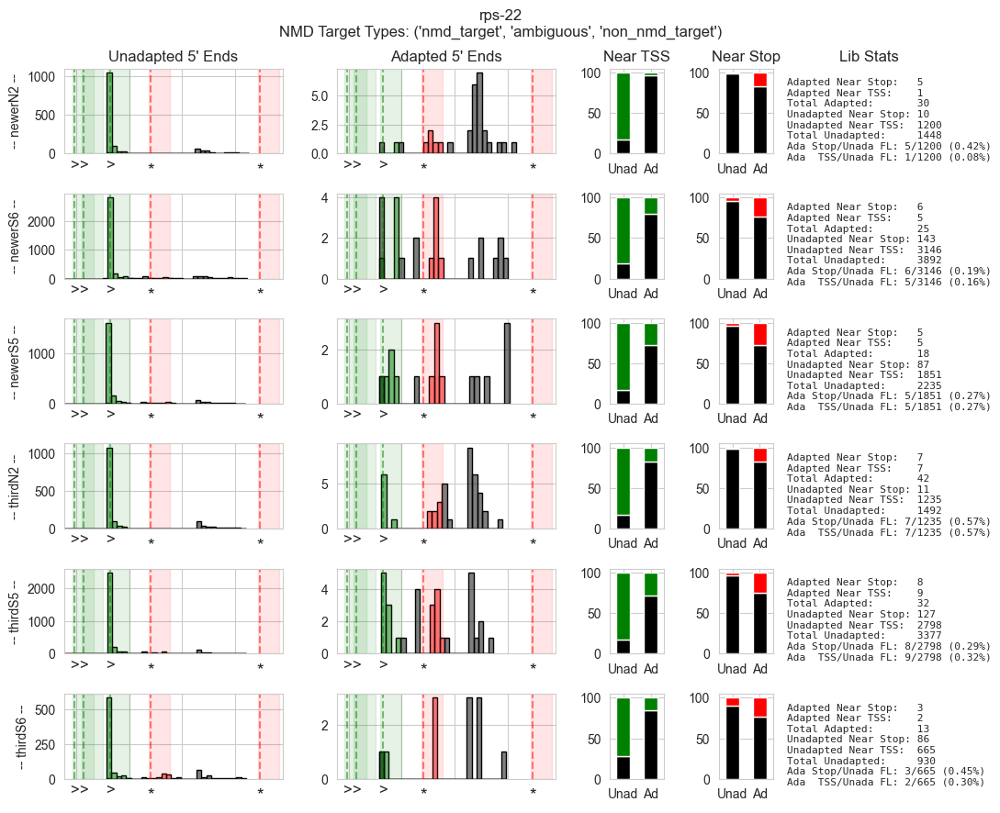

######################pqn-70######################
Error: `bins` must be positive, when an integer


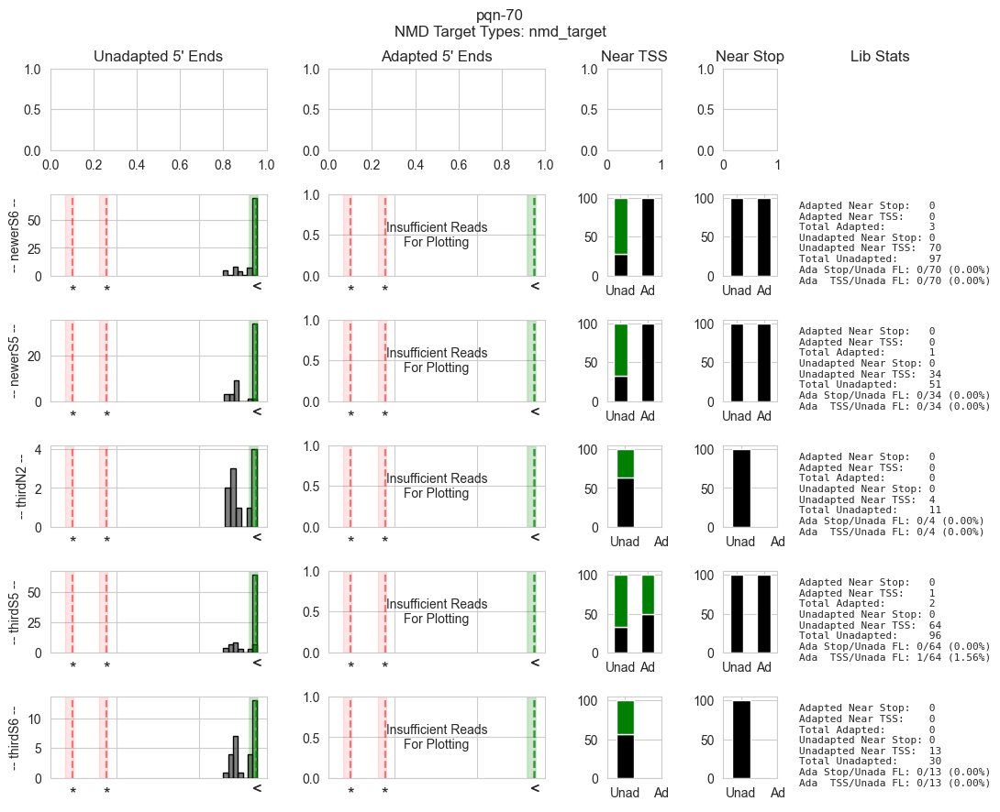

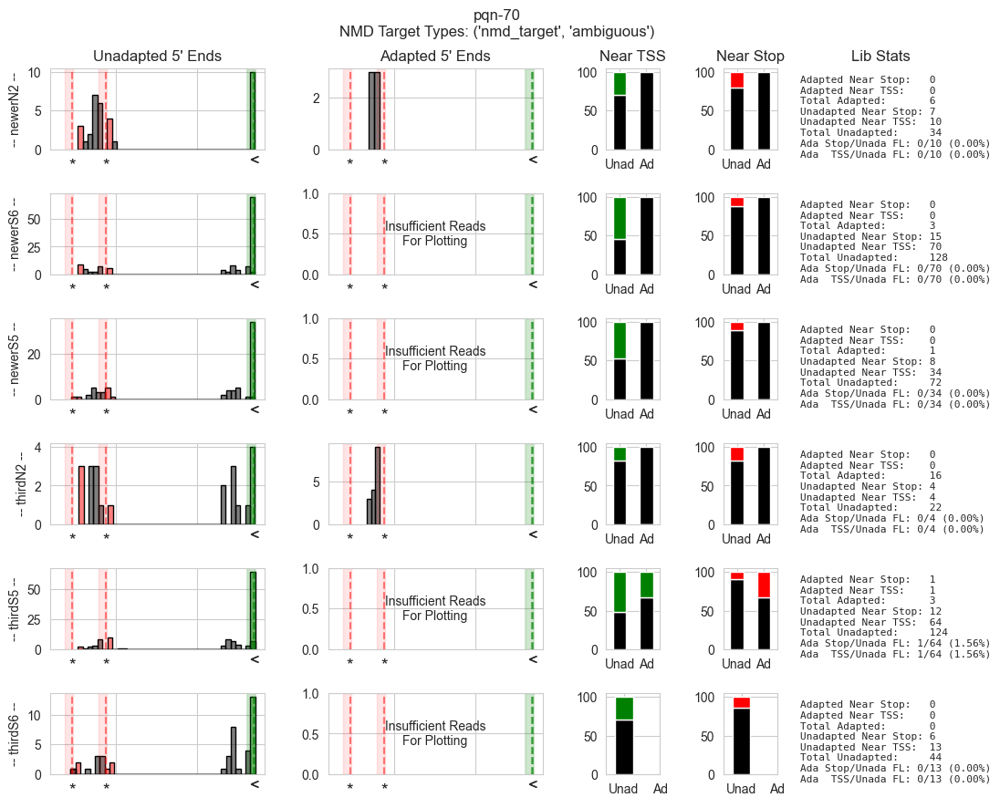

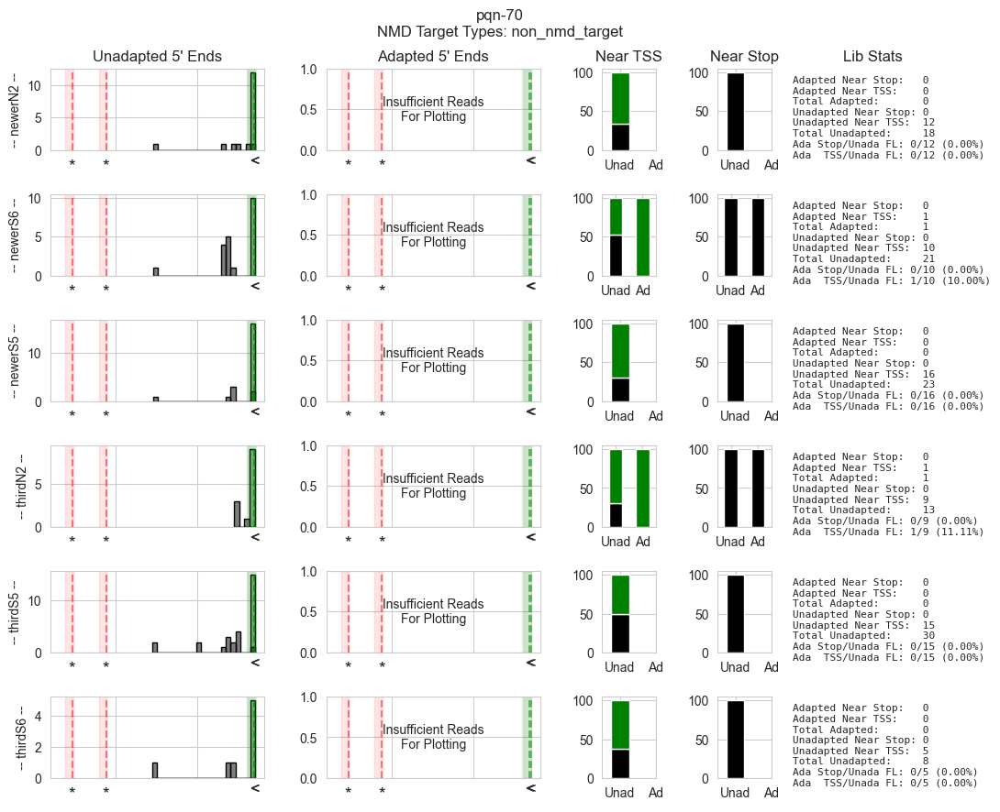

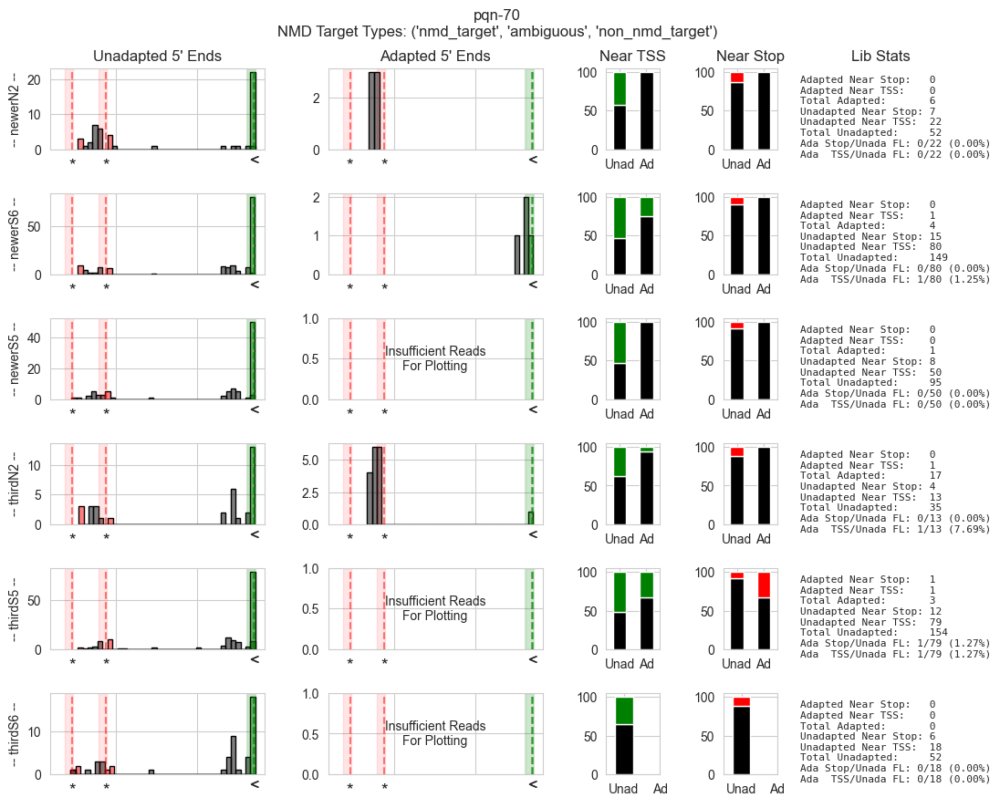

#####################K08D12.3#####################


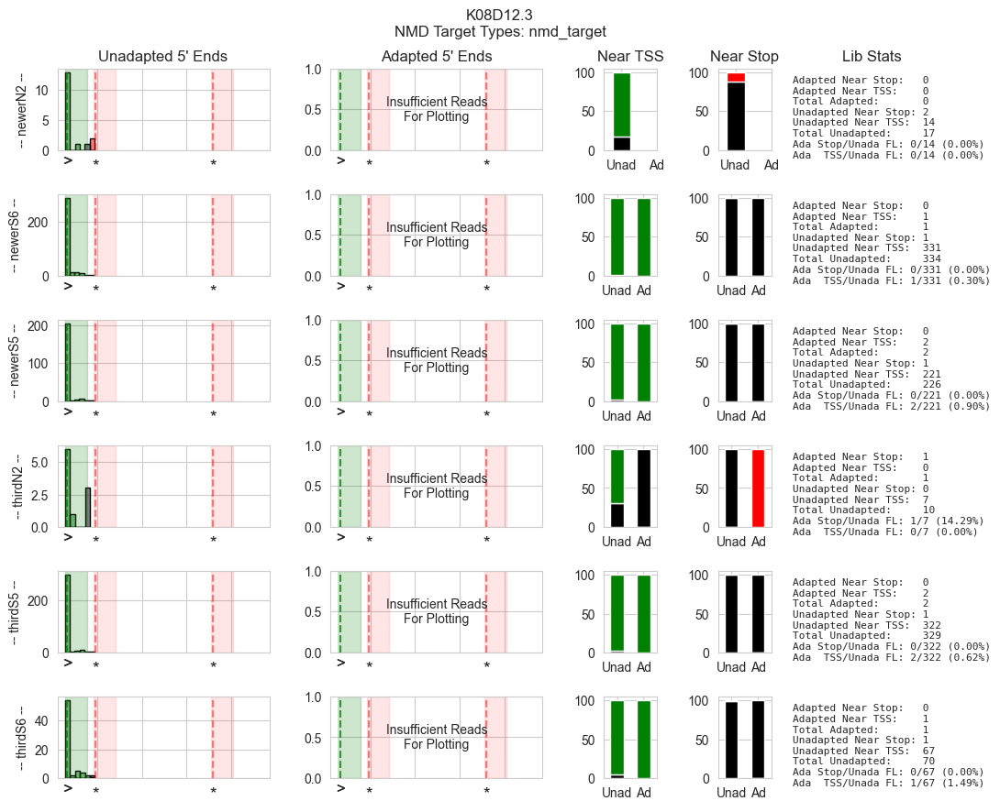

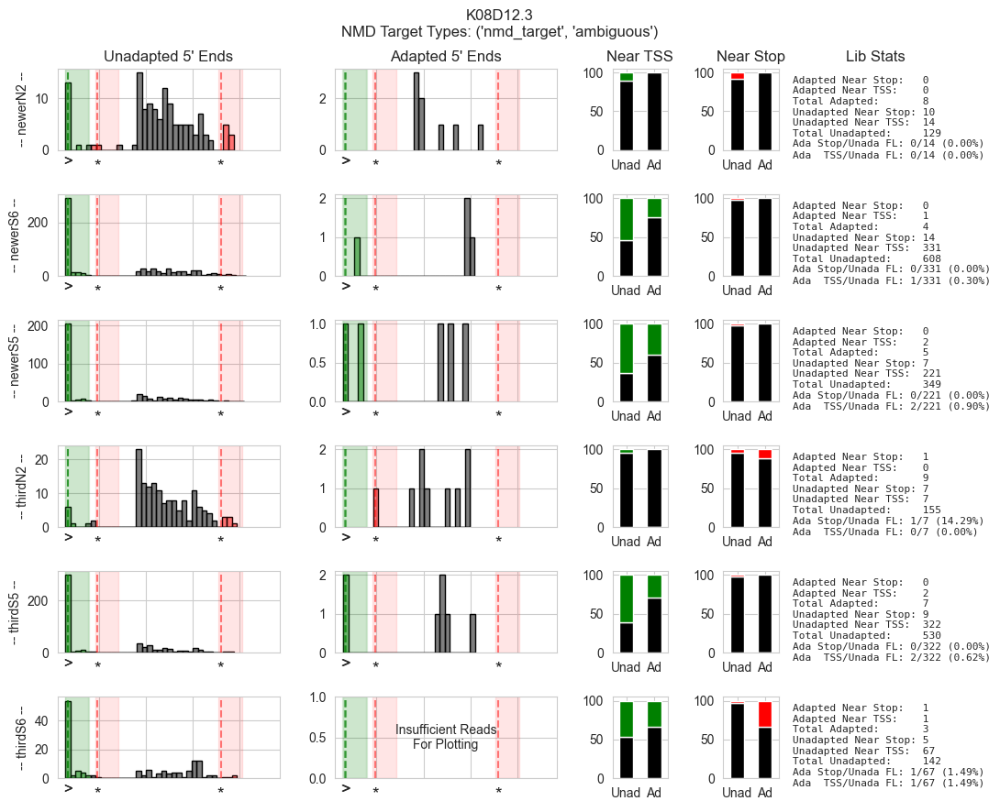

Error: `bins` must be positive, when an integer
Error: `bins` must be positive, when an integer


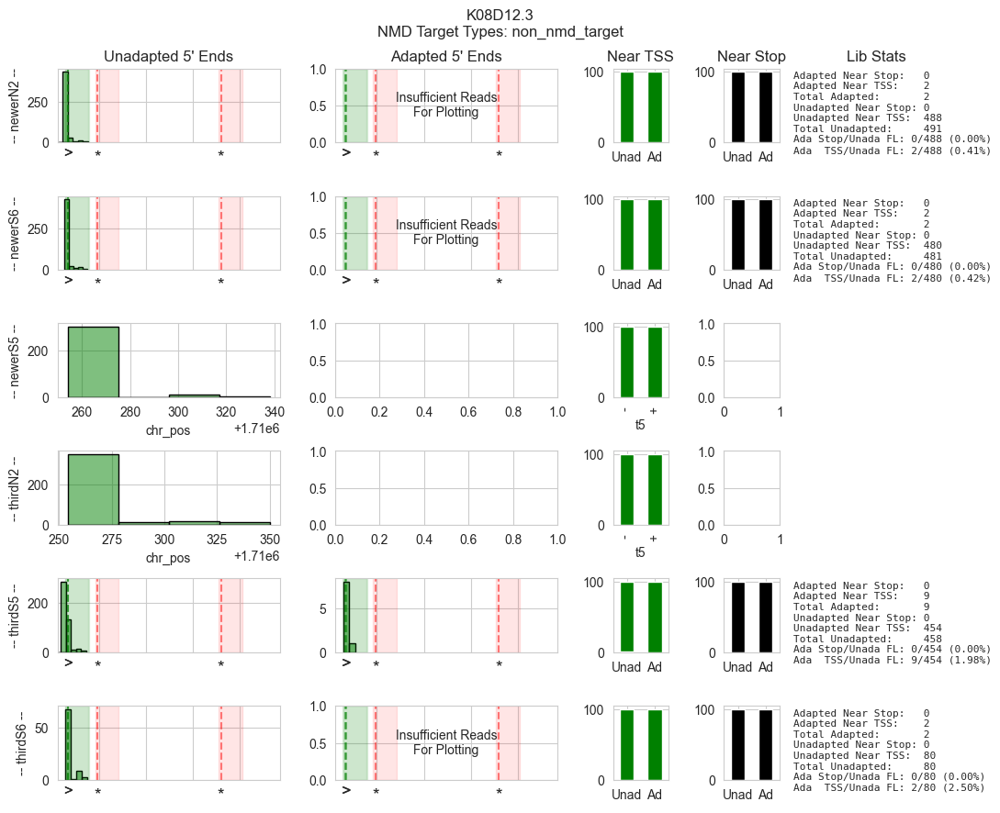

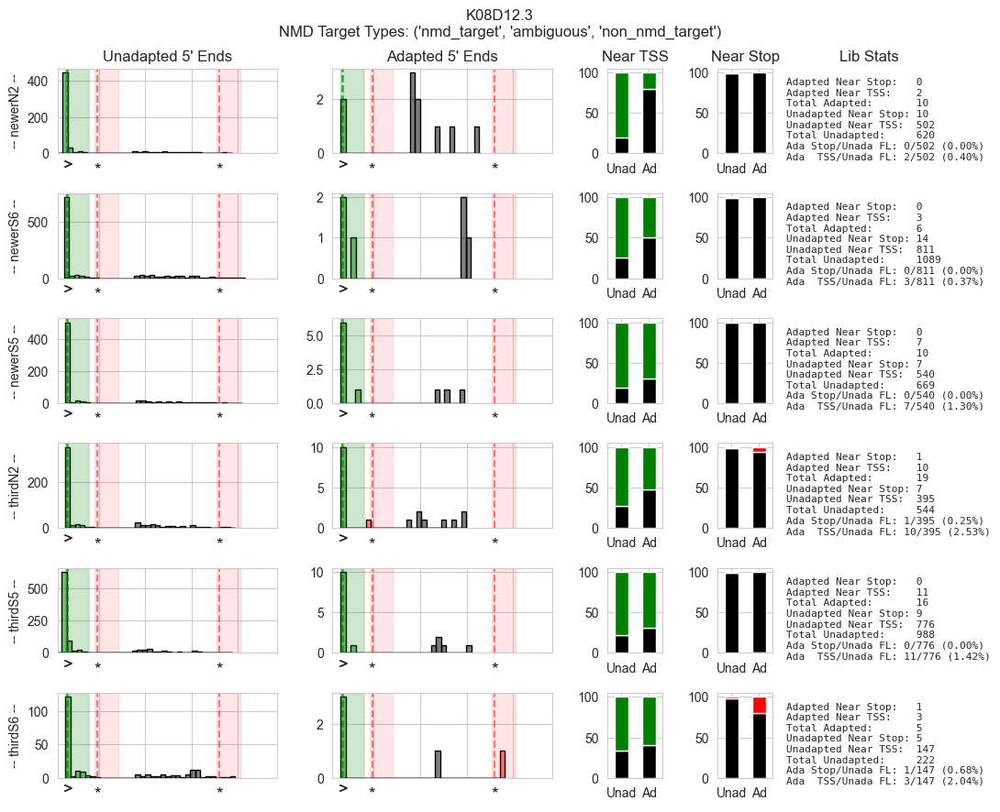

######################ubl-1#######################


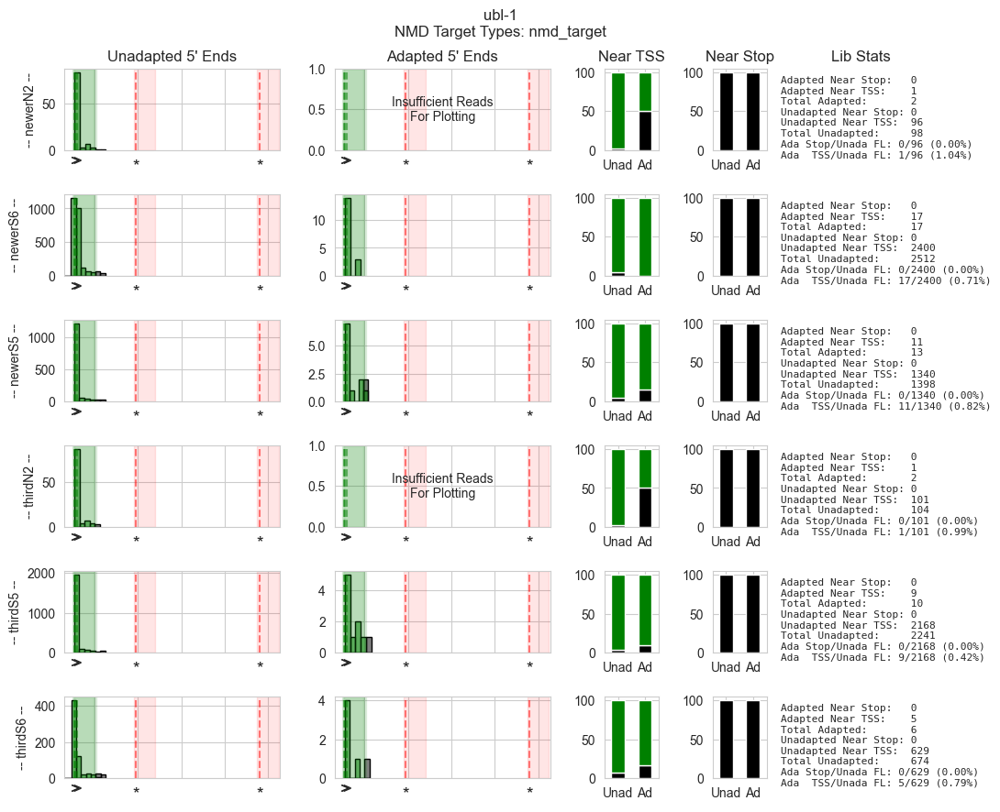

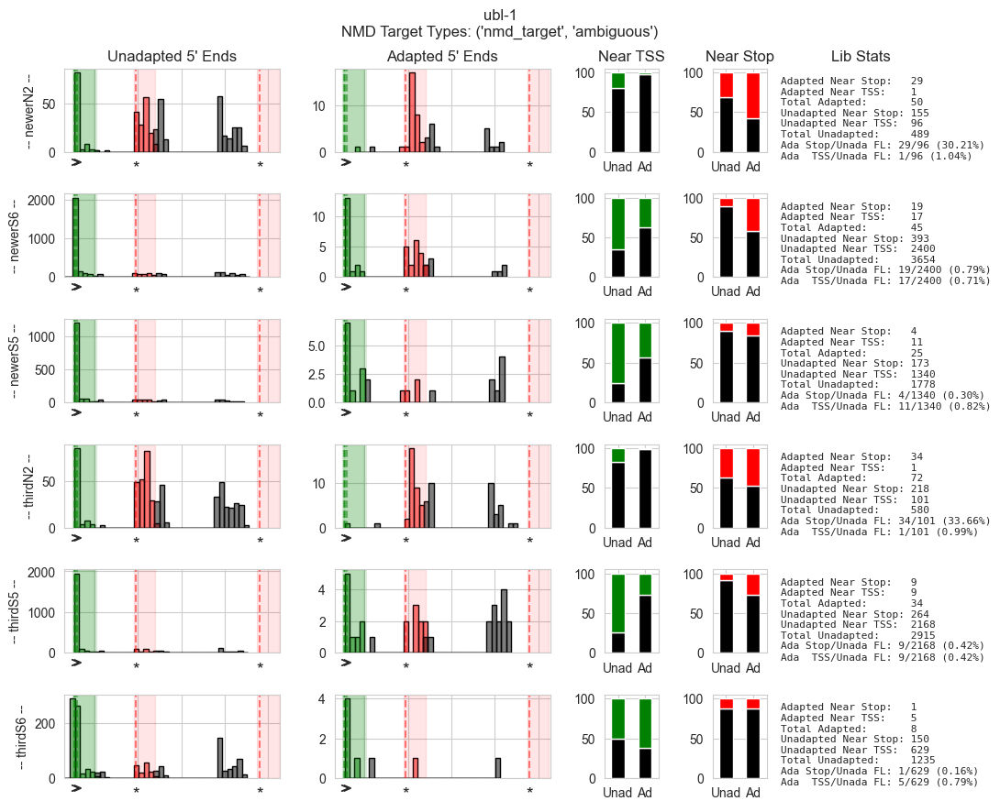

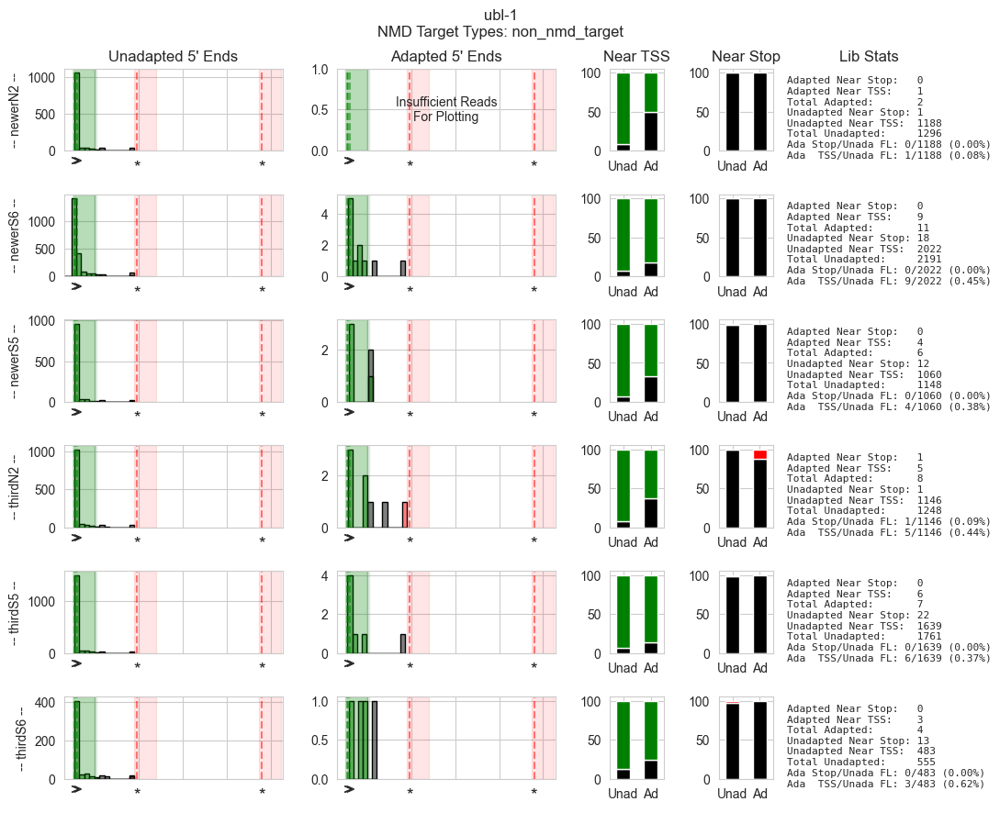

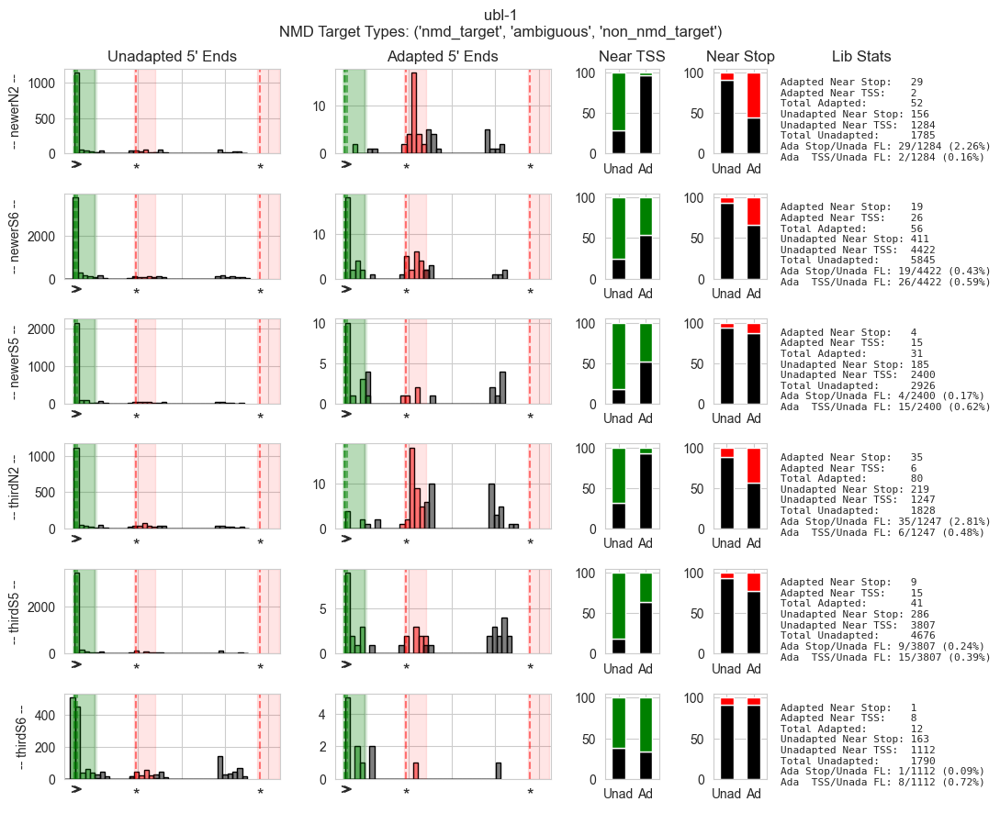

######################rpl-30######################


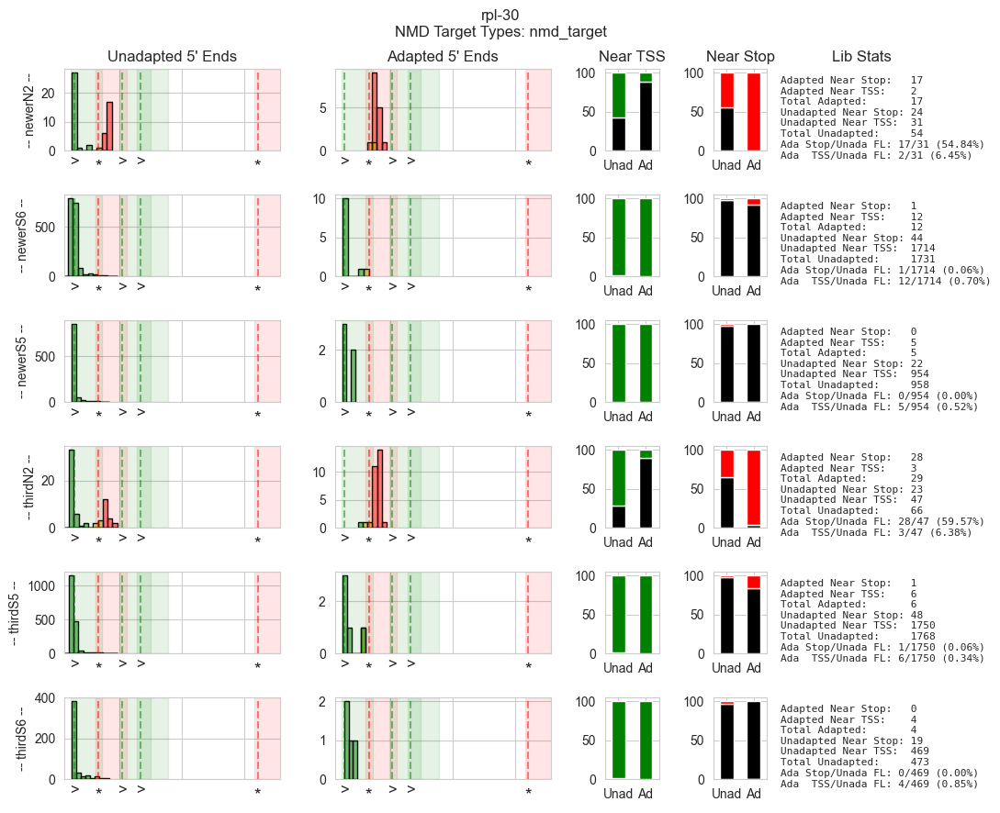

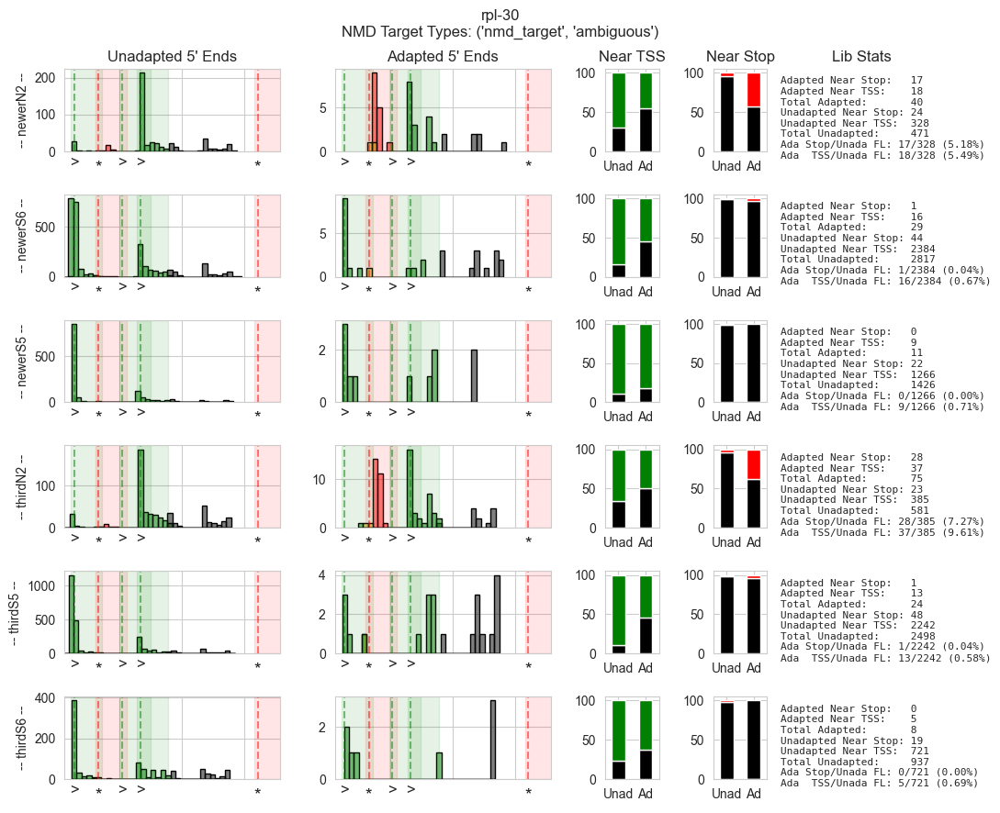

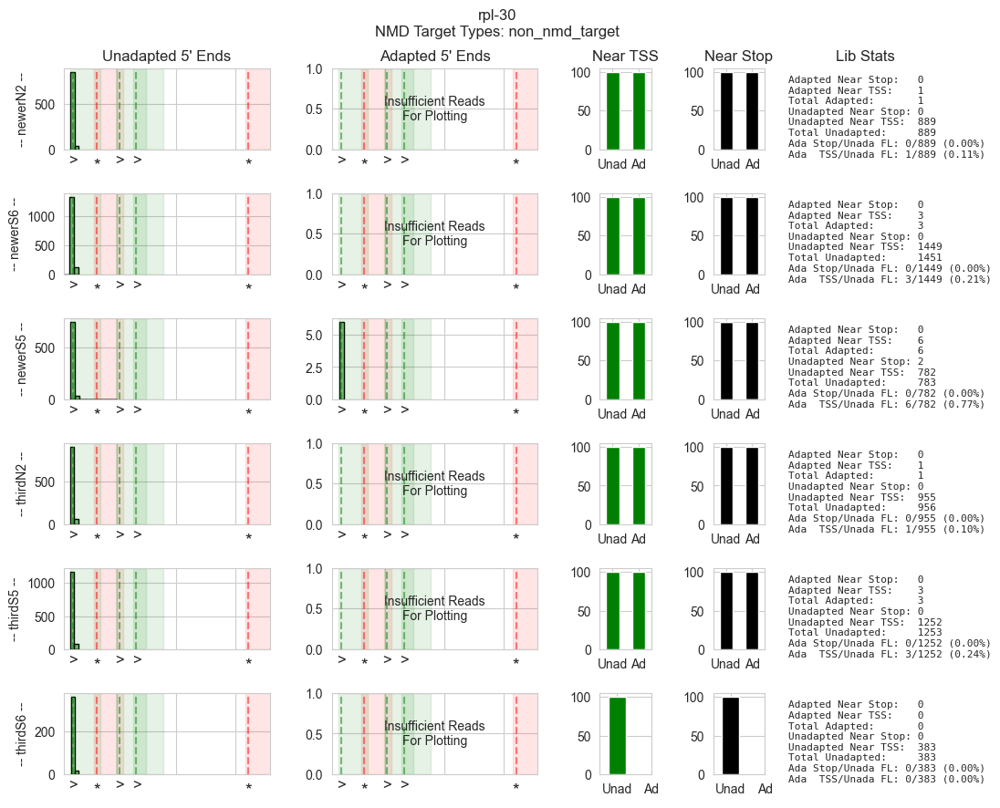

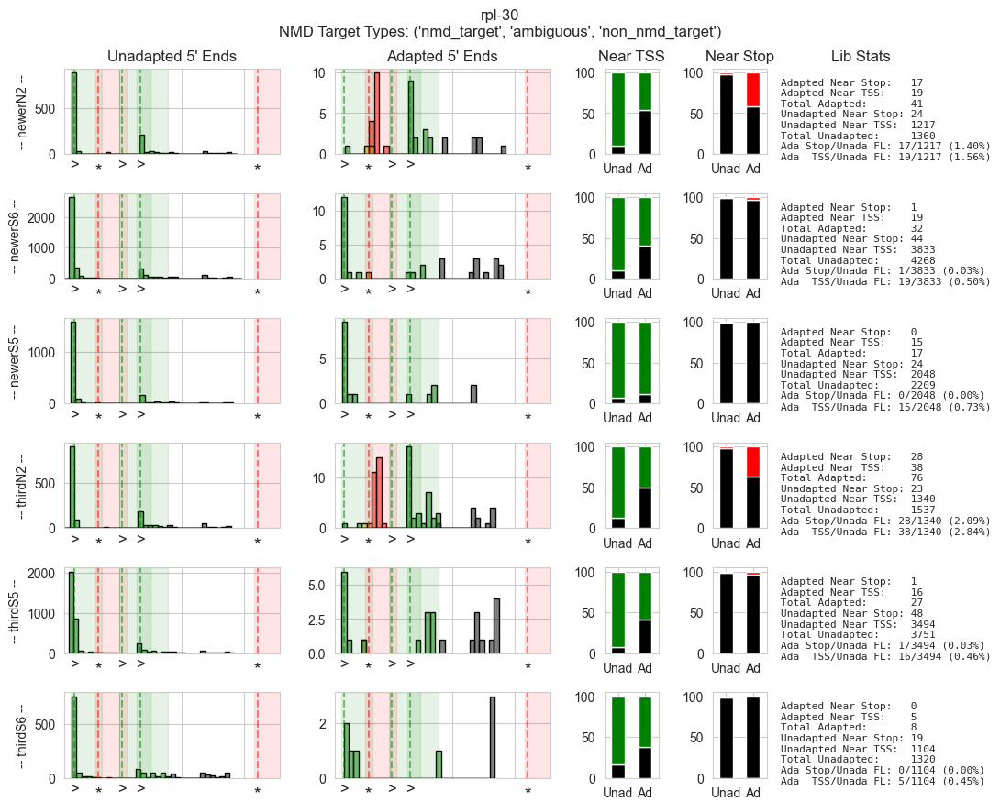

######################rpl-26######################


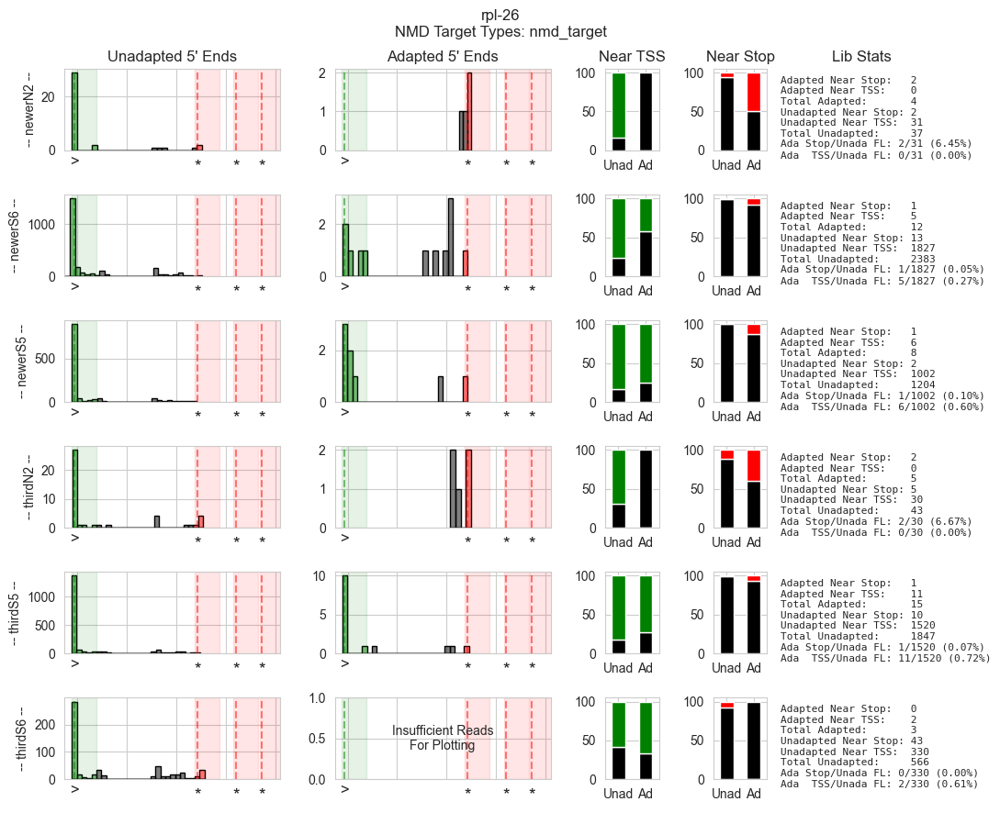

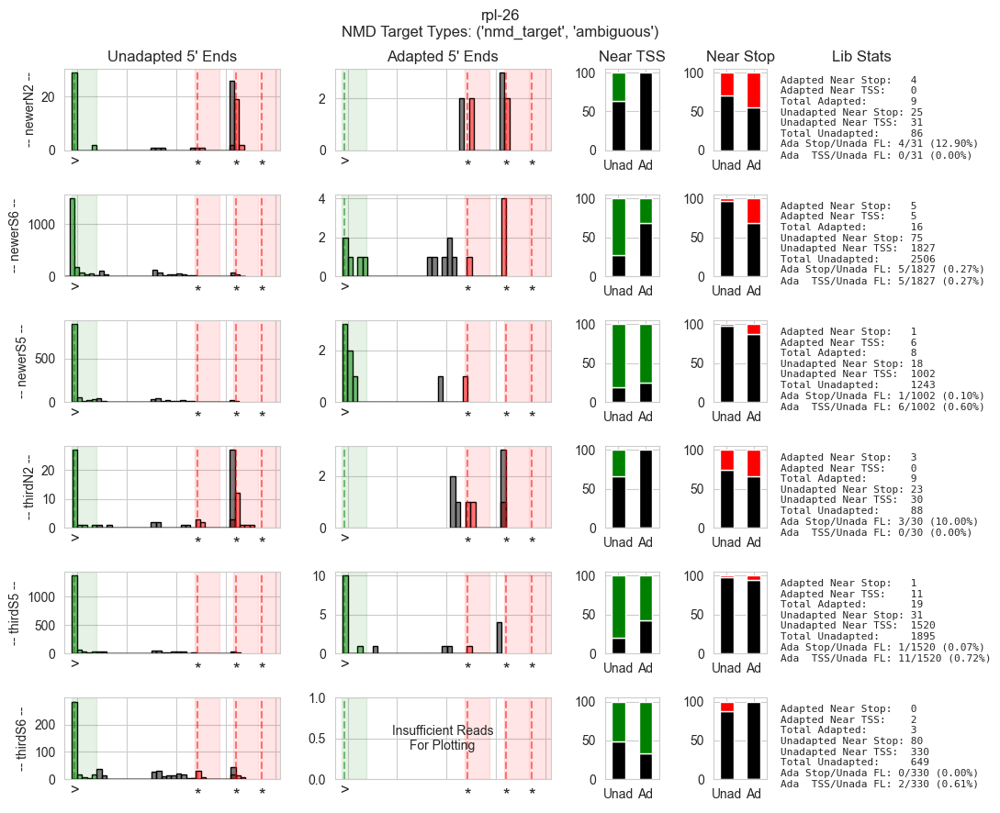

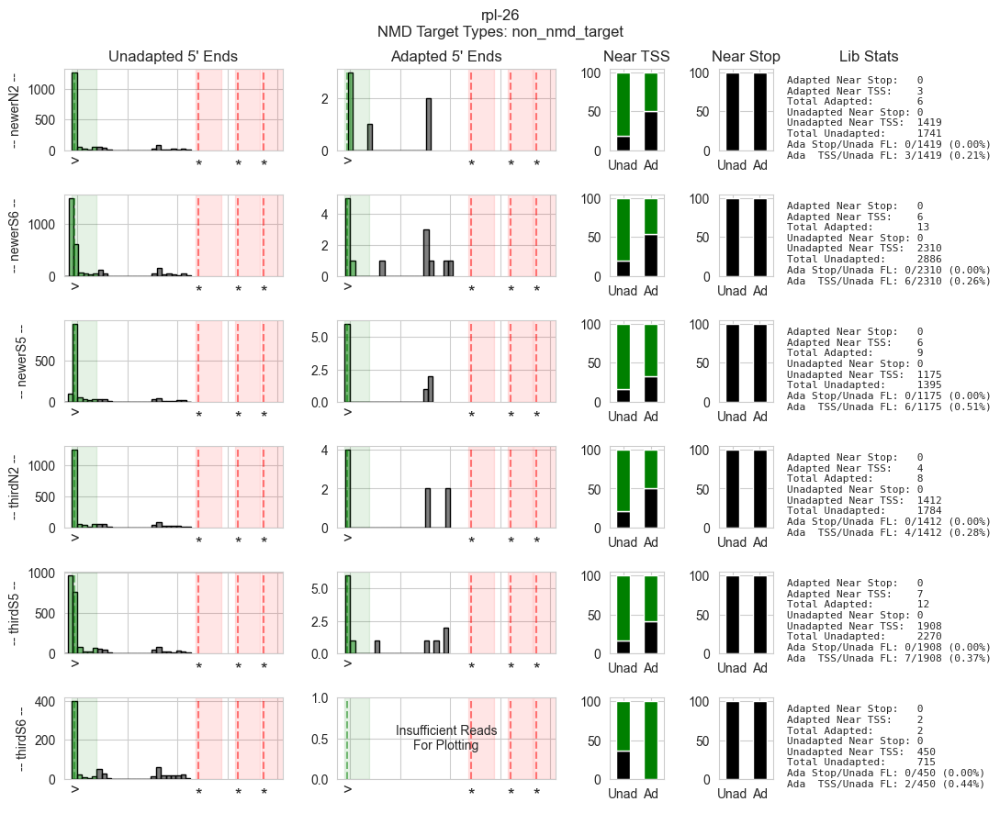

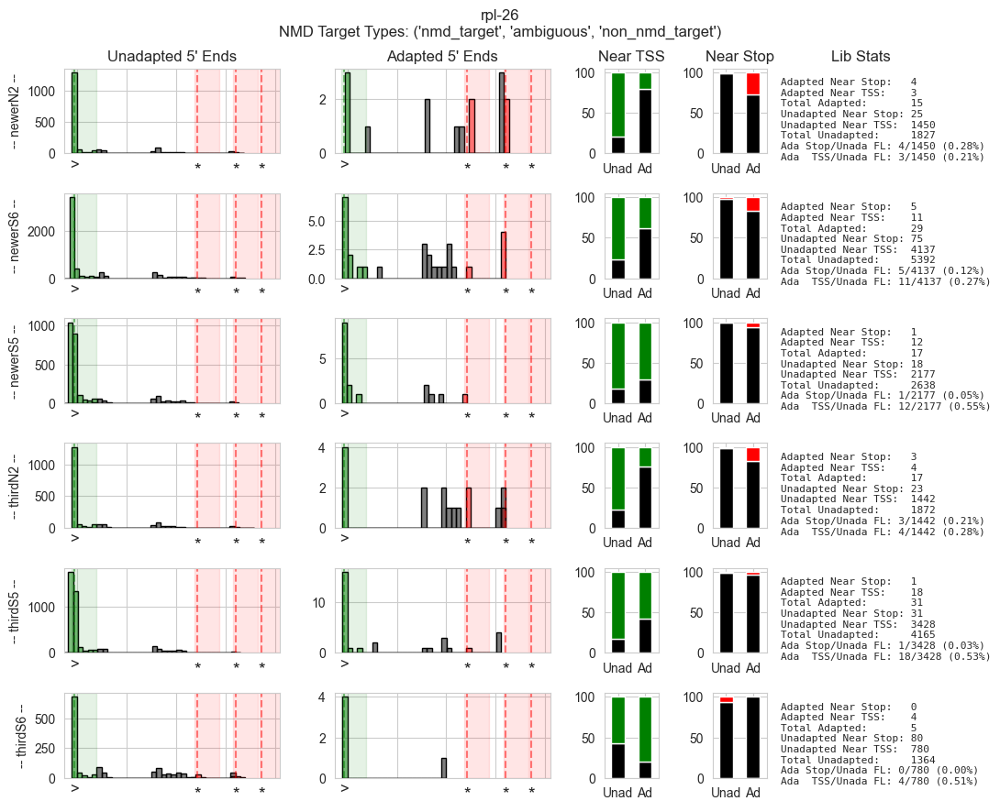

######################rpl-3#######################


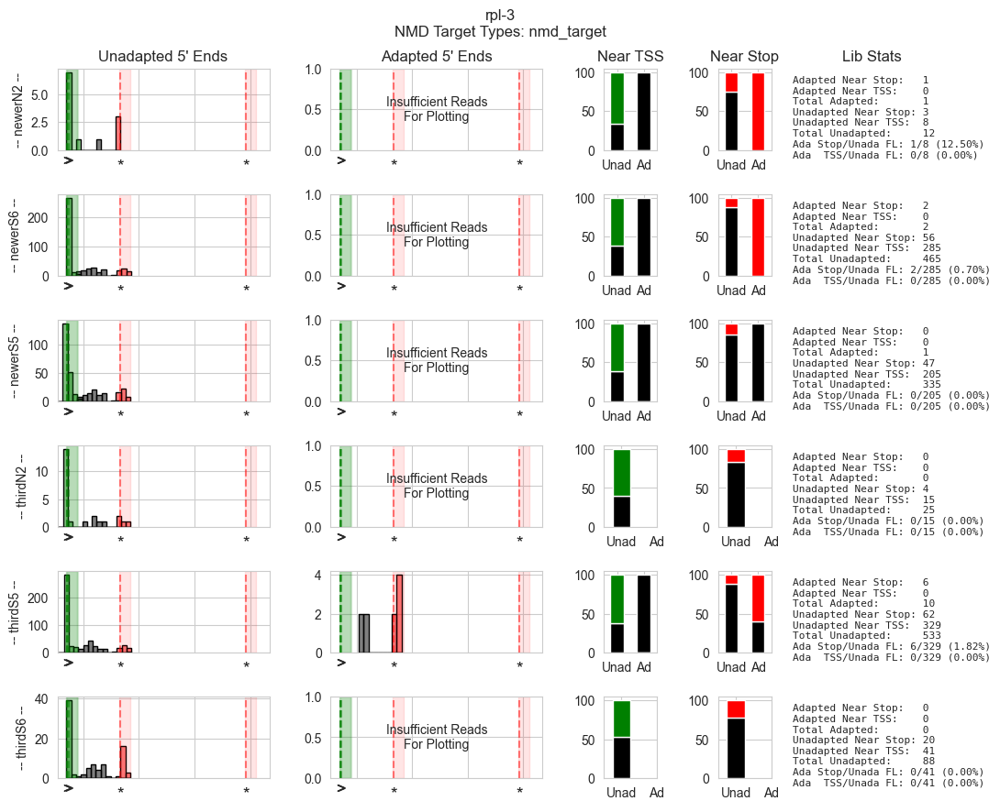

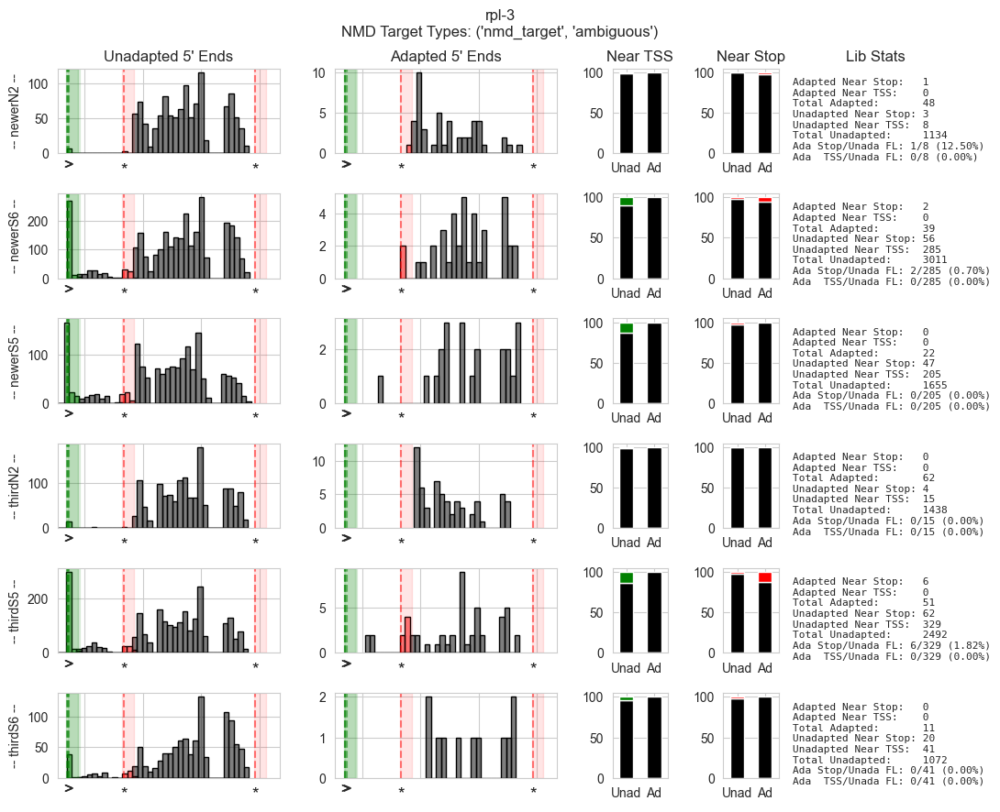

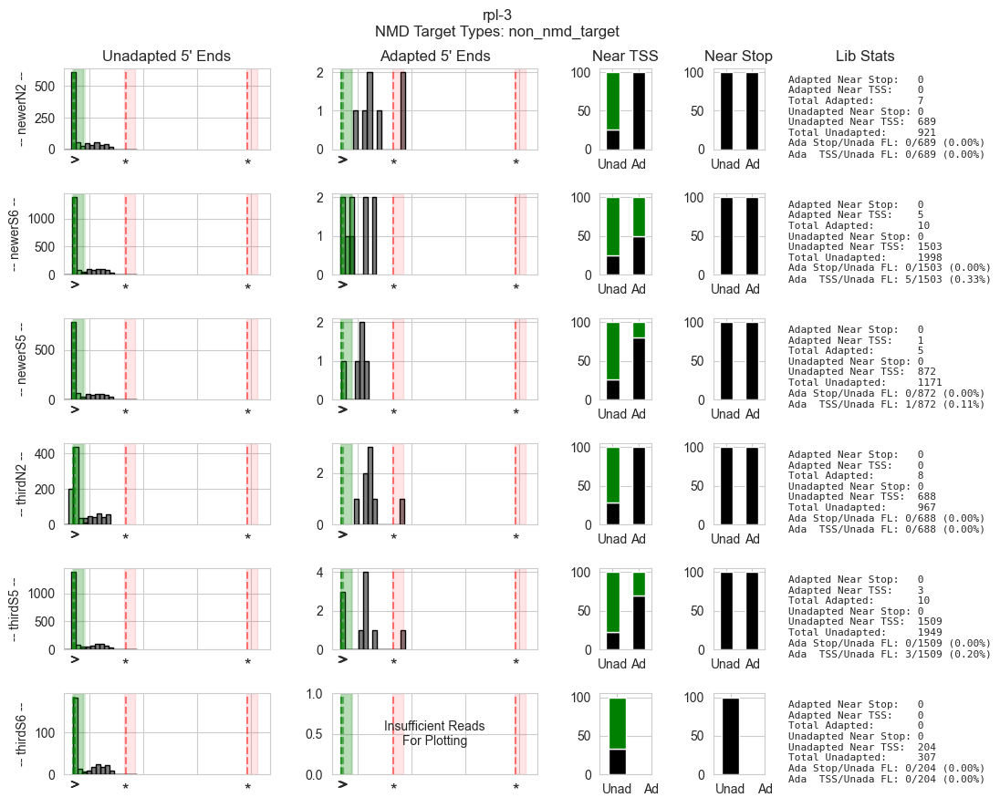

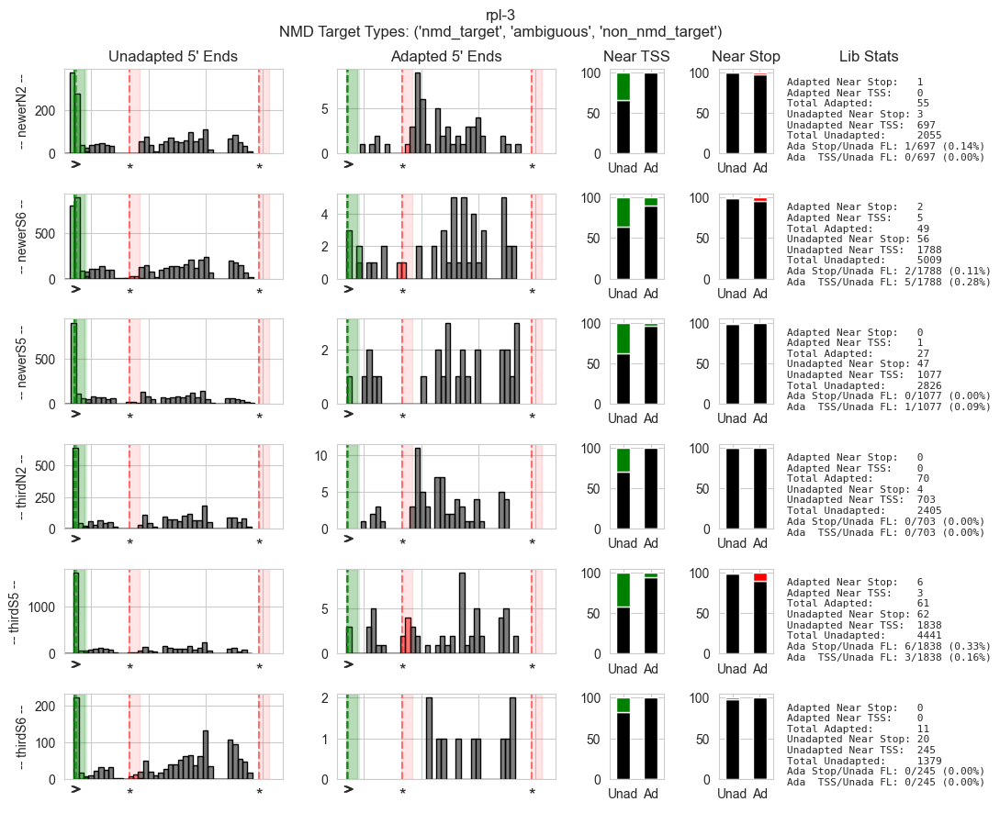

######################rsp-6#######################


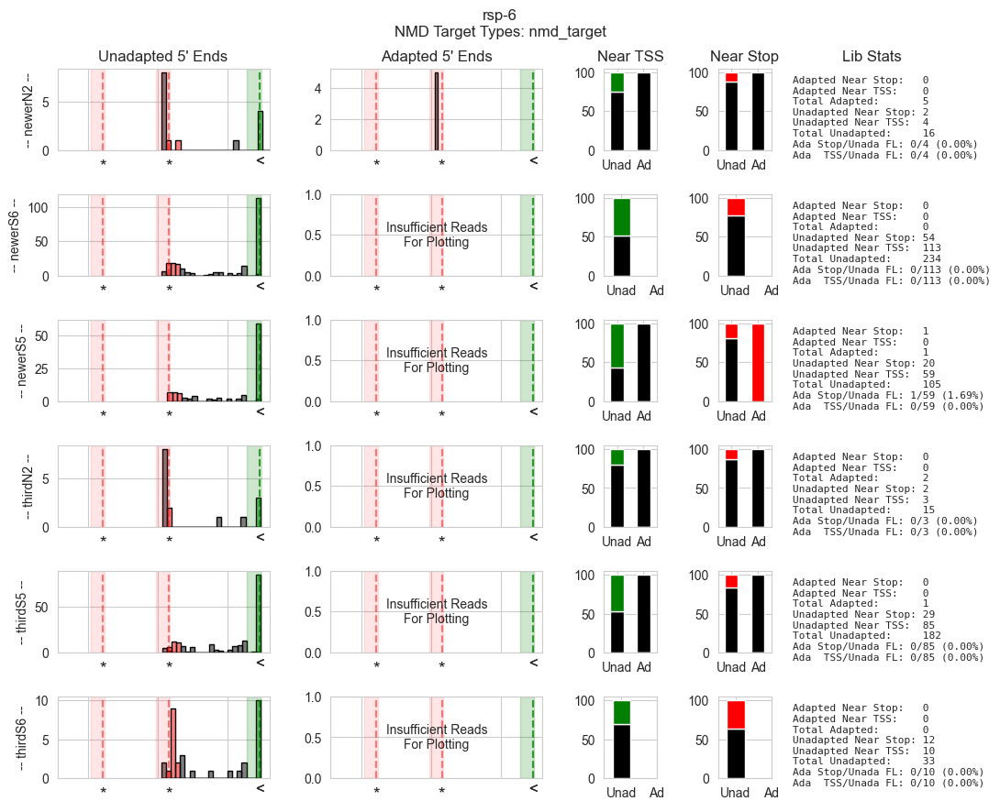

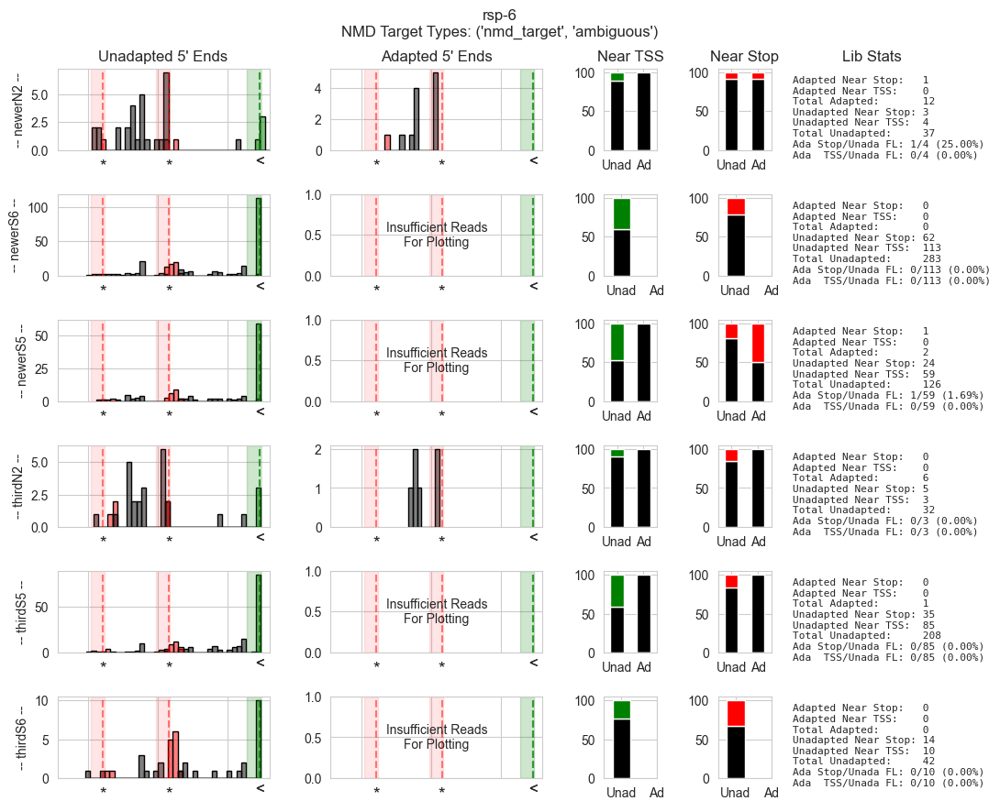

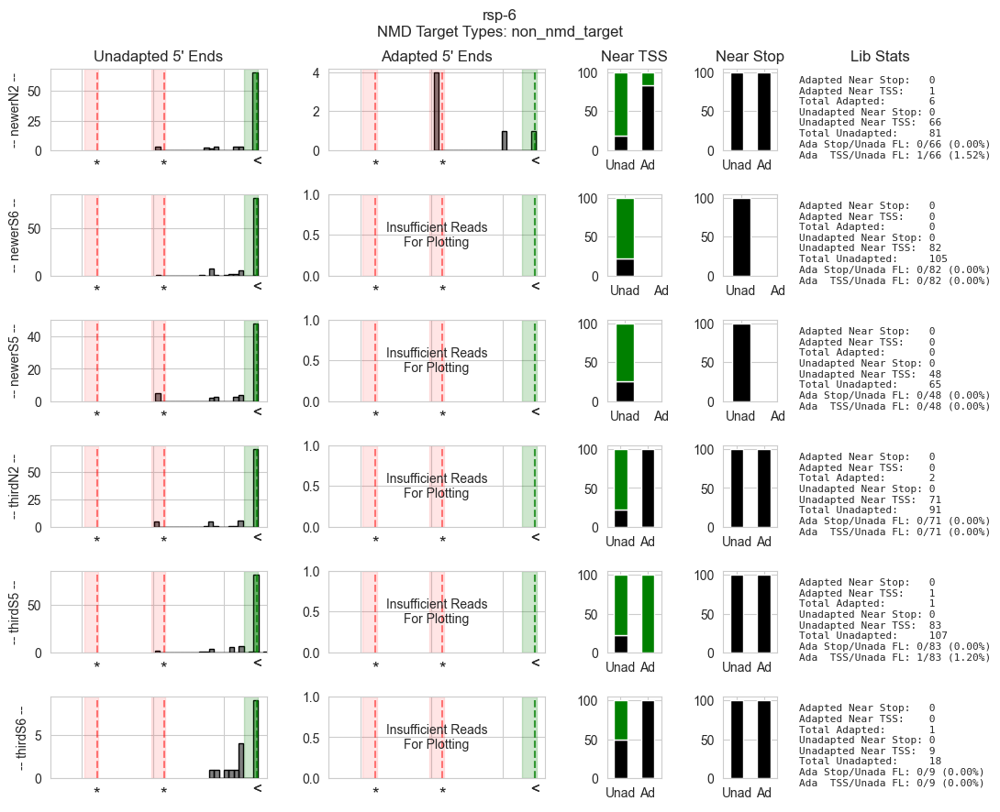

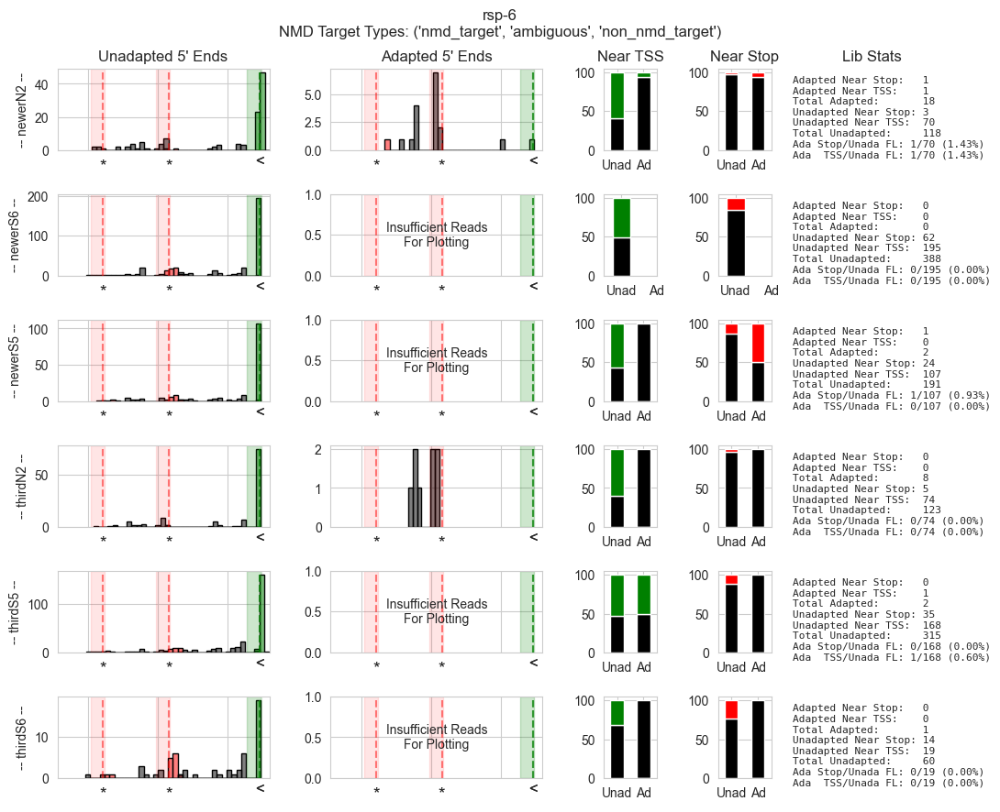

######################rpl-1#######################


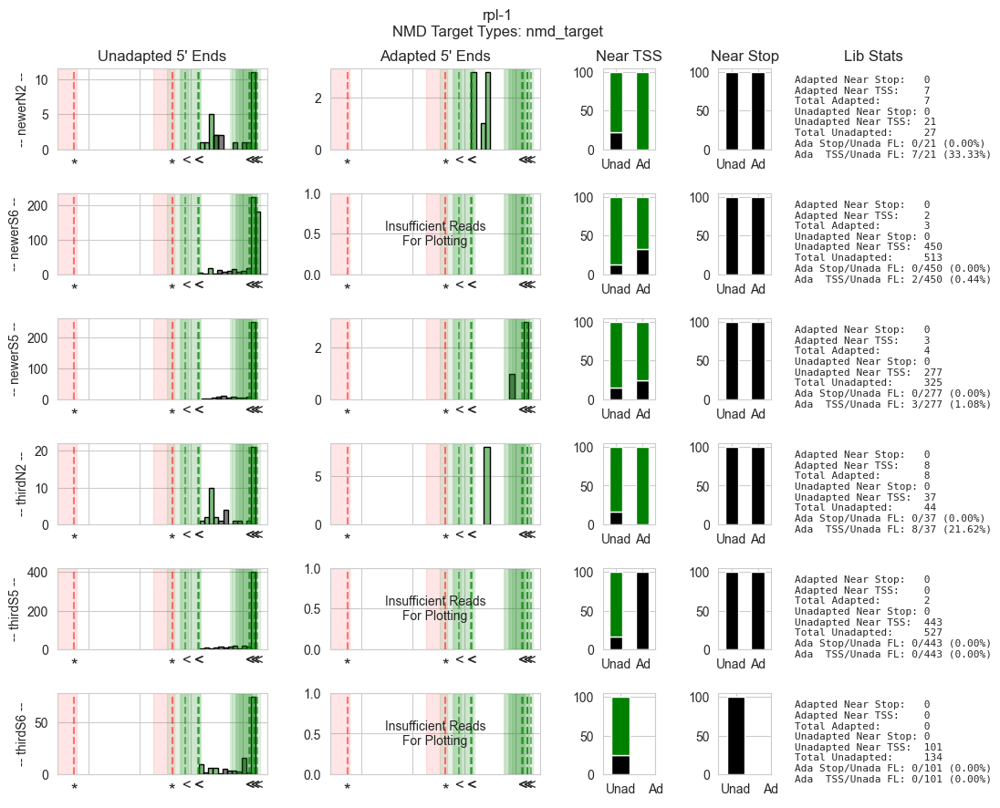

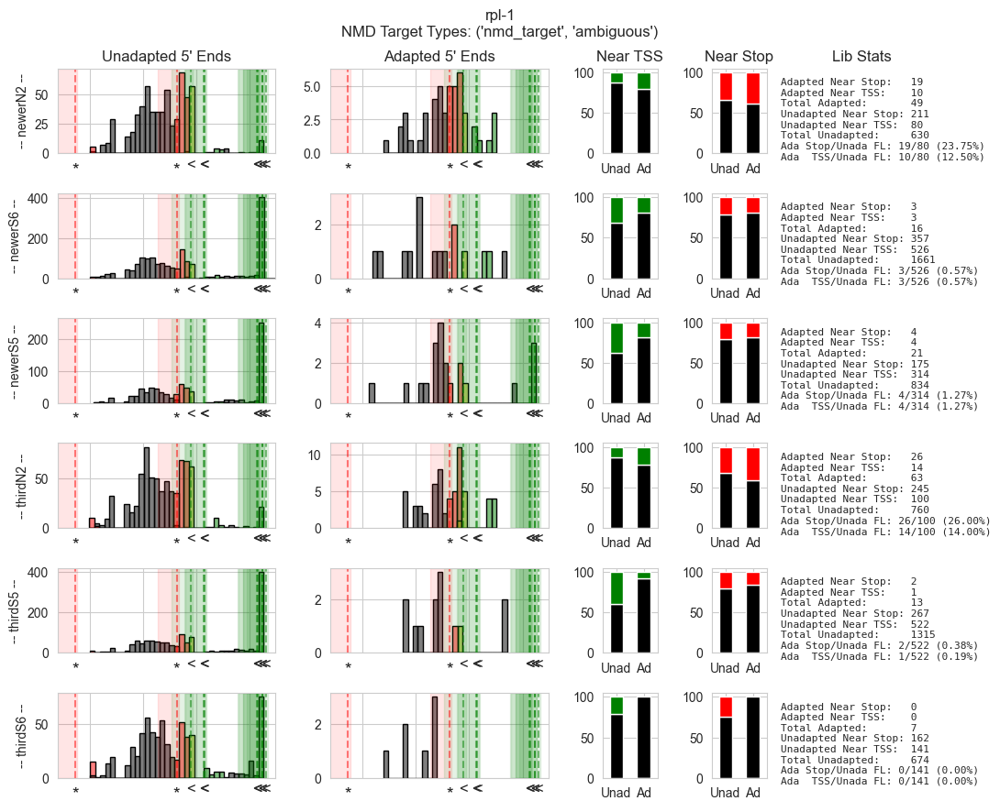

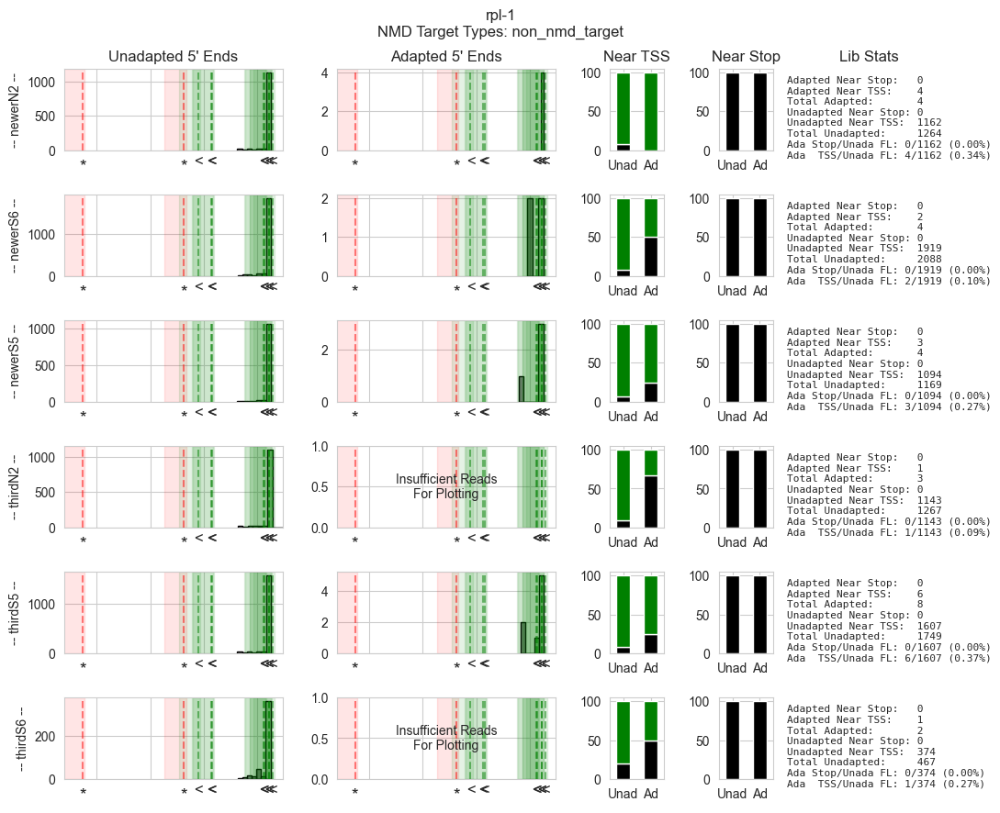

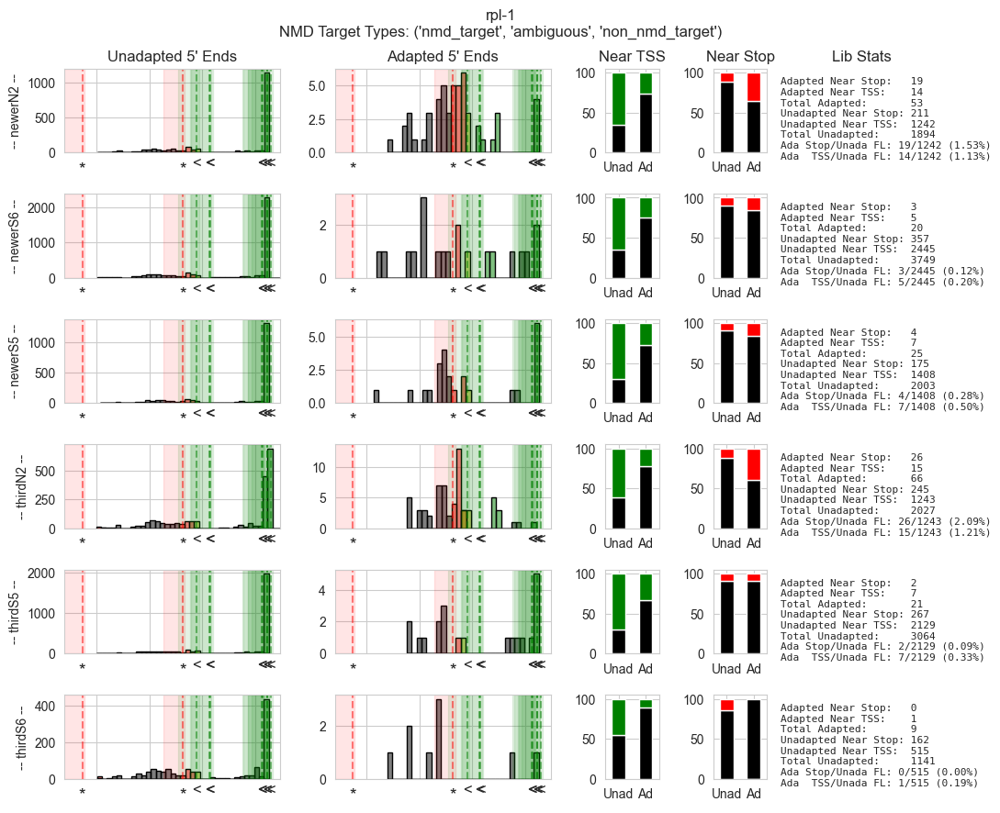

#####################ZK228.4######################
Error: `bins` must be positive, when an integer
Error: `bins` must be positive, when an integer
                                     read_id  bit_flag chr_id   chr_pos  mapq                                              cigar r_next p_next len                                           sequence  \
194673  459c3692-65e4-42b9-ae33-7314198d98f1         0      V  18462783    60  2S10M1D12M1D7M1I46M1I27M3I27M1D7M1D14M2D4M529N...      *      0   0  TATAAGTTTGAGTTTTTCCACTAGTTTTTATAAACAGAGTCGGTGA...   
194674  8a4318ed-3f48-4201-ab57-d1118416a2d7         0      V  18462787    60  5S19M1D25M1D7M1I19M2D5M1I8M2I56M3D23M1I30M2I7M...      *      0   0  CCAAGTTTGAGTTTTTTCCACTAGTTTTTATAATGGAGTTAGTGAT...   
194675  fb7fd150-1e90-4fc7-8f15-1add460635c1         0      V  18462807    60  17S24M3I15M1D34M1D10M1I6M1I1M1I73M500N9M2I41M1...      *      0   0  AGTTTTGAGTTTCTTAGTTTTTATAATGGAGTTAGTGATAATCGAC...   
195040  38ab0c60-9ffb-4cad-b09a-2c6205b4458b     

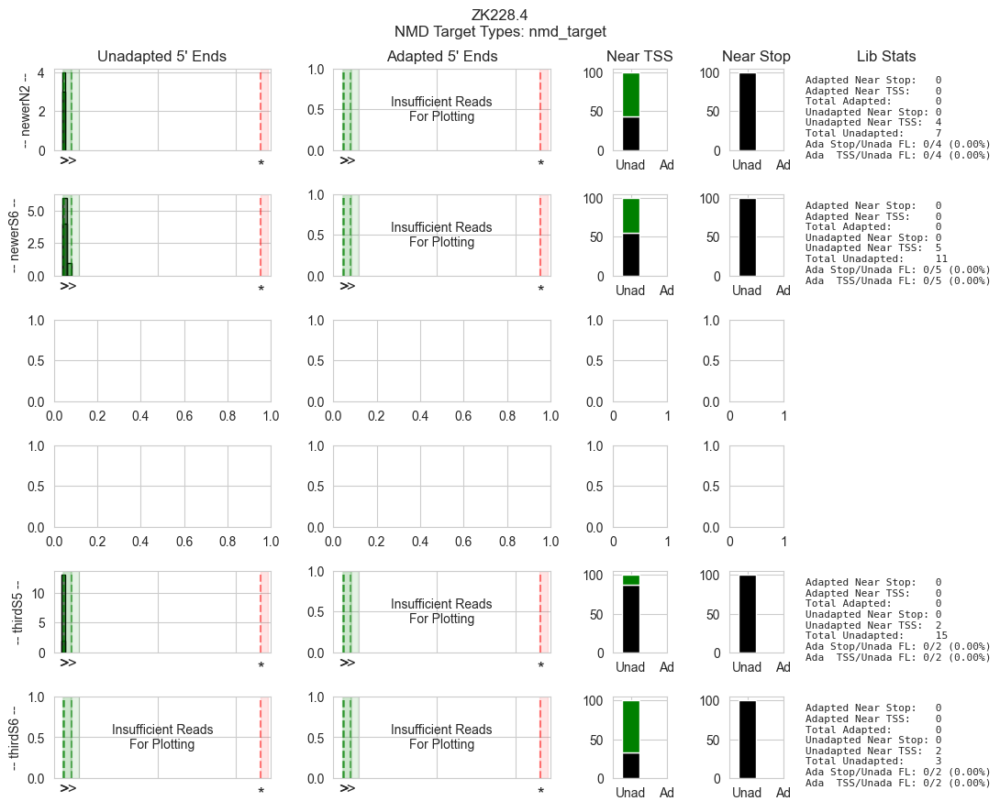

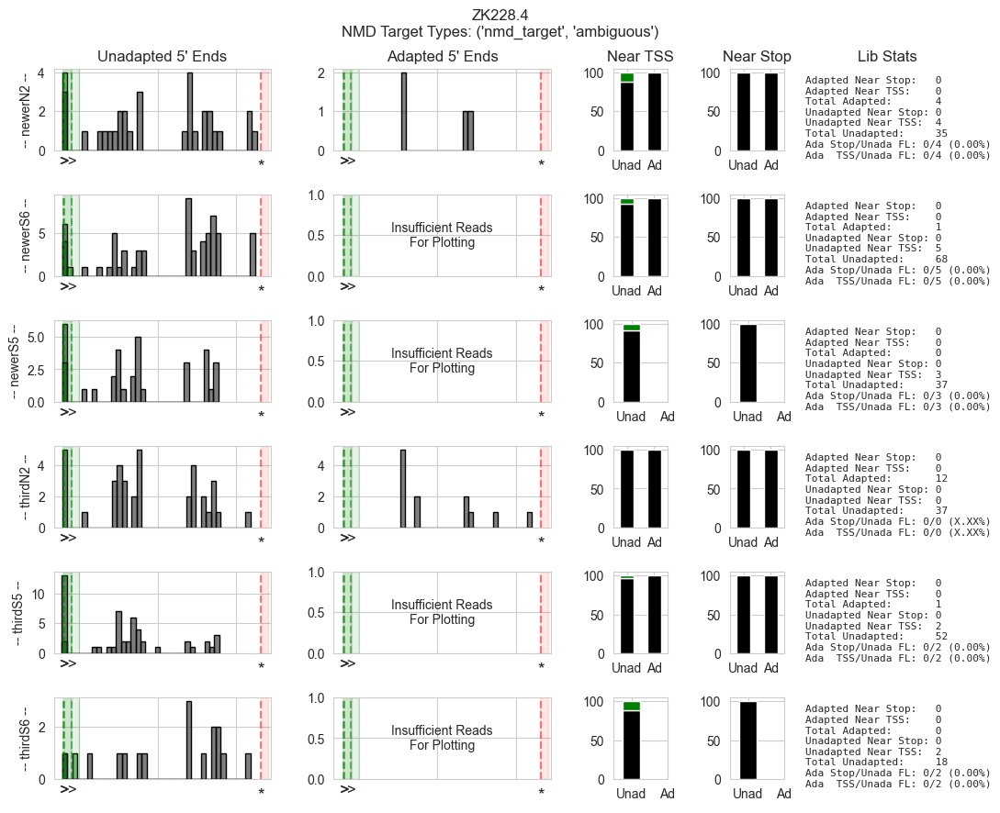

                                     read_id  bit_flag chr_id   chr_pos  mapq                                              cigar r_next p_next len                                           sequence  \
194673  459c3692-65e4-42b9-ae33-7314198d98f1         0      V  18462783    60  2S10M1D12M1D7M1I46M1I27M3I27M1D7M1D14M2D4M529N...      *      0   0  TATAAGTTTGAGTTTTTCCACTAGTTTTTATAAACAGAGTCGGTGA...   
194674  8a4318ed-3f48-4201-ab57-d1118416a2d7         0      V  18462787    60  5S19M1D25M1D7M1I19M2D5M1I8M2I56M3D23M1I30M2I7M...      *      0   0  CCAAGTTTGAGTTTTTTCCACTAGTTTTTATAATGGAGTTAGTGAT...   
194675  fb7fd150-1e90-4fc7-8f15-1add460635c1         0      V  18462807    60  17S24M3I15M1D34M1D10M1I6M1I1M1I73M500N9M2I41M1...      *      0   0  AGTTTTGAGTTTCTTAGTTTTTATAATGGAGTTAGTGATAATCGAC...   
195040  38ab0c60-9ffb-4cad-b09a-2c6205b4458b         0      V  18465183    60                      24S43M3D82M2D16M1D33M4D36M29S      *      0   0  CACAGTCTAATCAAGGAAATGGAGAGTTTGCTCCCAAAATTCTTGC..

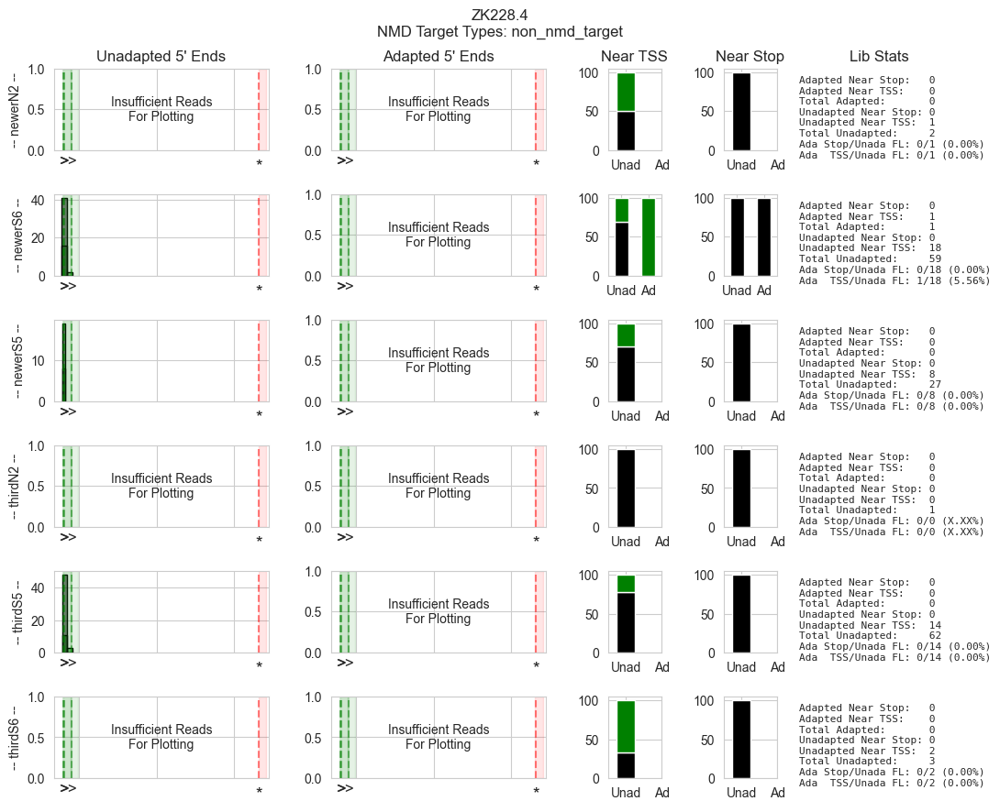

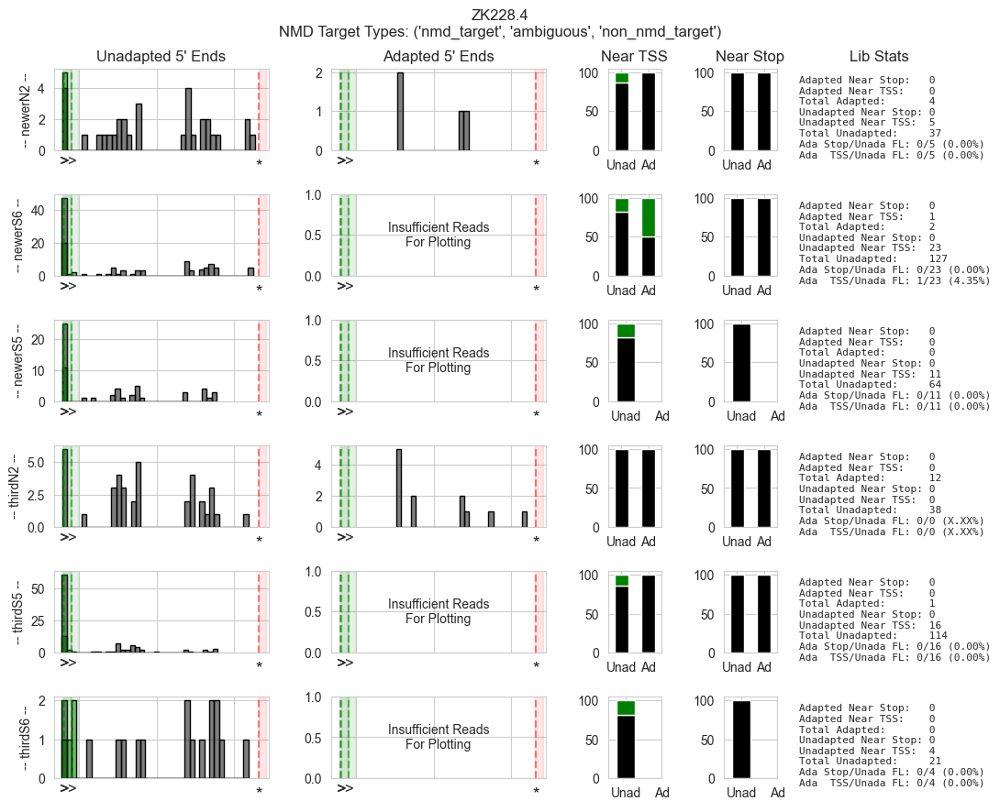

######################hel-1#######################


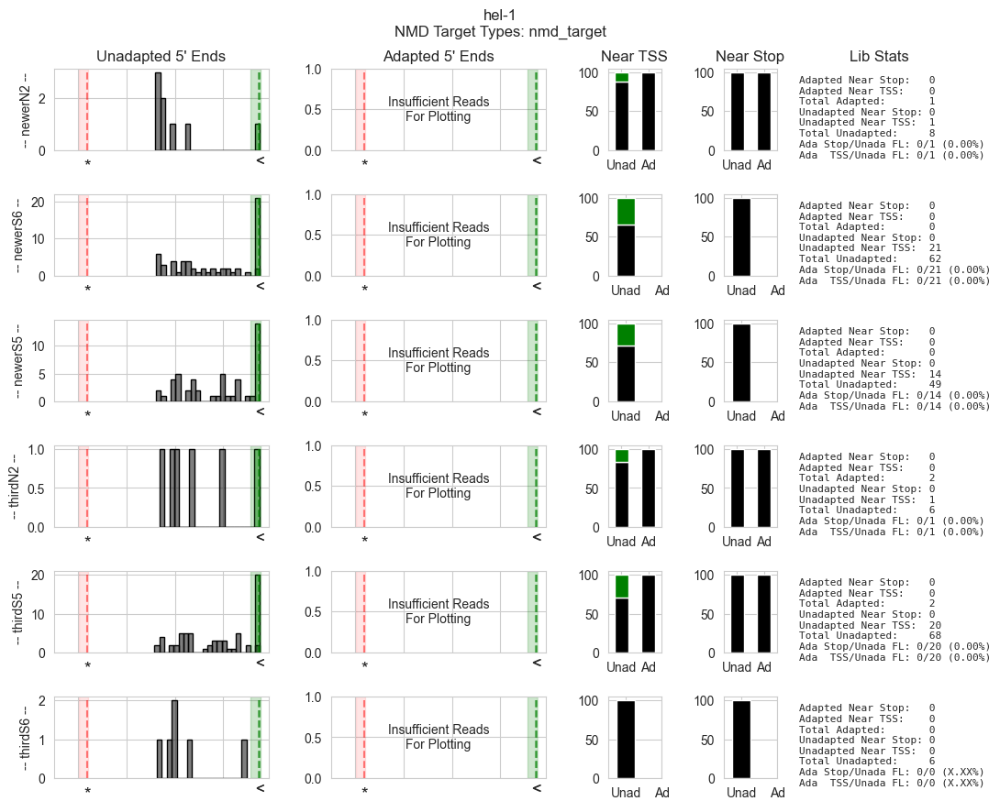

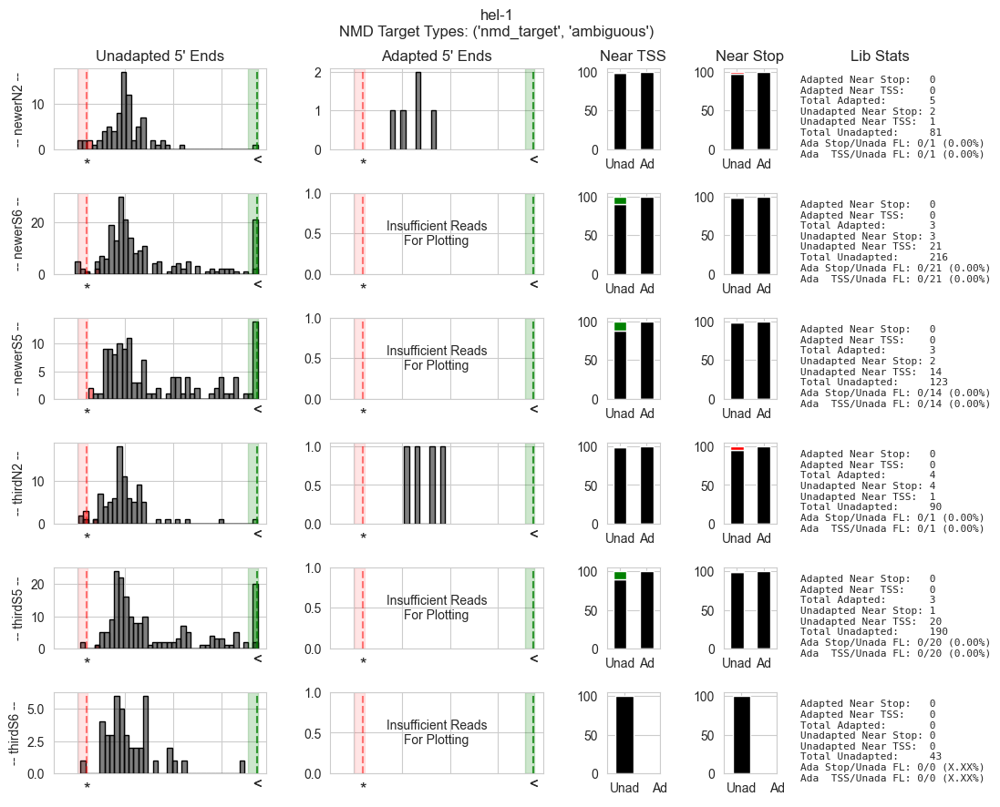

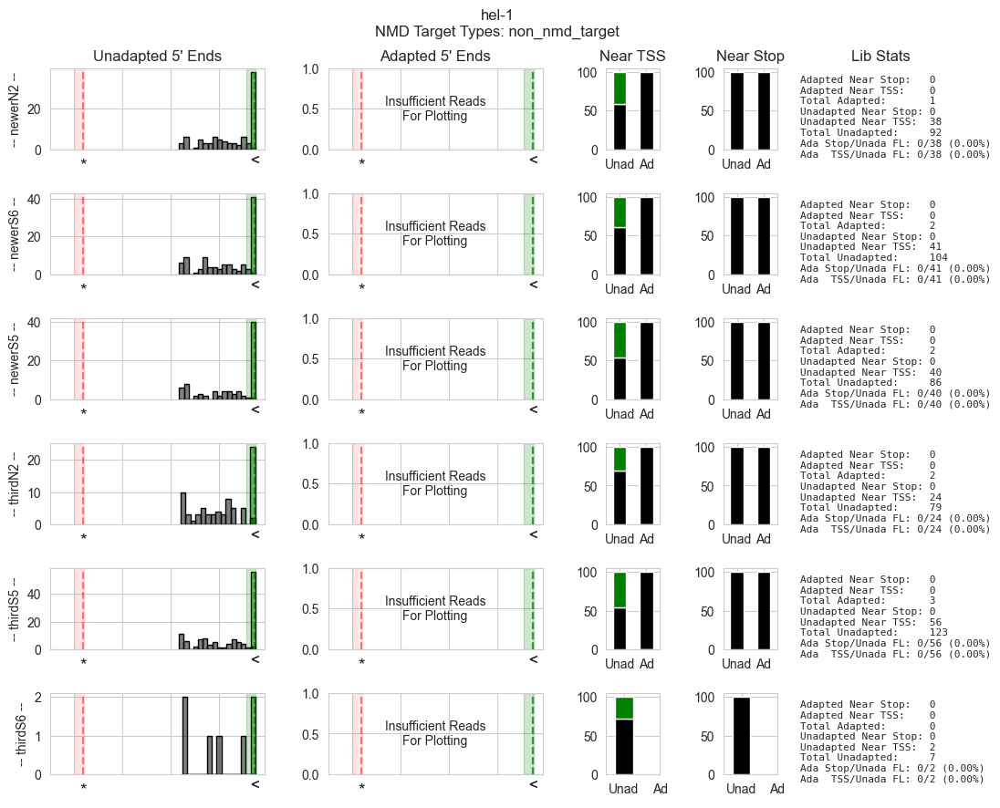

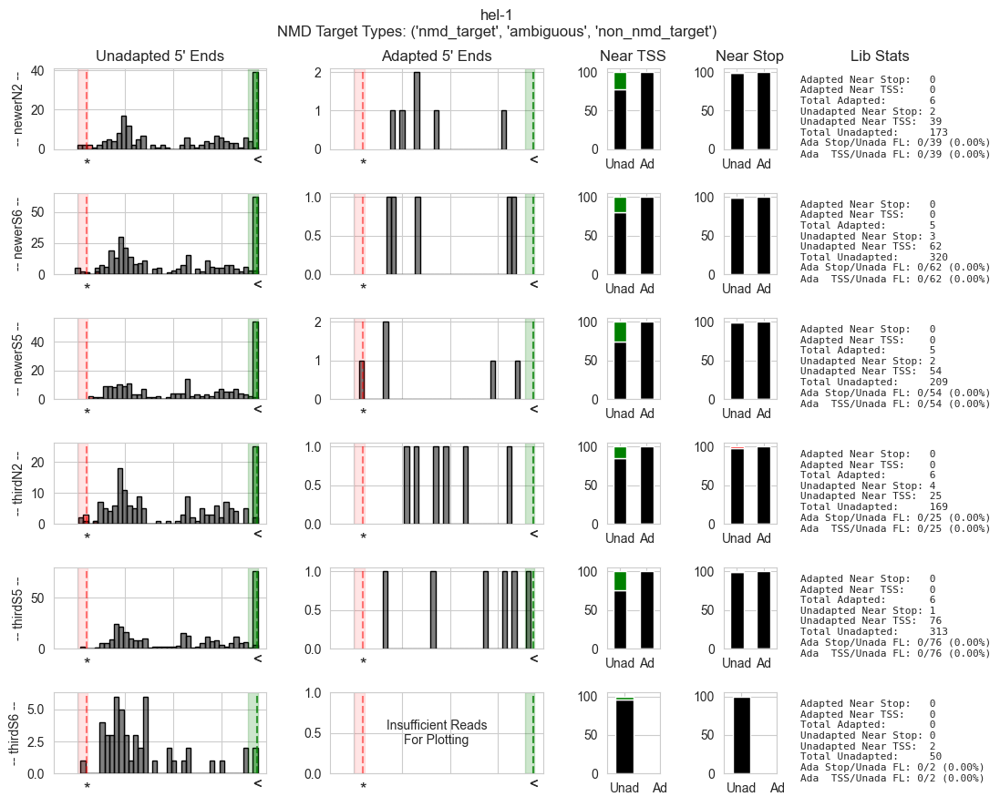

######################rsp-5#######################


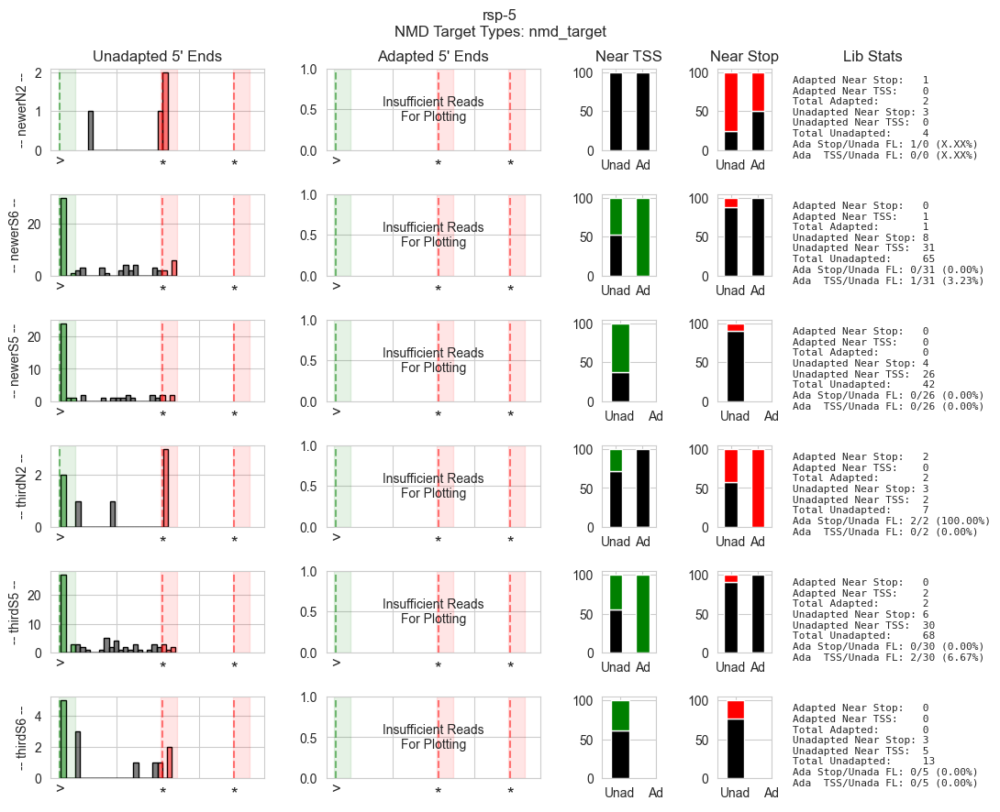

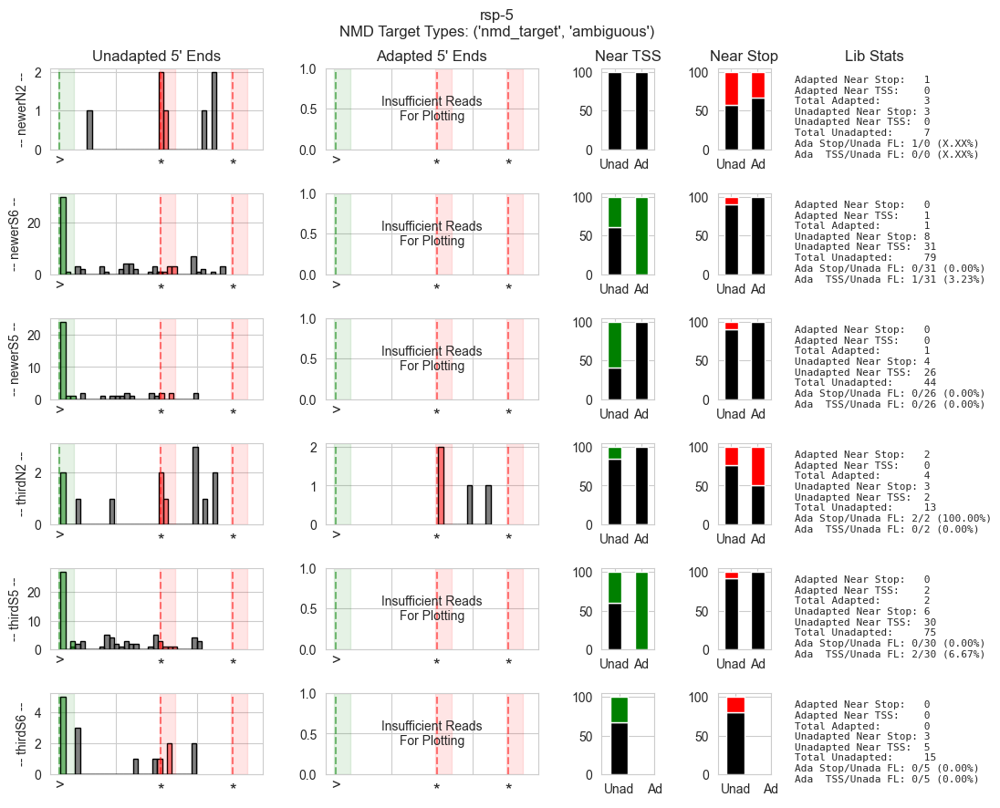

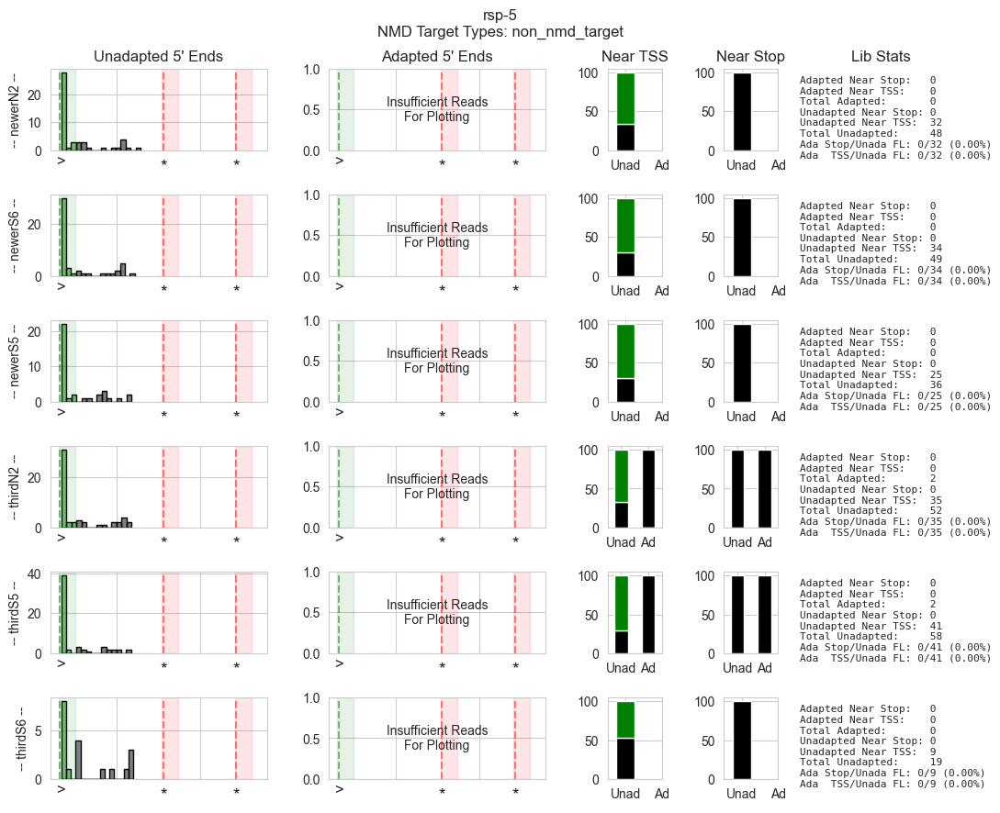

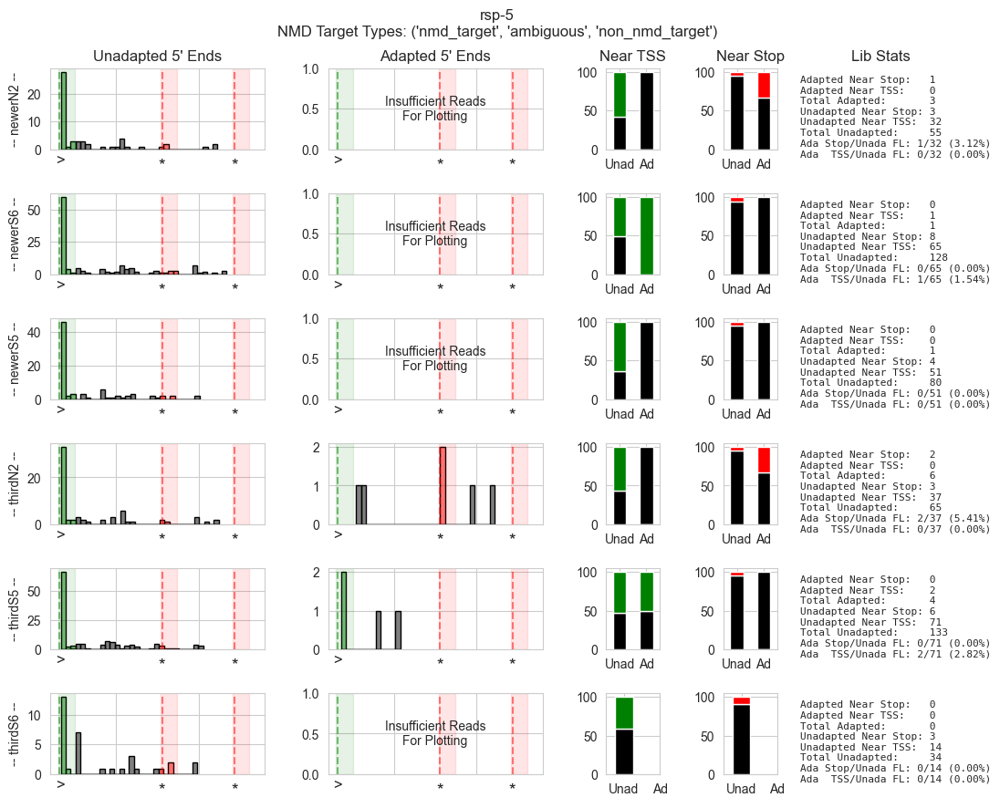

{'rpl-7A': {'NMD_Targets': {'newerN2': {'Adapted Near Stop': 2,
    'Adapted Near TSS': 0,
    'Total Adapted': 4,
    'Unadapted Near Stop': 12,
    'Unadapted Near TSS': 25,
    'Total Unadapted': 57},
   'newerS6': {'Adapted Near Stop': 6,
    'Adapted Near TSS': 16,
    'Total Adapted': 24,
    'Unadapted Near Stop': 357,
    'Unadapted Near TSS': 1150,
    'Total Unadapted': 2167},
   'newerS5': {'Adapted Near Stop': 2,
    'Adapted Near TSS': 8,
    'Total Adapted': 15,
    'Unadapted Near Stop': 181,
    'Unadapted Near TSS': 745,
    'Total Unadapted': 1356},
   'thirdN2': {'Adapted Near Stop': 5,
    'Adapted Near TSS': 1,
    'Total Adapted': 8,
    'Unadapted Near Stop': 12,
    'Unadapted Near TSS': 23,
    'Total Unadapted': 53},
   'thirdS5': {'Adapted Near Stop': 2,
    'Adapted Near TSS': 8,
    'Total Adapted': 16,
    'Unadapted Near Stop': 315,
    'Unadapted Near TSS': 1088,
    'Total Unadapted': 2025},
   'thirdS6': {'Adapted Near Stop': 1,
    'Adapted Near TSS':

In [224]:
UNANNOTATED_TSS_DICT = {  # these are manual annotations of transcription start sites that are not in the GTF file
    'rpl-7A': [4_390_579, 4_390_464],
}

UNANNOTATED_STOPS_DICT = {  # these are manual annotations of stops that are not in the GTF file
    'rps-22': [1_950_853],  # cassette exon contains PTC
    'rpl-30': [10_436_332],  # extension of first exon contains PTC
    'rpl-7A': [4_389_880, 4_389_745],  # unannotated extension of 3rd exon contains PTC (second loc due to potential FS)
    'rsp-6': [7_790_576],  # longer unannotated form of cassette exon causes frame shift
    'C53H9.2': [1_833_467],  # shorter first exon leaves frame shift
    'pqn-70': [11_226_879],  # skipped exon leads to a frame change
    'rpl-1': [2_875_908],  # new orf started in the 3' extension of the first exon, causing a frame change
    'R06C1.4': [11_931_081],  # unannotated cassette exon contains a frame shift
    'rpl-3': [3_868_335],  # incorrectly annotated first intron 3' truncation (2nd exon extended) contains stop
    'hel-2': [8_327_970],  # later 5' SS adds to 3rd exon and contains PTC
    'rpl-12': [13_240_078],  # later 5' SS of second intron adds extension to 2nd exon with a PTC
    'aly-3': [12_123_859], # huge extension of second exon contains as PTC
}

def plot_gene_data3(gtf_df, test_gene, plot_lib_df_dict, window_size=100,
                   up_v_down_fraction=0.10, number_of_bins=40,
                   flanking_gene_fraction=0.05, current_dir=None, print_stats=False,
                   title_override=None, save_name_override=None):
    
    min_reads_cutoff = 3
    
    extra_stops_dict = UNANNOTATED_STOPS_DICT
    extra_tss_dict = UNANNOTATED_TSS_DICT
    
    gtf_for_gene = gtf_df.query("gene_name == @test_gene")
    gene_start, gene_end = gtf_for_gene.query("feature == 'gene'").loc[:, ['start', 'end']].values[0]
    gene_length = gene_end - gene_start
    bin_width = gene_length / number_of_bins
    flanking_dist = int(gene_length * flanking_gene_fraction)
    
    strand = gtf_for_gene.query("feature == 'gene'").loc[:, 'strand'].values[0]
    if print_stats:
        print(f"Gene target ({test_gene}) on strand: {strand}")
    if strand == '-':
        if print_stats:
            print("Because this gene is on the reverse strand, we will have to calculate out the other end of the reads with the CIGAR strings. This will take slightly longer.")
        stop_locations = gtf_for_gene.query("feature == 'stop_codon'").loc[:, 'end'].values
        start_sites = gtf_for_gene.query("feature == 'transcript'").loc[:, 'end'].values
        up_v_down_fraction = 1 - up_v_down_fraction
        flipped = True
    else:
        stop_locations = gtf_for_gene.query("feature == 'stop_codon'").loc[:, 'start'].values
        start_sites = gtf_for_gene.query("feature == 'transcript'").loc[:, 'start'].values
        flipped = False
        
    stop_locations = list(stop_locations)
    start_sites = list(start_sites)
    
    if test_gene in extra_stops_dict:
        for stop_location in extra_stops_dict[test_gene]:
            stop_locations.append(stop_location)
    if test_gene in extra_tss_dict:
        for tss_location in extra_tss_dict[test_gene]:
            start_sites.append(tss_location)
    
    fig = plt.figure(figsize=(11, 1.5 * len(plot_lib_df_dict)))
    
    gs = fig.add_gridspec(len(plot_lib_df_dict), 5,
                          width_ratios=[4, 4, 1, 1, 1.5],
                          )
    summary_dict = {}
    for i, (lib, lib_df) in enumerate(plot_lib_df_dict.items()):

        if print_stats:
            print(f"\t{lib}:")
        ax1, ax2, ax3, ax4, ax5 = [fig.add_subplot(gs[i, j]) for j in range(5)]
        
        if i == 0:
            ax1.set_title("Unadapted 5' Ends")
            ax2.set_title("Adapted 5' Ends")
            ax3.set_title("Near TSS")
            ax4.set_title("Near Stop")
            ax5.set_title("Lib Stats")
        
        gene_df = lib_df.query('gene_name == @test_gene').copy()
        gene_df.replace({'t5': {0: '-', 1: '+', '+': '+', '-': '-'}}, inplace=True)
        if flipped:
            gene_df.loc[:, 'chr_pos'] = gene_df.apply(get_other_read_end, axis=1)
        gene_df.loc[:, 'near_tss'], gene_df.loc[:, 'near_stop'] = zip(*gene_df.apply(near_a_tss_or_stop, args=(strand, start_sites, stop_locations),
            full_window_size=window_size,window_bias_downstream=up_v_down_fraction, axis=1))
        gene_df.loc[:, 'hue'] = gene_df.apply(convert_near_tss_and_stop_to_hue, axis=1)
        
        unadapted_df = gene_df.query('t5 == "-"').copy()
        adapted_df = gene_df.query('t5 == "+"').copy()
        
        # Create annotations to put in ax5
        ada_near_stop_count = adapted_df.query('near_stop').shape[0]
        ada_near_tss_count = adapted_df.query('near_tss').shape[0]
        unada_near_stop_count = unadapted_df.query('near_stop').shape[0]
        unada_near_tss_count = unadapted_df.query('near_tss').shape[0]
        ada_total_count = adapted_df.shape[0]
        unada_total_count = unadapted_df.shape[0]
        try:
            ada_stop_over_FL_string = f"{ada_near_stop_count}/{unada_near_tss_count} ({ada_near_stop_count/unada_near_tss_count:.2%})"
            ada_tss_over_FL_string = f"{ada_near_tss_count}/{unada_near_tss_count} ({ada_near_tss_count/unada_near_tss_count:.2%})"
        except ZeroDivisionError:
            ada_stop_over_FL_string = f"{ada_near_stop_count}/{unada_near_tss_count} (X.XX%)"
            ada_tss_over_FL_string = f"{ada_near_tss_count}/{unada_near_tss_count} (X.XX%)"
        ax5.axis('off')
        plot_string = (
            f"Adapted Near Stop:   {ada_near_stop_count}\n"
            f"Adapted Near TSS:    {ada_near_tss_count}\n"
            f"Total Adapted:       {ada_total_count}\n"
            f"Unadapted Near Stop: {unada_near_stop_count}\n"
            f"Unadapted Near TSS:  {unada_near_tss_count}\n"
            f"Total Unadapted:     {unada_total_count}\n"
            f"Ada Stop/Unada FL: {ada_stop_over_FL_string}\n"
            f"Ada  TSS/Unada FL: {ada_tss_over_FL_string}"
        )
        summary_dict[lib] = {
            'Adapted Near Stop': ada_near_stop_count,
            'Adapted Near TSS': ada_near_tss_count,
            'Total Adapted': ada_total_count,
            'Unadapted Near Stop': unada_near_stop_count,
            'Unadapted Near TSS': unada_near_tss_count,
            'Total Unadapted': unada_total_count,
        }
        try:
            unadapted_value_counts = unadapted_df['near_tss'].value_counts(normalize=True)
            if print_stats:
                print(f"\t\tUnadapted Read Distribution (near a TSS):")
                print(f"\t\t\t True: {unadapted_value_counts.get(True, 0.0):%}")
                print(f"\t\t\tFalse: {unadapted_value_counts.get(False, 0.0):%}")
            if unadapted_df.shape[0] > min_reads_cutoff:
                sea.histplot(data=unadapted_df,
                             x='chr_pos',
                             hue='hue',
                             palette={'r': 'r', 'g': 'g', 'k': 'k', 'y': 'y'},
                             binwidth=bin_width,
                             ax=ax1,
                             edgecolor='k', linewidth=1.0,
                             )
                ax1.get_legend().remove()
            else:
                ax1.text(0.5, 0.5, "Insufficient Reads\nFor Plotting", horizontalalignment='center', verticalalignment='center', transform=ax1.transAxes)
                print(lib_obj.mergedOnReads_df.query('gene_name == @test_gene').head())
            ax1.set_ylabel(f"-- {lib} --")
            
            data_ct = pd.crosstab(index=gene_df['t5'], columns=gene_df['near_tss'])
            data_ct = data_ct.div(data_ct.sum(axis=1), axis=0) * 100
            data_ct.sort_index(ascending=False, inplace=True)
            
            color_dict = {True: 'g', False: 'k', None: 'y'}
            try:
                data_ct.plot(kind='bar',
                             stacked=True,
                             ax=ax3,
                             color=[color_dict[col] for col in data_ct.columns],
                             )
            except ValueError as e:
                print(f"Error: {e}")
                print(data_ct)
            ax3.set_ylabel ("") # ("% Near TSS")
            ax3.get_legend().remove()
            
            adapted_value_counts = adapted_df['near_stop'].value_counts(normalize=True)
            if print_stats:
                print(f"\t\tAdapted Read Distribution (near a STOP):")
                print(f"\t\t\t True: {adapted_value_counts.get(True, 0.0):%}")
                print(f"\t\t\tFalse: {adapted_value_counts.get(False, 0.0):%}")
            if adapted_df.shape[0] > min_reads_cutoff:
                sea.histplot(data=adapted_df,
                             x='chr_pos',
                             hue='hue',
                             palette={'r': 'r', 'g': 'g', 'k': 'k', 'y': 'y'},
                             binwidth=bin_width,
                             ax=ax2,
                             edgecolor='k', linewidth=1.0,
                             )
                ax2.get_legend().remove()
            else:
                ax2.text(0.5, 0.5, "Insufficient Reads\nFor Plotting", horizontalalignment='center', verticalalignment='center', transform=ax2.transAxes)
            
            ax2.set_ylabel(f"")
            
            data_ct = pd.crosstab(index=gene_df['t5'], columns=gene_df['near_stop'])
            data_ct = data_ct.div(data_ct.sum(axis=1), axis=0) * 100
            data_ct.sort_index(ascending=False, inplace=True)
            
            color_dict = {True: 'r', False: 'k', None: 'y'}
            try:
                data_ct.plot(kind='bar',
                             stacked=True,
                             ax=ax4,
                             color=[color_dict[col] for col in data_ct.columns],
                             )
            except ValueError as e:
                print(f"Error: {e}")
                print(data_ct)
            ax4.set_ylabel("")
            ax4.get_legend().remove()
            
            ax1.set_xlim(gene_start-flanking_dist, gene_end+flanking_dist)
            ax2.set_xlim(gene_start-flanking_dist, gene_end+flanking_dist)
            ax1.set_xlabel(f"")
            ax2.set_xlabel(f"")
            ax1.set_xticklabels([])
            ax2.set_xticklabels([])
            
            ax3.set_xlabel(f"")
            ax4.set_xlabel(f"")
            ax3.set_xticks([0 ,1], labels=['Unad', 'Ad'], rotation=0)
            ax4.set_xticks([0 ,1], labels=['Unad', 'Ad'], rotation=0)
            
            precompute_transforms = {ax1: ax1.get_xaxis_transform(),
                                     ax2: ax2.get_xaxis_transform()}
            for stop_loc in set(stop_locations):
                for ax in [ax1, ax2]:
                    ax.axvline(stop_loc, color='r', linestyle='--', alpha=0.5)
                    ax.axvspan(stop_loc-window_size*up_v_down_fraction,
                               stop_loc+window_size*(1-up_v_down_fraction),
                               color='r', alpha=0.1)
                    blend_transform = precompute_transforms[ax]
                    ax.text(stop_loc, -0.1, "*", rotation=0,
                            verticalalignment='top', horizontalalignment='center',
                            transform=blend_transform,
                            fontsize=14)
            for start_site in set(start_sites):
                for ax in [ax1, ax2]:
                    ax.axvline(start_site, color='g', linestyle='--', alpha=0.5)
                    ax.axvspan(start_site-window_size*up_v_down_fraction,
                               start_site+window_size*(1-up_v_down_fraction),
                               color='g', alpha=0.1)
                    blend_transform = precompute_transforms[ax]
                    if flipped:
                        tss_icon = "<"
                    else:
                        tss_icon = ">"
                    ax.text(start_site, -0.05, tss_icon, rotation=0,
                            verticalalignment='top', horizontalalignment='center',
                            transform=blend_transform,
                            fontsize=12)
            ax5.text(-0.5, 0.4, plot_string,
                     fontsize=8,
                     fontfamily='monospace',
                     horizontalalignment='left',
                     verticalalignment='center',
                     )
        except Exception as e:
            print(f"Error: {e}")
        if isinstance(title_override, str):
            plt.suptitle(title_override)
        else:
            plt.suptitle(f"{test_gene} ({strand} strand)")
        plt.tight_layout()
        if current_dir is not None:
            if isinstance(save_name_override, str):
                plt.savefig(current_dir / 'plots' / '5PrimeEndsPerGene' / f"{save_name_override}.png", dpi=300)
                plt.savefig(current_dir / 'plots' / '5PrimeEndsPerGene' / f"{save_name_override}.svg")
            else:
                plt.savefig(current_dir / 'plots' / '5PrimeEndsPerGene' / f"{test_gene}_5PrimeEnds.png", dpi=300)
                plt.savefig(current_dir / 'plots' / '5PrimeEndsPerGene' / f"{test_gene}_5PrimeEnds.svg")
    plt.show()
    return summary_dict


def just_extract_gene_data(gtf_df, test_gene, plot_lib_df_dict, window_size=100,
                           up_v_down_fraction=0.10, number_of_bins=40,
                            flanking_gene_fraction=0.05, print_stats=False):    
    extra_stops_dict = UNANNOTATED_STOPS_DICT
    extra_tss_dict = UNANNOTATED_TSS_DICT
    
    gtf_for_gene = gtf_df.query("gene_name == @test_gene")
    gene_start, gene_end = gtf_for_gene.query("feature == 'gene'").loc[:, ['start', 'end']].values[0]
    gene_length = gene_end - gene_start
    
    strand = gtf_for_gene.query("feature == 'gene'").loc[:, 'strand'].values[0]
    if print_stats:
        print(f"Gene target ({test_gene}) on strand: {strand}")
    if strand == '-':
        if print_stats:
            print("Because this gene is on the reverse strand, we will have to calculate out the other end of the reads with the CIGAR strings. This will take slightly longer.")
        stop_locations = gtf_for_gene.query("feature == 'stop_codon'").loc[:, 'end'].values
        start_sites = gtf_for_gene.query("feature == 'transcript'").loc[:, 'end'].values
        up_v_down_fraction = 1 - up_v_down_fraction
        flipped = True
    else:
        stop_locations = gtf_for_gene.query("feature == 'stop_codon'").loc[:, 'start'].values
        start_sites = gtf_for_gene.query("feature == 'transcript'").loc[:, 'start'].values
        flipped = False
        
    stop_locations = list(stop_locations)
    start_sites = list(start_sites)
    
    if test_gene in extra_stops_dict:
        for stop_location in extra_stops_dict[test_gene]:
            stop_locations.append(stop_location)
    if test_gene in extra_tss_dict:
        for tss_location in extra_tss_dict[test_gene]:
            start_sites.append(tss_location)
    summary_dict_for_gene = {}
    for i, (lib, lib_df) in enumerate(plot_lib_df_dict.items()):

        if print_stats:
            print(f"\t{lib}:")
        
        gene_df = lib_df.query('gene_name == @test_gene').copy()
        gene_df.replace({'t5': {0: '-', 1: '+', '+': '+', '-': '-'}}, inplace=True)
        if flipped:
            gene_df.loc[:, 'chr_pos'] = gene_df.apply(get_other_read_end, axis=1)
        gene_df.loc[:, 'near_tss'], gene_df.loc[:, 'near_stop'] = zip(*gene_df.apply(near_a_tss_or_stop, args=(strand, start_sites, stop_locations),
            full_window_size=window_size,window_bias_downstream=up_v_down_fraction, axis=1))
        gene_df.loc[:, 'hue'] = gene_df.apply(convert_near_tss_and_stop_to_hue, axis=1)
        
        unadapted_df = gene_df.query('t5 == "-"').copy()
        adapted_df = gene_df.query('t5 == "+"').copy()
        
        # Create annotations to put in ax5
        ada_near_stop_count = adapted_df.query('near_stop').shape[0]
        ada_near_tss_count = adapted_df.query('near_tss').shape[0]
        unada_near_stop_count = unadapted_df.query('near_stop').shape[0]
        unada_near_tss_count = unadapted_df.query('near_tss').shape[0]
        ada_total_count = adapted_df.shape[0]
        unada_total_count = unadapted_df.shape[0]
        summary_dict_for_gene[lib] = {
            'Adapted Near Stop': ada_near_stop_count,
            'Adapted Near TSS': ada_near_tss_count,
            'Total Adapted': ada_total_count,
            'Unadapted Near Stop': unada_near_stop_count,
            'Unadapted Near TSS': unada_near_tss_count,
            'Total Unadapted': unada_total_count,
        }
    plt.show()
    return summary_dict_for_gene

plot_libs = [
    # 'oldN2',
    'newerN2',
    'newerS6',
    'newerS5',
    'thirdN2',
    'thirdS5',
    'thirdS6',
]
plot_lib_objs_dict = {lib: obj_dict[lib] for lib in plot_libs}
overall_summaries_nested_dict = {}
for gene in nmd_genes[::-1]:
    # if gene != "rpl-7A":
    #     continue
    print(f"{gene:#^50}")
    gene_summary_dicts = {}
    target_nmd_types = ('nmd_target', 'ambiguous', 'non_nmd_target')
    subset_nmd_types_list = [target_nmd_types[0], target_nmd_types[:2], target_nmd_types[2], target_nmd_types[:]]
    subset_nmd_types_names = ['NMD_Targets', 'NMD_TargetsAndAmbiguous', 'NMD_NonTargets', 'All_NMD_Types']
    
    for subset_nmd_types, subset_nmd_types_name in zip(subset_nmd_types_list, subset_nmd_types_names):
        try:
            lib_df_dict_for_gene = {lib: lib_obj.nmd_targets_df.query('gene_name == @gene & nmd_assignment in @subset_nmd_types')
                                    for lib, lib_obj in plot_lib_objs_dict.items()}
            summary_dict = plot_gene_data3(gtf_df, gene, lib_df_dict_for_gene, print_stats=False,
                                           title_override=f"{gene}\nNMD Target Types: {subset_nmd_types}",
                                           save_name_override=f"{gene}_{subset_nmd_types_name}",
                                           current_dir=current_dir,)
            # summary_dict = just_extract_gene_data(gtf_df, gene, lib_df_dict_for_gene, print_stats=False)
            gene_summary_dicts[subset_nmd_types_name] = summary_dict
        except Exception as e:
            print(f"Error: {e}")
            print(f"Gene: {gene}")
            print(f"NMD Types: {subset_nmd_types}")
            print(f"Continuing...")
    overall_summaries_nested_dict[gene] = gene_summary_dicts
overall_summaries_nested_dict

In [114]:
 from pprint import pprint
plotting_list_for_df = []

dict_index = 0
for gene, gene_dict in overall_summaries_nested_dict.items():
    for nmd_target_type, target_type_dict in gene_dict.items():
        print(f"{gene} ({nmd_target_type}):")
        for lib, lib_dict in target_type_dict.items():
            print(f"\t{lib}:")
            print(f"\t\tAdapted Near Stop:   {lib_dict['Adapted Near Stop']}")
            print(f"\t\tAdapted Near TSS:    {lib_dict['Adapted Near TSS']}")
            print(f"\t\tTotal Adapted:       {lib_dict['Total Adapted']}")
            print(f"\t\tUnadapted Near Stop: {lib_dict['Unadapted Near Stop']}")
            print(f"\t\tUnadapted Near TSS:  {lib_dict['Unadapted Near TSS']}")
            print(f"\t\tTotal Unadapted:     {lib_dict['Total Unadapted']}")
            try:
                print(f"\t\tAda Stop/Unada FL: {lib_dict['Adapted Near Stop']/lib_dict['Unadapted Near TSS']:.2%}")
            except ZeroDivisionError:
                print(f"\t\tAda Stop/Unada FL: -- NO UNADAPTED FL --")
            plotting_list_for_df.append(
                {
                    'gene_name': gene,
                    'nmd_target_type': nmd_target_type,
                    'lib': lib,
                    'adapted_near_stop': lib_dict['Adapted Near Stop'],
                    'adapted_near_tss': lib_dict['Adapted Near TSS'],
                    'total_adapted': lib_dict['Total Adapted'],
                    'unadapted_near_stop': lib_dict['Unadapted Near Stop'],
                    'unadapted_near_tss': lib_dict['Unadapted Near TSS'],
                    'total_unadapted': lib_dict['Total Unadapted'],
                }
            )

rpl-7A (NMD_Targets):
	newerN2:
		Adapted Near Stop:   2
		Adapted Near TSS:    0
		Total Adapted:       4
		Unadapted Near Stop: 12
		Unadapted Near TSS:  25
		Total Unadapted:     57
		Ada Stop/Unada FL: 8.00%
	newerS6:
		Adapted Near Stop:   6
		Adapted Near TSS:    16
		Total Adapted:       24
		Unadapted Near Stop: 357
		Unadapted Near TSS:  1150
		Total Unadapted:     2167
		Ada Stop/Unada FL: 0.52%
	newerS5:
		Adapted Near Stop:   2
		Adapted Near TSS:    8
		Total Adapted:       15
		Unadapted Near Stop: 181
		Unadapted Near TSS:  745
		Total Unadapted:     1356
		Ada Stop/Unada FL: 0.27%
	thirdN2:
		Adapted Near Stop:   5
		Adapted Near TSS:    1
		Total Adapted:       8
		Unadapted Near Stop: 12
		Unadapted Near TSS:  23
		Total Unadapted:     53
		Ada Stop/Unada FL: 21.74%
	thirdS5:
		Adapted Near Stop:   2
		Adapted Near TSS:    8
		Total Adapted:       16
		Unadapted Near Stop: 315
		Unadapted Near TSS:  1088
		Total Unadapted:     2025
		Ada Stop/Unada FL: 0.18%
	thirdS6:

In [115]:
plotting_summary_df = pd.DataFrame.from_records(plotting_list_for_df)
plotting_summary_df

,gene_name,nmd_target_type,lib,adapted_near_stop,adapted_near_tss,total_adapted,unadapted_near_stop,unadapted_near_tss,total_unadapted
0,rpl-7A,NMD_Targets,newerN2,2,0,4,12,25,57
1,rpl-7A,NMD_Targets,newerS6,6,16,24,357,1150,2167
2,rpl-7A,NMD_Targets,newerS5,2,8,15,181,745,1356
3,rpl-7A,NMD_Targets,thirdN2,5,1,8,12,23,53
4,rpl-7A,NMD_Targets,thirdS5,2,8,16,315,1088,2025
...,...,...,...,...,...,...,...,...,...
403,rsp-5,All_NMD_Types,newerS6,0,1,1,8,65,128
404,rsp-5,All_NMD_Types,newerS5,0,0,1,4,51,80
405,rsp-5,All_NMD_Types,thirdN2,2,0,6,3,37,65
406,rsp-5,All_NMD_Types,thirdS5,0,2,4,6,71,133


In [175]:
plotting_summary_df['nmd_active'] = plotting_summary_df.lib.str.contains('N2')
plotting_summary_df['ada_tss/unada_tss'] = plotting_summary_df['adapted_near_tss'] / plotting_summary_df['unadapted_near_tss']
plotting_summary_df['ada_stop/unada_tss'] = plotting_summary_df['adapted_near_stop'] / plotting_summary_df['unadapted_near_tss']
plotting_summary_df.nmd_target_type.unique()

array(['NMD_Targets', 'NMD_TargetsAndAmbiguous', 'NMD_NonTargets',
       'All_NMD_Types'], dtype=object)

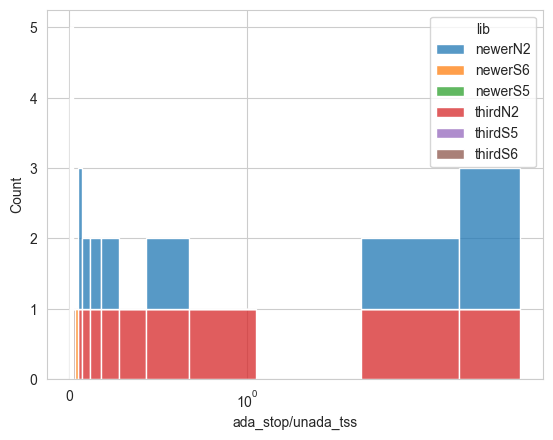

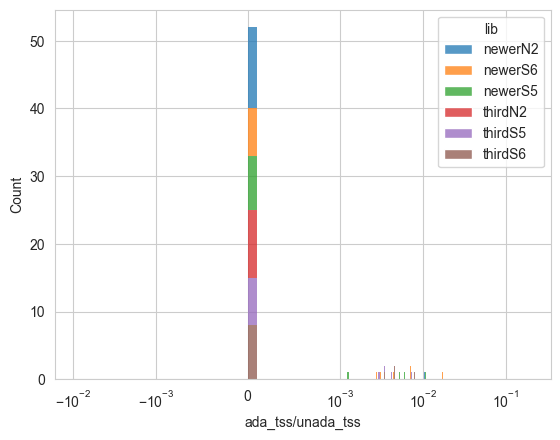

In [117]:
round_inf_to = 4
plotting_summary_df['ada_tss/unada_tss'] = plotting_summary_df['ada_tss/unada_tss'].replace({np.inf: round_inf_to, -np.inf: -round_inf_to})
plotting_summary_df['ada_stop/unada_tss'] = plotting_summary_df['ada_stop/unada_tss'].replace({np.inf: round_inf_to, -np.inf: -round_inf_to})

sea.histplot(data=plotting_summary_df.query("nmd_target_type == 'NMD_Targets'"),
             x='ada_stop/unada_tss',
             hue='lib',
             # element='step',
             bins=20,
             multiple='stack',
             fill=True,
             # discrete=True,
             log_scale=(True, False),
             )
plt.xscale('symlog')
plt.show()
sea.histplot(data=plotting_summary_df.query("nmd_target_type == 'NMD_Targets'"),
             x='ada_tss/unada_tss',
             hue='lib',
             # element='step',
             binwidth=0.0001,
             multiple='stack',
             fill=True,
             # discrete=True,
             # log_scale=(True, False),
             )
plt.xscale('symlog', linthresh=0.001)
plt.show()

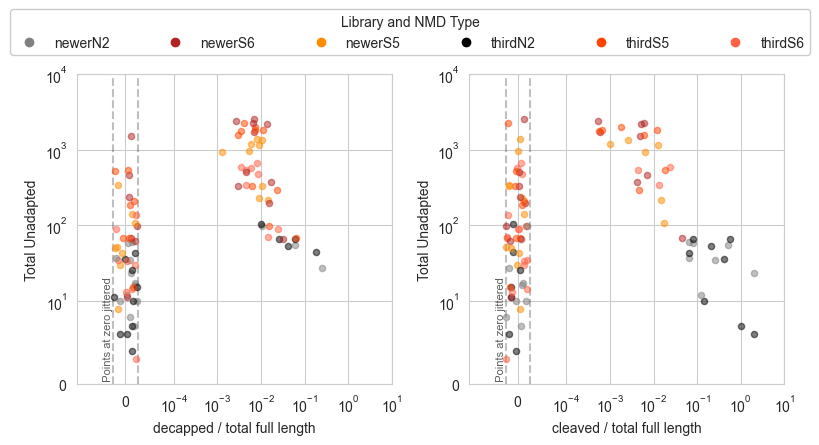

In [192]:
import seaborn.objects as so
import matplotlib.lines as mlines

linthresh = 0.0001
jitter_denominator = 4

# xcols = ['ada_tss/unada_tss', 'ada_stop/unada_tss']
xcols = ['ada_tss/total_tss', 'ada_stop/total_tss']
ycol = 'total_unadapted'

# lib_colors = {
#     'newerN2': 'red',
#     'newerS6': 'grey',
#     'newerS5': 'black',
#     'thirdN2': 'orange',
#     'thirdS6': 'grey',
#     'thirdS5': 'black',
# }
lib_colors = {
    'newerN2': 'grey',
    'newerS6': 'firebrick',
    'newerS5': 'darkorange',
    'thirdN2': 'black',
    'thirdS6': 'tomato',
    'thirdS5': 'orangered',
}

# fig, axes = plt.subplots(2, 2, figsize=(8, 8))
# ((ax1, ax2), (ax3, ax4)) = axes
fig, axes = plt.subplots(1, 2, figsize=(8, 4))
ax1, ax2 = axes

nmd_types_to_plot = [
    'NMD_Targets',
    # 'NMD_NonTargets',
]
plot_df = plotting_summary_df.query("nmd_target_type in @nmd_types_to_plot").copy()

plot_df['total_tss'] = plot_df['adapted_near_tss'] + plot_df['unadapted_near_tss']
plot_df['total_stop'] = plot_df['adapted_near_stop'] + plot_df['unadapted_near_tss']

plot_df['ada_tss/total_tss'] = plot_df['adapted_near_tss'] / plot_df['total_tss']
plot_df['ada_stop/total_tss'] = plot_df['adapted_near_stop'] / plot_df['total_tss']

plot_df['lib_colors'] = plot_df.lib.map(lib_colors)
plot_df[xcols[0]] = plot_df[xcols[0]].transform(lambda x: np.random.uniform(
    -linthresh/jitter_denominator,
    linthresh/jitter_denominator,
) if x == 0 else x)
plot_df[xcols[1]] = plot_df[xcols[1]].transform(lambda x: np.random.uniform(
    -linthresh/jitter_denominator,
    linthresh/jitter_denominator,
) if x == 0 else x)

for gene in plot_df.gene_name.unique():
    sub_gene_plot_df = plot_df.query("gene_name == @gene")
    # sub_gene_plot_df.plot(x='ada_tss/unada_tss',
    #                       y='total_unadapted',
    #                       kind='line',
    #                       linestyle=':',
    #                       ax=ax1,
    #                       c='black',
    #                       alpha=0.25)
    # sub_gene_plot_df.plot(x='ada_stop/unada_tss',
    #                       y='total_unadapted',
    #                       kind='line',
    #                       linestyle=':',
    #                       ax=ax2,
    #                       c='black',
    #                       alpha=0.25)
    for lib in sub_gene_plot_df.lib.unique():
        sub_lib_plot_df = sub_gene_plot_df.query("lib == @lib")
        marker_types = ['o', '+']
        for i, nmd_target_type in enumerate(sub_lib_plot_df.nmd_target_type.unique()):
            sub_lib_type_plot_df = sub_gene_plot_df.query("lib == @lib & nmd_target_type == @nmd_target_type")
            sub_lib_type_plot_df.plot(x=xcols[0],
                                 y=ycol,
                                 kind='scatter',
                                 marker=marker_types[i],
                                 ax=ax1,
                                 c=sub_lib_type_plot_df['lib_colors'],
                                 alpha=0.5,
                                 zorder=100)
            sub_lib_type_plot_df.plot(x=xcols[1],
                                 y=ycol,
                                 kind='scatter',
                                 marker=marker_types[i],
                                 ax=ax2,
                                 c=sub_lib_type_plot_df['lib_colors'],
                                 alpha=0.5,
                                 zorder=100)
for ax in axes.flat:
    ax.set_xscale('symlog', linthresh=linthresh)
    ax.set_xlim(-linthresh, 10)
    ax.set_yscale('symlog', linthresh=10)
    legend = ax.get_legend()
    if legend is not None:
        legend.remove()
    ax.axvline(-linthresh/jitter_denominator,
               color='k', linestyle='--',
               alpha=0.25)
    ax.axvline(linthresh/jitter_denominator,
               color='k', linestyle='--',
               alpha=0.25)
    ax.annotate(' Points at zero jittered',
                xy=(-linthresh/jitter_denominator, 0),
                xytext=(-linthresh/jitter_denominator, 0),
                rotation=90,
                alpha=0.75,
                fontsize=8,
                horizontalalignment='right',
                verticalalignment='bottom',
                )

ax1.set_xlabel("decapped / total full length")
ax1.set_ylabel("Total Unadapted")
ax2.set_xlabel("cleaved / total full length")
ax2.set_ylabel("Total Unadapted")

ax1.set_ylim(0, 1e4)
ax2.set_ylim(0, 1e4)

legend_items = [mlines.Line2D([],
                              [],
                              color=lib_colors[lib],
                              marker='o',
                              linestyle='',
                              label=lib) for lib in plot_df.lib.unique()]
if len(plot_df.nmd_target_type.unique()) > 1:
    legend_items.extend([mlines.Line2D([],
                                       [],
                                       color='black',
                                       marker=marker,
                                       linestyle='',
                                       label=nmd_target_type) for nmd_target_type, marker in zip(plot_df.nmd_target_type.unique(), marker_types)])
    fig.legend(handles=legend_items, title='Library and NMD Type',
               loc='upper center',
               bbox_to_anchor=(0.0, 1.06, 1.0, 0.102),
               ncols=4,
               mode='expand',
               borderaxespad=0.0,
               facecolor='w',
               framealpha=1,
               )
else:
    fig.legend(handles=legend_items, title='Library',
               loc='upper center',
               bbox_to_anchor=(0.0, 1.00, 1.0, 0.102),
               ncols=6,
               mode='expand',
               borderaxespad=0.0,
               facecolor='w',
               framealpha=1,
               )

plt.tight_layout()
plt.draw()
save_dir = current_dir / 'plots' / 'decappingAndCleavage'
save_dir.mkdir(exist_ok=True, parents=True)
plt.savefig(save_dir / f"SummaryPlot{len(plot_df.nmd_target_type.unique())}.png",
            dpi=300, bbox_inches='tight')
plt.savefig(save_dir / f"SummaryPlot{len(plot_df.nmd_target_type.unique())}.svg",
            bbox_inches='tight')
plt.show()

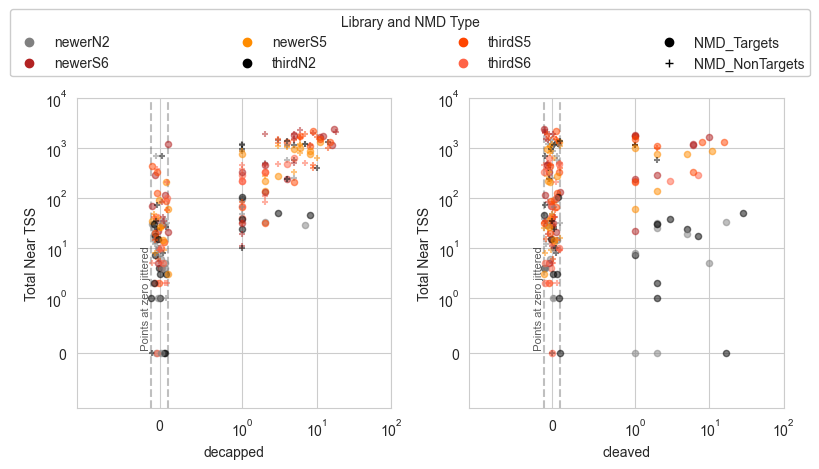

In [208]:
import seaborn.objects as so
import matplotlib.lines as mlines

linthresh = 1
jitter_denominator = 10

# xcols = ['ada_tss/unada_tss', 'ada_stop/unada_tss']
xcols = ['adapted_near_tss', 'adapted_near_stop']
ycol = 'total_tss'

lib_colors = {
    'newerN2': 'grey',
    'newerS6': 'firebrick',
    'newerS5': 'darkorange',
    'thirdN2': 'black',
    'thirdS6': 'tomato',
    'thirdS5': 'orangered',
}

# fig, axes = plt.subplots(2, 2, figsize=(8, 8))
# ((ax1, ax2), (ax3, ax4)) = axes
fig, axes = plt.subplots(1, 2, figsize=(8, 4))
ax1, ax2 = axes

nmd_types_to_plot = [
    'NMD_Targets',
    'NMD_NonTargets',
]
plot_df = plotting_summary_df.query("nmd_target_type in @nmd_types_to_plot").copy()

plot_df['total_tss'] = plot_df['adapted_near_tss'] + plot_df['unadapted_near_tss']
plot_df['total_stop'] = plot_df['adapted_near_stop'] + plot_df['unadapted_near_tss']

plot_df['ada_tss/total_tss'] = plot_df['adapted_near_tss'] / plot_df['total_tss']
plot_df['ada_stop/total_tss'] = plot_df['adapted_near_stop'] / plot_df['total_tss']

plot_df['lib_colors'] = plot_df.lib.map(lib_colors)
plot_df[xcols[0]] = plot_df[xcols[0]].transform(lambda x: np.random.uniform(
    -linthresh/jitter_denominator,
    linthresh/jitter_denominator,
) if x == 0 else x)
plot_df[xcols[1]] = plot_df[xcols[1]].transform(lambda x: np.random.uniform(
    -linthresh/jitter_denominator,
    linthresh/jitter_denominator,
) if x == 0 else x)

for gene in plot_df.gene_name.unique():
    sub_gene_plot_df = plot_df.query("gene_name == @gene")
    for lib in sub_gene_plot_df.lib.unique():
        sub_lib_plot_df = sub_gene_plot_df.query("lib == @lib")
        marker_types = ['o', '+']
        for i, nmd_target_type in enumerate(sub_lib_plot_df.nmd_target_type.unique()):
            sub_lib_type_plot_df = sub_gene_plot_df.query("lib == @lib & nmd_target_type == @nmd_target_type")
            sub_lib_type_plot_df.plot(x=xcols[0],
                                 y=ycol,
                                 kind='scatter',
                                 marker=marker_types[i],
                                 ax=ax1,
                                 c=sub_lib_type_plot_df['lib_colors'],
                                 alpha=0.5,
                                 zorder=100)
            sub_lib_type_plot_df.plot(x=xcols[1],
                                 y=ycol,
                                 kind='scatter',
                                 marker=marker_types[i],
                                 ax=ax2,
                                 c=sub_lib_type_plot_df['lib_colors'],
                                 alpha=0.5,
                                 zorder=100)
for ax in axes.flat:
    ax.set_xscale('symlog', linthresh=linthresh)
    ax.set_xlim(-linthresh, 1e2)
    ax.set_yscale('symlog', linthresh=1)
    legend = ax.get_legend()
    if legend is not None:
        legend.remove()
    ax.axvline(-linthresh/jitter_denominator,
               color='k', linestyle='--',
               alpha=0.25)
    ax.axvline(linthresh/jitter_denominator,
               color='k', linestyle='--',
               alpha=0.25)
    ax.annotate(' Points at zero jittered',
                xy=(-linthresh/jitter_denominator, 0),
                xytext=(-linthresh/jitter_denominator, 0),
                rotation=90,
                alpha=0.75,
                fontsize=8,
                horizontalalignment='right',
                verticalalignment='bottom',
                )

ax1.set_xlabel("decapped")
ax1.set_ylabel("Total Near TSS")
ax2.set_xlabel("cleaved")
ax2.set_ylabel("Total Near TSS")

ax1.set_ylim(-1e0, 1e4)
ax2.set_ylim(-1e0, 1e4)

legend_items = [mlines.Line2D([],
                              [],
                              color=lib_colors[lib],
                              marker='o',
                              linestyle='',
                              label=lib) for lib in plot_df.lib.unique()]
if len(plot_df.nmd_target_type.unique()) > 1:
    legend_items.extend([mlines.Line2D([],
                                       [],
                                       color='black',
                                       marker=marker,
                                       linestyle='',
                                       label=nmd_target_type) for nmd_target_type, marker in zip(plot_df.nmd_target_type.unique(), marker_types)])
    fig.legend(handles=legend_items, title='Library and NMD Type',
               loc='upper center',
               bbox_to_anchor=(0.0, 1.06, 1.0, 0.102),
               ncols=4,
               mode='expand',
               borderaxespad=0.0,
               facecolor='w',
               framealpha=1,
               )
else:
    fig.legend(handles=legend_items, title='Library',
               loc='upper center',
               bbox_to_anchor=(0.0, 1.00, 1.0, 0.102),
               ncols=6,
               mode='expand',
               borderaxespad=0.0,
               facecolor='w',
               framealpha=1,
               )

plt.tight_layout()
plt.draw()
save_dir = current_dir / 'plots' / 'decappingAndCleavage'
save_dir.mkdir(exist_ok=True, parents=True)
plt.savefig(save_dir / f"SummaryPlot{len(plot_df.nmd_target_type.unique())}.png",
            dpi=300, bbox_inches='tight')
plt.savefig(save_dir / f"SummaryPlot{len(plot_df.nmd_target_type.unique())}.svg",
            bbox_inches='tight')
plt.show()

In [223]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

xcols = ['adapted_near_tss', 'adapted_near_stop']
ycol = 'total_tss'

lib_colors = {
    'newerN2': 'grey',
    'newerS6': 'firebrick',
    'newerS5': 'darkorange',
    'thirdN2': 'black',
    'thirdS6': 'tomato',
    'thirdS5': 'orangered',
}

nmd_types_to_plot = [
    'NMD_Targets',
    'NMD_NonTargets',
]
plot_df = plotting_summary_df.query("nmd_target_type in @nmd_types_to_plot").copy()

plot_df['total_tss'] = plot_df['adapted_near_tss'] + plot_df['unadapted_near_tss']
plot_df['total_stop'] = plot_df['adapted_near_stop'] + plot_df['unadapted_near_stop']

plot_df['ada_tss/total_tss'] = plot_df['adapted_near_tss'] / plot_df['total_tss']
plot_df['ada_stop/total_tss'] = plot_df['adapted_near_stop'] / plot_df['total_tss']

plot_df['lib_colors'] = plot_df.lib.map(lib_colors)

figures = []
# for xcol in xcols:
#     figures.append(px.scatter(plot_df,
#                               x=xcol,
#                               y=ycol,
#                               color='lib',
#                               symbol='nmd_target_type',
#                               color_discrete_map=lib_colors,
#                               symbol_sequence=['circle', 'cross'],
#                               log_x=True,
#                               log_y=True,
#                               title=f"{xcol} vs {ycol}",
#                               hover_name='gene_name',
#                               hover_data=[
#                                   'lib',
#                                   'nmd_target_type',
#                                   'total_unadapted',
#                                   'total_adapted',
#                                   'total_tss',
#                                   'total_stop',
#                                           ],
#                               
#                               )
#                      )
for i, xcol in enumerate(xcols):
    for gene_name in plot_df['gene_name'].unique():
        gene_df = plot_df[plot_df['gene_name'] == gene_name]
        figures.append(go.Scatter(
            x=gene_df[xcol],
            y=gene_df[ycol],
            mode='markers',
            marker=dict(
                color=gene_df['lib_colors'],
                symbol=gene_df['nmd_target_type'].map({'NMD_Targets': 'circle', 'NMD_NonTargets': 'cross'}),
                size=10
            ),
            name=gene_name,
            legendgroup=gene_name,
            showlegend=True if i == 0 else False,
        ))
fig = make_subplots(rows=1, cols=(len(xcols)))
for i, figure in enumerate(figures):
    fig.add_trace(figure, row=1, col=(i % len(xcols))+1)

# We need to add axis labels:
fig.update_xaxes(title_text="Decapped", row=1, col=1)
fig.update_xaxes(title_text="Cleaved", row=1, col=2)
fig.update_yaxes(title_text="Total Near TSS", row=1, col=1)
fig.update_yaxes(title_text="Total Near TSS", row=1, col=2)


fig.show(renderer='firefox')